# Use PEP Dataset to Detect County Level Migration
**Contents:**
* [Preprocess](#county)
* [Net Migration Rate for each county from 2000-2020](#NMR)
* [Net Migration Rate for each year](#year)
* [Regression Analysis](#re)
* [Organized Results](#result)

In [1]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import contextily as cx
import statsmodels.api as sm
import matplotlib.patches as mpatches
import matplotlib.ticker as ticker
import matplotlib.dates as mdates
from scipy.stats import pearsonr, spearmanr
from scipy.stats import ttest_ind
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from matplotlib.colors import ListedColormap

# Preprocess <a class="anchor" id="county"></a>

In [2]:
data_path = r"F:/IRS_Migration/"
SHELDUS = pd.read_csv("F:/SHELDUS/ORIGINAL.csv")
state    = gpd.read_file("D:/Users/xiang11/Documents/GitHub/EvacuationIan/datasets/usstate/cb_2018_us_state_500k.shp").to_crs('ESRI:102003')
county  = gpd.read_file("D:/Users/xiang11/Documents/GitHub/EvacuationIan/datasets/maincounty/us_conu_county.shp").to_crs('ESRI:102003')
df_pep_2010 = pd.read_csv(r"F:\PEP\co-est2010-alldata.csv", encoding='latin-1')
df_pep_2020 = pd.read_csv(r"F:\PEP\co-est2020-alldata.csv", encoding='latin-1')
SVI_10 = pd.read_csv(r"F:\PEP\SVI_2010_US_county.csv")

SVI_10['FIPS'] = SVI_10['FIPS'].astype("str").str.rjust(5,"0")

state = state[~state["NAME"].isin(["Alaska","Hawaii","Puerto Rico",
                                   "American Samoa","United States Virgin Islands",
                                   "Guam","Commonwealth of the Northern Mariana Islands"])]

## SHELDUS DOC
https://cemhs.asu.edu/sheldus/metadata

In [3]:
SHELDUS['County FIPS'] = SHELDUS['County FIPS'].str.replace("'", "")
SHELDUS_0020 = SHELDUS[(SHELDUS["Year"]<2021) & (SHELDUS["Year"]>2000)]

In [4]:
SHELDUS_0020_sel = SHELDUS_0020[SHELDUS_0020["Hazard"].isin(['Flooding','Hurricane/Tropical Storm','Wildfire'])].reset_index(drop=True)

In [31]:
SHELDUS_0020_hurricane = SHELDUS_0020_sel[SHELDUS_0020_sel["Hazard"]=="Hurricane/Tropical Storm"].reset_index()
SHELDUS_0020_flooding  = SHELDUS_0020_sel[SHELDUS_0020_sel["Hazard"]=="Flooding"].reset_index()

In [46]:
hurricane_induced_floods = pd.merge(
    SHELDUS_0020_flooding, 
    SHELDUS_0020_hurricane, 
    on=['County FIPS', 'Year', 'Month'],
    suffixes=('_flood', '_hurricane')
)
flood_indices = hurricane_induced_floods['index_flood']

In [47]:
SHELDUS_0020_sel.loc[flood_indices, 'Hazard'] = 'Hurricane/Tropical Storm'

In [48]:
SHELDUS_0020_use = SHELDUS_0020_sel[(SHELDUS_0020_sel["Fatalities"]!=0)|(SHELDUS_0020_sel["Injuries"]!=0)|(SHELDUS_0020_sel["PropertyDmgPerCapita(ADJ 2020)"]>1)]
SHELDUS_0020_use_group = SHELDUS_0020_use.groupby(["County FIPS","Hazard","Year"]).agg({"Month":"count",
                                                                                        "Fatalities":"sum",
                                                                                        "Injuries":"sum",
                                                                                        "PropertyDmg(ADJ 2020)":"sum",
                                                                                        "PropertyDmgPerCapita(ADJ 2020)":"mean"}).reset_index()
SHELDUS_0020_use_group = SHELDUS_0020_use_group.rename(columns={"Month":"count"})
df_20_years_by_county = SHELDUS_0020_use_group.groupby(['County FIPS',"Hazard"]).agg({"count":"sum",
                                                                                        "Fatalities":"sum",
                                                                                        "Injuries":"sum",
                                                                                        "PropertyDmg(ADJ 2020)":"sum",
                                                                                        "PropertyDmgPerCapita(ADJ 2020)":"mean"}).reset_index()


In [49]:
conditions1 = [
    SHELDUS_0020_use_group["Year"].between(2001,2011, inclusive="left"),
    SHELDUS_0020_use_group["Year"].between(2011,2021, inclusive="left")
]

choices1 = ["2001-2010", "2011-2020"]

SHELDUS_0020_use_group['decade'] = np.select(conditions1, choices1, default=np.nan)


conditions2 = [
    SHELDUS_0020_use_group["Year"].between(2001,2006, inclusive="left"),
    SHELDUS_0020_use_group["Year"].between(2006,2011, inclusive="left"),
    SHELDUS_0020_use_group["Year"].between(2011,2016, inclusive="left"),
    SHELDUS_0020_use_group["Year"].between(2016,2021, inclusive="left")
]

choices2 = ["2001-2005", "2006-2010","2011-2015", "2016-2020"]

SHELDUS_0020_use_group['interval'] = np.select(conditions2, choices2, default=np.nan)

In [50]:
df_10_years_by_county = SHELDUS_0020_use_group.groupby(['County FIPS',"Hazard","decade"]).agg({"count":"sum",
                                                                                        "Fatalities":"sum",
                                                                                        "Injuries":"sum",
                                                                                        "PropertyDmg(ADJ 2020)":"sum",
                                                                                        "PropertyDmgPerCapita(ADJ 2020)":"mean"}).reset_index()

df_5_years_by_county = SHELDUS_0020_use_group.groupby(['County FIPS',"Hazard","interval"]).agg({"count":"sum",
                                                                                        "Fatalities":"sum",
                                                                                        "Injuries":"sum",
                                                                                        "PropertyDmg(ADJ 2020)":"sum",
                                                                                        "PropertyDmgPerCapita(ADJ 2020)":"mean"}).reset_index()


In [51]:
SHELDUS_20_use_flooding  = df_20_years_by_county[df_20_years_by_county["Hazard"]=="Flooding"]
SHELDUS_20_use_hurricane = df_20_years_by_county[df_20_years_by_county["Hazard"]=="Hurricane/Tropical Storm"]
SHELDUS_20_use_wildfire  = df_20_years_by_county[df_20_years_by_county["Hazard"]=="Wildfire"]

SHELDUS_10_use_flooding  = df_10_years_by_county[df_10_years_by_county["Hazard"]=="Flooding"]
SHELDUS_10_use_hurricane = df_10_years_by_county[df_10_years_by_county["Hazard"]=="Hurricane/Tropical Storm"]
SHELDUS_10_use_wildfire  = df_10_years_by_county[df_10_years_by_county["Hazard"]=="Wildfire"]

SHELDUS_5_use_flooding   = df_5_years_by_county[df_5_years_by_county["Hazard"]=="Flooding"]
SHELDUS_5_use_hurricane  = df_5_years_by_county[df_5_years_by_county["Hazard"]=="Hurricane/Tropical Storm"]
SHELDUS_5_use_wildfire   = df_5_years_by_county[df_5_years_by_county["Hazard"]=="Wildfire"]

In [52]:
def classify_impact(data, value_column):
    Q1 = data[value_column].quantile(0.25)
    Q3 = data[value_column].quantile(0.75)
    
    def classification(value):
        if value <= Q1:
            return 'Low Impact'
        elif (value > Q1) & (value < Q3):
            return 'Moderate Impact'
        elif value >= Q3:
            return 'High Impact'
    
    return data[value_column].apply(classification)

In [53]:
Q1_20_flooding = SHELDUS_20_use_flooding["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.25)
Q3_20_flooding = SHELDUS_20_use_flooding["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.75)

Q1_20_hurricane = SHELDUS_20_use_hurricane["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.25)
Q3_20_hurricane = SHELDUS_20_use_hurricane["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.75)

Q1_20_wildfire = SHELDUS_20_use_wildfire["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.25)
Q3_20_wildfire = SHELDUS_20_use_wildfire["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.75)

Q1_10_flooding = SHELDUS_10_use_flooding["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.25)
Q3_10_flooding = SHELDUS_10_use_flooding["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.75)

Q1_10_hurricane = SHELDUS_10_use_hurricane["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.25)
Q3_10_hurricane = SHELDUS_10_use_hurricane["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.75)

Q1_10_wildfire = SHELDUS_10_use_wildfire["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.25)
Q3_10_wildfire = SHELDUS_10_use_wildfire["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.75)

In [54]:
SHELDUS_20_use_flooding['ImpactLevel'] = classify_impact(SHELDUS_20_use_flooding, "PropertyDmgPerCapita(ADJ 2020)")
SHELDUS_20_use_hurricane['ImpactLevel'] = classify_impact(SHELDUS_20_use_hurricane, "PropertyDmgPerCapita(ADJ 2020)")
SHELDUS_20_use_wildfire['ImpactLevel'] = classify_impact(SHELDUS_20_use_wildfire, "PropertyDmgPerCapita(ADJ 2020)")
SHELDUS_10_use_flooding['ImpactLevel'] = classify_impact(SHELDUS_10_use_flooding, "PropertyDmgPerCapita(ADJ 2020)")
SHELDUS_10_use_hurricane['ImpactLevel'] = classify_impact(SHELDUS_10_use_hurricane, "PropertyDmgPerCapita(ADJ 2020)")
SHELDUS_10_use_wildfire['ImpactLevel'] = classify_impact(SHELDUS_10_use_wildfire, "PropertyDmgPerCapita(ADJ 2020)")

C:\Users\xiang11\AppData\Local\Temp\ipykernel_3800\3703201973.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  SHELDUS_20_use_flooding['ImpactLevel'] = classify_impact(SHELDUS_20_use_flooding, "PropertyDmgPerCapita(ADJ 2020)")
C:\Users\xiang11\AppData\Local\Temp\ipykernel_3800\3703201973.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  SHELDUS_20_use_hurricane['ImpactLevel'] = classify_impact(SHELDUS_20_use_hurricane, "PropertyDmgPerCapita(ADJ 2020)")
C:\Users\xiang11\AppData\Local\Temp\ipykernel_3800

In [55]:
SHELDUS_flooding_county  = list(SHELDUS_20_use_flooding["County FIPS"].unique())
SHELDUS_hurricane_county = list(SHELDUS_20_use_hurricane["County FIPS"].unique())
SHELDUS_wildfire_county  = list(SHELDUS_20_use_wildfire["County FIPS"].unique())

flooding_county  = county[county["FIPS"].isin(SHELDUS_flooding_county)].reset_index(drop=True)
hurricane_county = county[county["FIPS"].isin(SHELDUS_hurricane_county)].reset_index(drop=True)
wildfire_county  = county[county["FIPS"].isin(SHELDUS_wildfire_county)].reset_index(drop=True)

In [56]:
df_SHELDUS_20_flooding_county  = pd.merge(SHELDUS_20_use_flooding,flooding_county,left_on="County FIPS",right_on="FIPS")
df_SHELDUS_20_hurricane_county = pd.merge(SHELDUS_20_use_hurricane,hurricane_county,left_on="County FIPS",right_on="FIPS")
df_SHELDUS_20_wildfire_county  = pd.merge(SHELDUS_20_use_wildfire,wildfire_county,left_on="County FIPS",right_on="FIPS")

gdf_SHELDUS_20_flooding_county = gpd.GeoDataFrame(df_SHELDUS_20_flooding_county,geometry="geometry")
gdf_SHELDUS_20_hurricane_county= gpd.GeoDataFrame(df_SHELDUS_20_hurricane_county,geometry="geometry")
gdf_SHELDUS_20_wildfire_county = gpd.GeoDataFrame(df_SHELDUS_20_wildfire_county,geometry="geometry")

df_SHELDUS_10_flooding_county  = pd.merge(SHELDUS_10_use_flooding,flooding_county,left_on="County FIPS",right_on="FIPS")
df_SHELDUS_10_hurricane_county = pd.merge(SHELDUS_10_use_hurricane,hurricane_county,left_on="County FIPS",right_on="FIPS")
df_SHELDUS_10_wildfire_county  = pd.merge(SHELDUS_10_use_wildfire,wildfire_county,left_on="County FIPS",right_on="FIPS")

gdf_SHELDUS_10_flooding_county = gpd.GeoDataFrame(df_SHELDUS_10_flooding_county,geometry="geometry")
gdf_SHELDUS_10_hurricane_county= gpd.GeoDataFrame(df_SHELDUS_10_hurricane_county,geometry="geometry")
gdf_SHELDUS_10_wildfire_county = gpd.GeoDataFrame(df_SHELDUS_10_wildfire_county,geometry="geometry")

df_SHELDUS_5_flooding_county  = pd.merge(SHELDUS_5_use_flooding,flooding_county,left_on="County FIPS",right_on="FIPS")
df_SHELDUS_5_hurricane_county = pd.merge(SHELDUS_5_use_hurricane,hurricane_county,left_on="County FIPS",right_on="FIPS")
df_SHELDUS_5_wildfire_county  = pd.merge(SHELDUS_5_use_wildfire,wildfire_county,left_on="County FIPS",right_on="FIPS")

gdf_SHELDUS_5_flooding_county = gpd.GeoDataFrame(df_SHELDUS_5_flooding_county,geometry="geometry")
gdf_SHELDUS_5_hurricane_county= gpd.GeoDataFrame(df_SHELDUS_5_hurricane_county,geometry="geometry")
gdf_SHELDUS_5_wildfire_county = gpd.GeoDataFrame(df_SHELDUS_5_wildfire_county,geometry="geometry")

In [57]:
gdf_SHELDUS_20_flooding_county_low = gdf_SHELDUS_20_flooding_county[gdf_SHELDUS_20_flooding_county["ImpactLevel"]=="Low Impact"]
gdf_SHELDUS_20_flooding_county_med = gdf_SHELDUS_20_flooding_county[gdf_SHELDUS_20_flooding_county["ImpactLevel"]=="Moderate Impact"]
gdf_SHELDUS_20_flooding_county_high= gdf_SHELDUS_20_flooding_county[gdf_SHELDUS_20_flooding_county["ImpactLevel"]=="High Impact"]

gdf_SHELDUS_20_hurricane_county_low = gdf_SHELDUS_20_hurricane_county[gdf_SHELDUS_20_hurricane_county["ImpactLevel"]=="Low Impact"]
gdf_SHELDUS_20_hurricane_county_med = gdf_SHELDUS_20_hurricane_county[gdf_SHELDUS_20_hurricane_county["ImpactLevel"]=="Moderate Impact"]
gdf_SHELDUS_20_hurricane_county_high= gdf_SHELDUS_20_hurricane_county[gdf_SHELDUS_20_hurricane_county["ImpactLevel"]=="High Impact"]

gdf_SHELDUS_20_wildfire_county_low = gdf_SHELDUS_20_wildfire_county[gdf_SHELDUS_20_wildfire_county["ImpactLevel"]=="Low Impact"]
gdf_SHELDUS_20_wildfire_county_med = gdf_SHELDUS_20_wildfire_county[gdf_SHELDUS_20_wildfire_county["ImpactLevel"]=="Moderate Impact"]
gdf_SHELDUS_20_wildfire_county_high= gdf_SHELDUS_20_wildfire_county[gdf_SHELDUS_20_wildfire_county["ImpactLevel"]=="High Impact"]

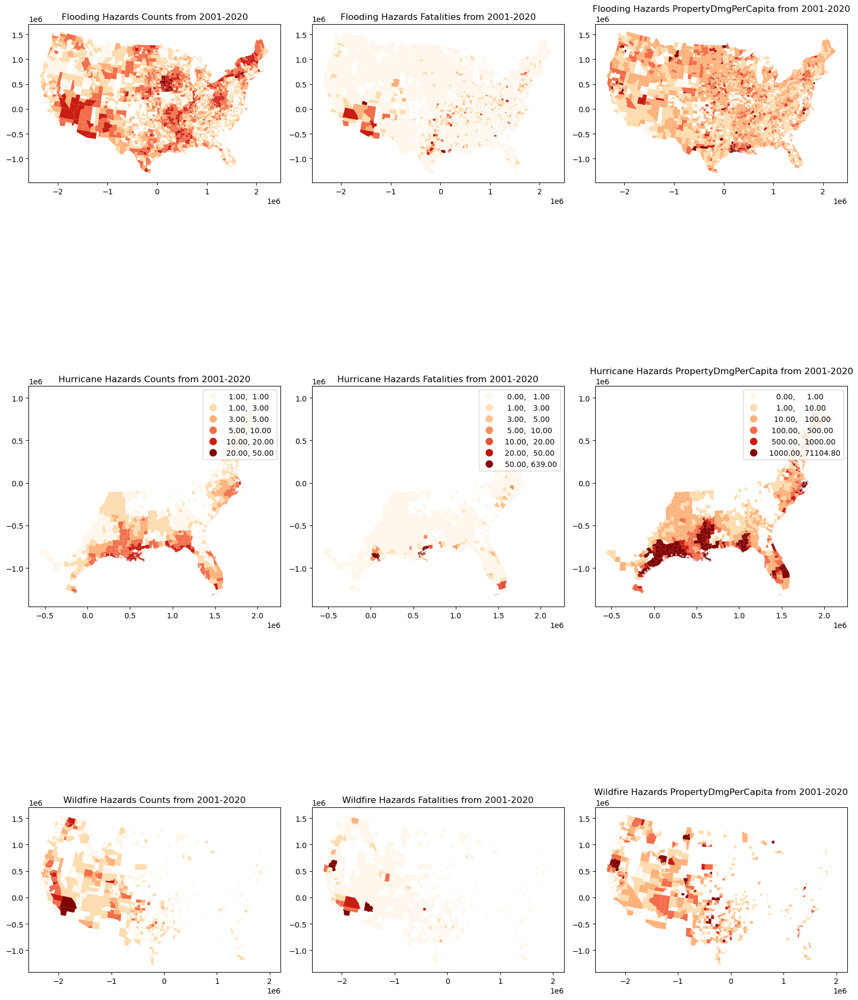

In [58]:
fig, axes = plt.subplots(3,3,figsize=(16,24))
gdf_SHELDUS_20_flooding_county.plot(column="count",cmap="OrRd",
                                    scheme='userdefined',classification_kwds={'bins':[1,3,5,10,20,50]},
#                                     scheme="percentiles",
#                                     legend=True,
                                    ax=axes[0,0])
gdf_SHELDUS_20_flooding_county.plot(column="Fatalities",cmap="OrRd",
                                    scheme='userdefined',classification_kwds={'bins':[1,3,5,10,20,50]},
#                                     scheme="FisherJenksSampled",
#                                     legend=True,
                                    ax=axes[0,1])
gdf_SHELDUS_20_flooding_county.plot(column="PropertyDmgPerCapita(ADJ 2020)",
                                    scheme='userdefined',classification_kwds={'bins':[1,10,100,500,1000]},
#                                     scheme="percentiles",
                                    cmap="OrRd",
#                                     legend=True,
                                    ax=axes[0,2])

gdf_SHELDUS_20_hurricane_county.plot(column="count",cmap="OrRd",
                                    scheme='userdefined',classification_kwds={'bins':[1,3,5,10,20,50]},
#                                     scheme="percentiles",
                                    legend=True,
                                     ax=axes[1,0])
gdf_SHELDUS_20_hurricane_county.plot(column="Fatalities",cmap="OrRd",
                                    scheme='userdefined',classification_kwds={'bins':[1,3,5,10,20,50]},
#                                     scheme="FisherJenksSampled",
                                    legend=True,
                                     ax=axes[1,1])
gdf_SHELDUS_20_hurricane_county.plot(column="PropertyDmgPerCapita(ADJ 2020)",
                                    scheme='userdefined',classification_kwds={'bins':[1,10,100,500,1000]},
#                                     scheme="percentiles",
                                    cmap="OrRd",legend=True,ax=axes[1,2])

gdf_SHELDUS_20_wildfire_county.plot(column="count",cmap="OrRd",
                                    scheme='userdefined',classification_kwds={'bins':[1,3,5,10,20,50]},
#                                     scheme="percentiles",
#                                     legend=True,
                                    ax=axes[2,0])
gdf_SHELDUS_20_wildfire_county.plot(column="Fatalities",cmap="OrRd",
                                    scheme='userdefined',classification_kwds={'bins':[1,3,5,10,20,50]},
#                                     scheme="FisherJenksSampled",
#                                     legend=True,
                                    ax=axes[2,1])
gdf_SHELDUS_20_wildfire_county.plot(column="PropertyDmgPerCapita(ADJ 2020)",
                                    scheme='userdefined',classification_kwds={'bins':[1,10,100,500,1000]},
#                                     scheme="percentiles",
                                    cmap="OrRd",
#                                     legend=True,
                                    ax=axes[2,2])

axes[0,0].set_title("Flooding Hazards Counts from 2001-2020")
axes[1,0].set_title("Hurricane Hazards Counts from 2001-2020")
axes[2,0].set_title("Wildfire Hazards Counts from 2001-2020")

axes[0,1].set_title("Flooding Hazards Fatalities from 2001-2020")
axes[1,1].set_title("Hurricane Hazards Fatalities from 2001-2020")
axes[2,1].set_title("Wildfire Hazards Fatalities from 2001-2020")

axes[0,2].set_title("Flooding Hazards PropertyDmgPerCapita from 2001-2020")
axes[1,2].set_title("Hurricane Hazards PropertyDmgPerCapita from 2001-2020")
axes[2,2].set_title("Wildfire Hazards PropertyDmgPerCapita from 2001-2020")

plt.tight_layout()
plt.show()

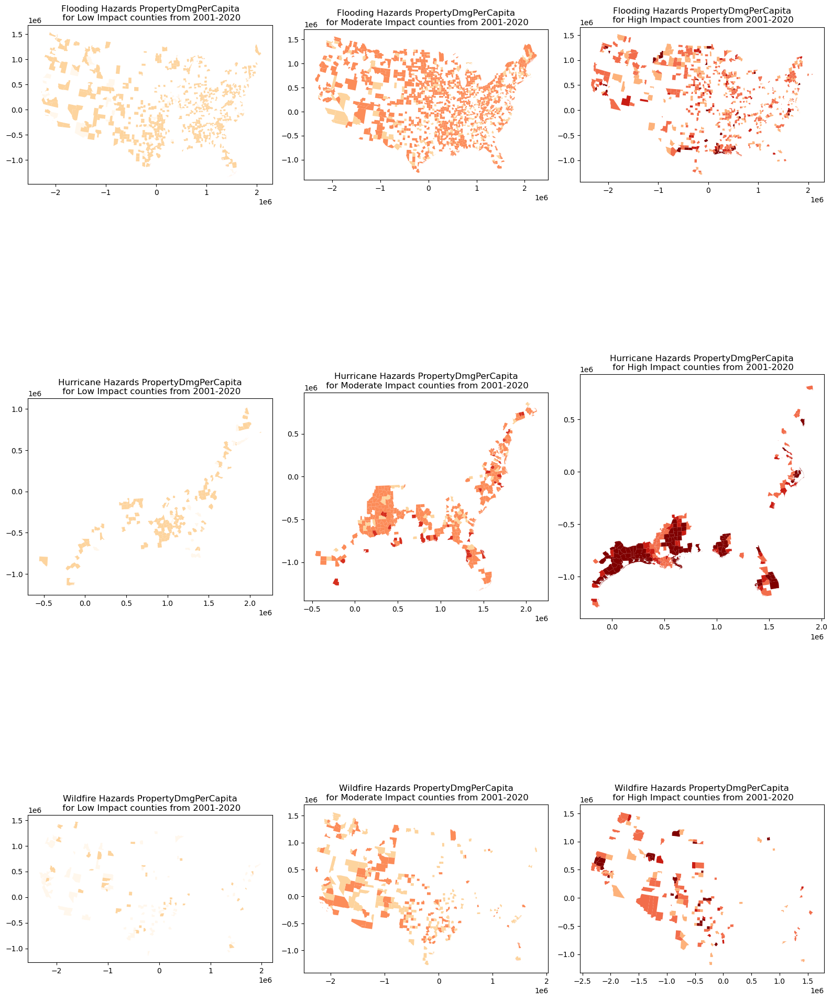

In [60]:
i = 0
fig, axes = plt.subplots(3,3,figsize=(16,24))
for level in ["Low Impact","Moderate Impact","High Impact"]:
    flooding_county_20 = gdf_SHELDUS_20_flooding_county[gdf_SHELDUS_20_flooding_county["ImpactLevel"]==level]
    flooding_county_20.plot(column="PropertyDmgPerCapita(ADJ 2020)",
                                    scheme='userdefined',classification_kwds={'bins':[1,10,100,500,1000]},
                                    cmap="OrRd",
                                    ax=axes[0,i])
    hurricane_county_20 = gdf_SHELDUS_20_hurricane_county[gdf_SHELDUS_20_hurricane_county["ImpactLevel"]==level]
    hurricane_county_20.plot(column="PropertyDmgPerCapita(ADJ 2020)",
                                    scheme='userdefined',classification_kwds={'bins':[1,10,100,500,1000]},
                                    cmap="OrRd",
                                    ax=axes[1,i])
    wildfire_county_20 = gdf_SHELDUS_20_wildfire_county[gdf_SHELDUS_20_wildfire_county["ImpactLevel"]==level]
    wildfire_county_20.plot(column="PropertyDmgPerCapita(ADJ 2020)",
                                    scheme='userdefined',classification_kwds={'bins':[1,10,100,500,1000]},
                                    cmap="OrRd",
                                    ax=axes[2,i])
    axes[0,i].set_title(f"Flooding Hazards PropertyDmgPerCapita\n for {level} counties from 2001-2020")
    axes[1,i].set_title(f"Hurricane Hazards PropertyDmgPerCapita\n for {level} counties from 2001-2020")
    axes[2,i].set_title(f"Wildfire Hazards PropertyDmgPerCapita\n for {level} counties from 2001-2020")
    
    i = i+1
    
plt.tight_layout()
plt.show()


In [163]:
flooding_county_list_20  = []
hurricane_county_list_20 = []
wildfire_county_list_20  = []

for level in ["Low Impact","Moderate Impact","High Impact"]:
    flooding_county_20 = gdf_SHELDUS_20_flooding_county[gdf_SHELDUS_20_flooding_county["ImpactLevel"]==level]
    flooding_county_list_20.append(list(flooding_county_20["County FIPS"].unique()))
    
    hurricane_county_20 = gdf_SHELDUS_20_hurricane_county[gdf_SHELDUS_20_hurricane_county["ImpactLevel"]==level]
    hurricane_county_list_20.append(list(hurricane_county_20["County FIPS"].unique()))
    
    wildfire_county_20 = gdf_SHELDUS_20_wildfire_county[gdf_SHELDUS_20_wildfire_county["ImpactLevel"]==level]
    wildfire_county_list_20.append(list(wildfire_county_20["County FIPS"].unique()))

In [62]:
df_pep_2010["state"] = df_pep_2010["STATE"].astype('int64').astype('str').str.rjust(2, "0")
df_pep_2010["county"] = df_pep_2010["COUNTY"].astype('int64').astype('str').str.rjust(3, "0")
df_pep_2010["FIPS"] = df_pep_2010["state"] + df_pep_2010["county"]

df_pep_2020["state"] = df_pep_2020["STATE"].astype('int64').astype('str').str.rjust(2, "0")
df_pep_2020["county"] = df_pep_2020["COUNTY"].astype('int64').astype('str').str.rjust(3, "0")
df_pep_2020["FIPS"] = df_pep_2020["state"] + df_pep_2020["county"]

In [63]:
df_pep_0120 = pd.merge(df_pep_2010,df_pep_2020,on="FIPS")

In [64]:
correct_netmig_columns = []
for year in range(2001, 2021):
    column_name_x = f'RNETMIG{year}_x'
    column_name_y = f'RNETMIG{year}_y'
    column_name = f'RNETMIG{year}'
    if column_name in df_pep_0120.columns:
        correct_netmig_columns.append(column_name)
    elif column_name_x in df_pep_0120.columns:
        correct_netmig_columns.append(column_name_x)
    elif column_name_y in df_pep_0120.columns:
        correct_netmig_columns.append(column_name_y)
        
# columns_needed = ['STNAME_x', 'CTYNAME_x', 'CENSUS2000POP', 'CENSUS2010POP'] + correct_netmig_columns
# relevant_data = data[columns_needed]

In [65]:
columns_needed = ['FIPS','STNAME_x', 'CTYNAME_x', 'CENSUS2000POP', 'CENSUS2010POP'] + correct_netmig_columns
relevant_data = df_pep_0120[columns_needed]

In [66]:
relevant_data['CENSUS2010POP'] = relevant_data['CENSUS2010POP'].astype('float')

C:\Users\xiang11\AppData\Local\Temp\ipykernel_3800\3865312276.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  relevant_data['CENSUS2010POP'] = relevant_data['CENSUS2010POP'].astype('float')


# Net Migration Rate <a class="anchor" id="NMR"></a>

### NetMigrationRate1 is calculated by average net migration rate
### NetMigrationRate2 is calculated by (migration pop/average pop * 1000)
### NetMigrationRate1 is better in the further results

In [67]:
relevant_data['AveragePopulation'] = (relevant_data['CENSUS2000POP'] + relevant_data['CENSUS2010POP']) / 2
relevant_data['TotalNetMigration'] = relevant_data[correct_netmig_columns].sum(axis=1)
relevant_data['NetMigrationRate1'] = relevant_data[correct_netmig_columns].mean(axis=1)
relevant_data['NetMigrationRate2'] = (relevant_data['TotalNetMigration'] / relevant_data['AveragePopulation']) * 1000
final_data = relevant_data[['FIPS','STNAME_x', 'CTYNAME_x', 'TotalNetMigration', 'AveragePopulation', 'NetMigrationRate1', 'NetMigrationRate2']]

C:\Users\xiang11\AppData\Local\Temp\ipykernel_3800\433456365.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  relevant_data['AveragePopulation'] = (relevant_data['CENSUS2000POP'] + relevant_data['CENSUS2010POP']) / 2
C:\Users\xiang11\AppData\Local\Temp\ipykernel_3800\433456365.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  relevant_data['TotalNetMigration'] = relevant_data[correct_netmig_columns].sum(axis=1)
C:\Users\xiang11\AppData\Local\Temp\ipykernel_3800\433456365.py:3: SettingWithCopyWarning: 


In [68]:
df_NMR = pd.merge(final_data,county,on="FIPS",how="inner")
gdf_NMR = gpd.GeoDataFrame(df_NMR,geometry="geometry")

Text(0.5, 1.0, 'Net Migration Rate from 2001-2020 (Calculated by Average Migration Rate)')

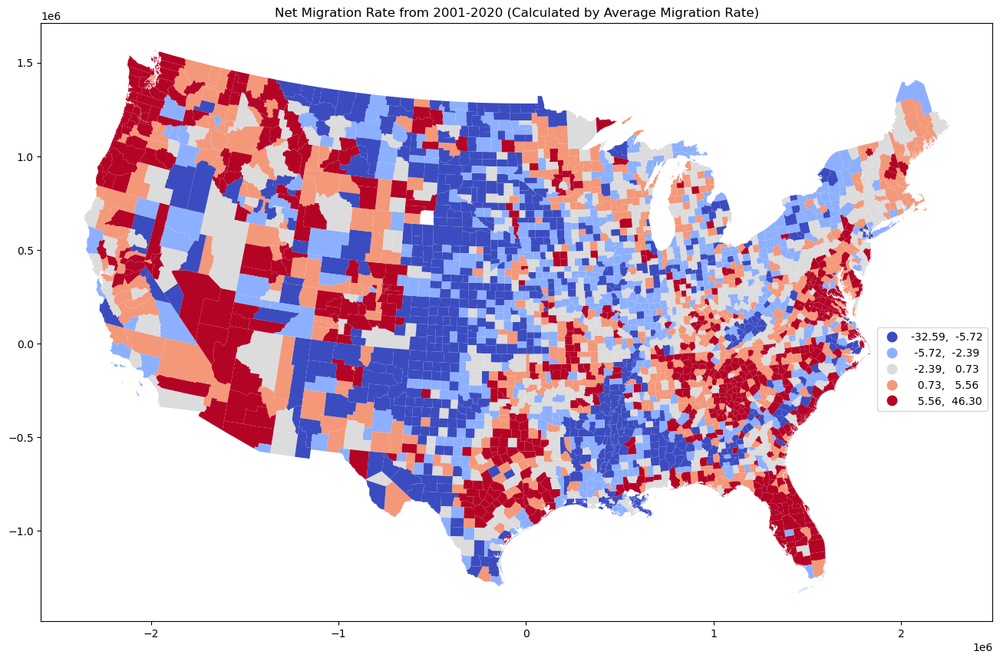

In [73]:
fig, ax = plt.subplots(1, 1, figsize=(16, 20))
gdf_NMR.plot(column="NetMigrationRate1",cmap="coolwarm",
             scheme="quantiles",
#              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,ax=ax)
leg = ax.get_legend()
leg.set_bbox_to_anchor(( 1, 0.5)) 
ax.set_title("Net Migration Rate from 2001-2020 (Calculated by Average Migration Rate)")

# gdf_NMR.plot(column="NetMigrationRate2",cmap="coolwarm",
#              scheme="quantiles",
# #              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
#              legend=True,ax=ax[1])
# leg = ax[1].get_legend()
# leg.set_bbox_to_anchor(( 1, 0.5)) 
# ax[1].set_title("Net Migration Rate from 2001-2020")
# cx.add_basemap(ax=ax[1], source=cx.providers.CartoDB.Positron, crs=gdf_NMR.crs)

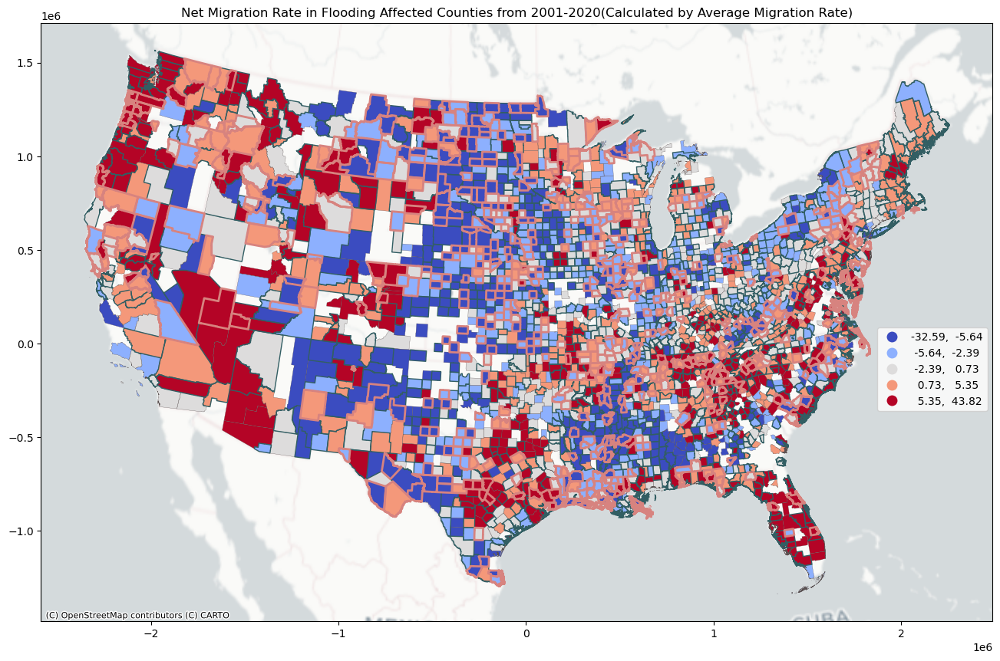

In [88]:
gdf_NMR_flooding = gdf_NMR[gdf_NMR["FIPS"].isin(SHELDUS_flooding_county)].reset_index(drop=True)

fig, ax = plt.subplots(1, 1, figsize=(16, 20))
gdf_NMR_flooding.plot(column="NetMigrationRate1",cmap="coolwarm",
                      scheme="quantiles",
#              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,ax=ax)
leg = ax.get_legend()
leg.set_bbox_to_anchor(( 1, 0.5)) 

properties_map = {
    'Low Impact': {'color': '#584f4f', 'linewidth': 0.2},
    'Moderate Impact': {'color': '#325e63', 'linewidth': 1},
    'High Impact': {'color': '#d7837f', 'linewidth': 2}
}

gdf_SHELDUS_20_flooding_county['line_color'] = gdf_SHELDUS_20_flooding_county['ImpactLevel'].map(lambda x: properties_map[x]['color'])
gdf_SHELDUS_20_flooding_county['line_width'] = gdf_SHELDUS_20_flooding_county['ImpactLevel'].map(lambda x: properties_map[x]['linewidth'])

for level, properties in properties_map.items():
    subset = gdf_SHELDUS_20_flooding_county[gdf_SHELDUS_20_flooding_county['ImpactLevel'] == level]
    subset.boundary.plot(ax=ax, color=properties['color'], linewidth=properties['linewidth'])

ax.set_title("Net Migration Rate in Flooding Affected Counties from 2001-2020(Calculated by Average Migration Rate)")
cx.add_basemap(ax=ax, source=cx.providers.CartoDB.Positron, crs=gdf_NMR.crs)

# gdf_NMR_flooding.plot(column="NetMigrationRate2",cmap="coolwarm",
#                       scheme="quantiles",
# #              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
#              legend=True,ax=ax[1])
# leg = ax[1].get_legend()
# leg.set_bbox_to_anchor(( 1, 0.5)) 
# ax[1].set_title("Net Migration Rate in Flooding Affected Counties from 2001-2020")
# cx.add_basemap(ax=ax[1], source=cx.providers.CartoDB.Positron, crs=gdf_NMR.crs)

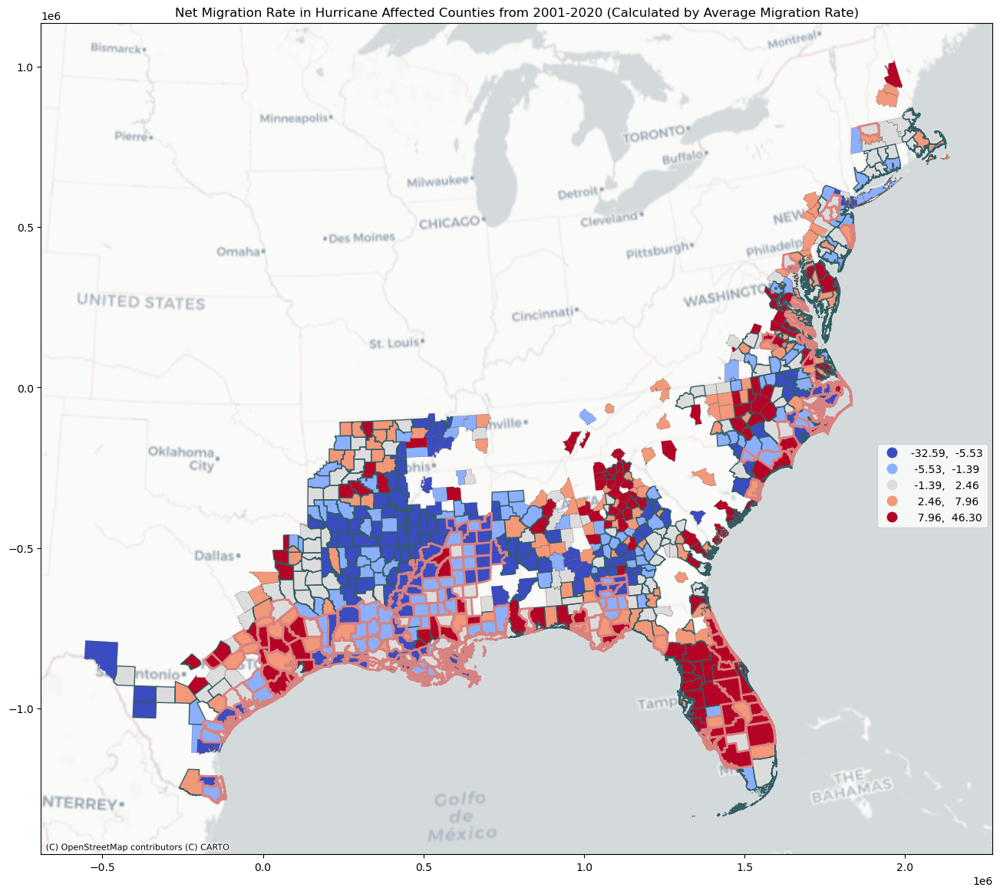

In [90]:
gdf_NMR_hurricane = gdf_NMR[gdf_NMR["FIPS"].isin(SHELDUS_hurricane_county)].reset_index(drop=True)

fig, ax = plt.subplots(1, 1, figsize=(16, 20))
gdf_NMR_hurricane.plot(column="NetMigrationRate1",cmap="coolwarm",
                       scheme="quantiles",
#              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,ax=ax)
leg = ax.get_legend()
leg.set_bbox_to_anchor(( 1, 0.5)) 

properties_map = {
    'Low Impact': {'color': '#584f4f', 'linewidth': 0.2},
    'Moderate Impact': {'color': '#325e63', 'linewidth': 1},
    'High Impact': {'color': '#d7837f', 'linewidth': 2}
    # Grey, olive, pink
}

gdf_SHELDUS_20_hurricane_county['line_color'] = gdf_SHELDUS_20_hurricane_county['ImpactLevel'].map(lambda x: properties_map[x]['color'])
gdf_SHELDUS_20_hurricane_county['line_width'] = gdf_SHELDUS_20_hurricane_county['ImpactLevel'].map(lambda x: properties_map[x]['linewidth'])

for level, properties in properties_map.items():
    subset = gdf_SHELDUS_20_hurricane_county[gdf_SHELDUS_20_hurricane_county['ImpactLevel'] == level]
    subset.boundary.plot(ax=ax, color=properties['color'], linewidth=properties['linewidth'])

ax.set_title("Net Migration Rate in Hurricane Affected Counties from 2001-2020 (Calculated by Average Migration Rate)")
cx.add_basemap(ax=ax, source=cx.providers.CartoDB.Positron, crs=gdf_NMR.crs)
# gdf_NMR_hurricane.plot(column="NetMigrationRate2",cmap="coolwarm",
#                        scheme="quantiles",
# #              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
#              legend=True,ax=ax[1])
# leg = ax[1].get_legend()
# leg.set_bbox_to_anchor(( 1, 0.5)) 
# ax[1].set_title("Net Migration Rate in Hurricane Affected Counties from 2001-2020")
# cx.add_basemap(ax=ax[1], source=cx.providers.CartoDB.Positron, crs=gdf_NMR.crs)

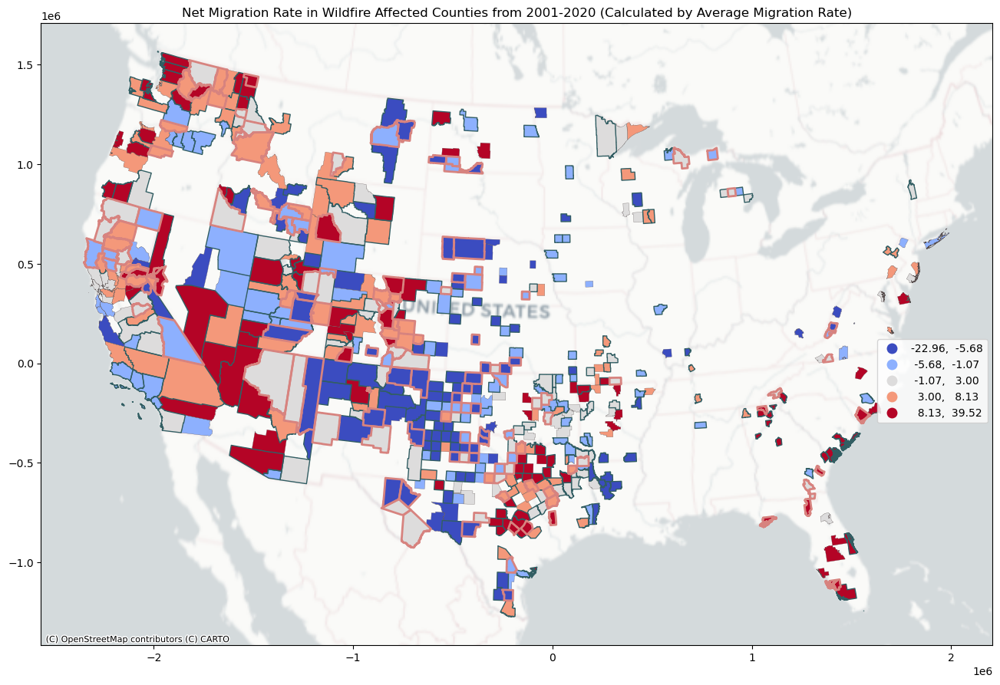

In [91]:
gdf_NMR_wildfire = gdf_NMR[gdf_NMR["FIPS"].isin(SHELDUS_wildfire_county)].reset_index(drop=True)

fig, ax = plt.subplots(1, 1, figsize=(16, 20))
gdf_NMR_wildfire.plot(column="NetMigrationRate1",cmap="coolwarm",
                      scheme="quantiles",
#              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,ax=ax)
leg = ax.get_legend()
leg.set_bbox_to_anchor(( 1, 0.5)) 

properties_map = {
    'Low Impact': {'color': '#584f4f', 'linewidth': 0.2},
    'Moderate Impact': {'color': '#325e63', 'linewidth': 1},
    'High Impact': {'color': '#d7837f', 'linewidth': 2}
    # Grey, olive, pink
}

gdf_SHELDUS_20_wildfire_county['line_color'] = gdf_SHELDUS_20_wildfire_county['ImpactLevel'].map(lambda x: properties_map[x]['color'])
gdf_SHELDUS_20_wildfire_county['line_width'] = gdf_SHELDUS_20_wildfire_county['ImpactLevel'].map(lambda x: properties_map[x]['linewidth'])

for level, properties in properties_map.items():
    subset = gdf_SHELDUS_20_wildfire_county[gdf_SHELDUS_20_wildfire_county['ImpactLevel'] == level]
    subset.boundary.plot(ax=ax, color=properties['color'], linewidth=properties['linewidth'])

ax.set_title("Net Migration Rate in Wildfire Affected Counties from 2001-2020 (Calculated by Average Migration Rate)")
cx.add_basemap(ax=ax, source=cx.providers.CartoDB.Positron, crs=gdf_NMR.crs)
# gdf_NMR_wildfire.plot(column="NetMigrationRate2",cmap="coolwarm",
#                       scheme="quantiles",
# #              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
#              legend=True,ax=ax[1])
# leg = ax[1].get_legend()
# leg.set_bbox_to_anchor(( 1, 0.5)) 
# ax[1].set_title("Net Migration Rate in Wildfire Affected Counties from 2001-2020")
# cx.add_basemap(ax=ax[1], source=cx.providers.CartoDB.Positron, crs=gdf_NMR.crs)

Three color to show the position

C:\Users\xiang11\.conda\envs\geo\lib\site-packages\geopandas\plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
C:\Users\xiang11\.conda\envs\geo\lib\site-packages\geopandas\plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
C:\Users\xiang11\.conda\envs\geo\lib\site-packages\geopandas\plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(


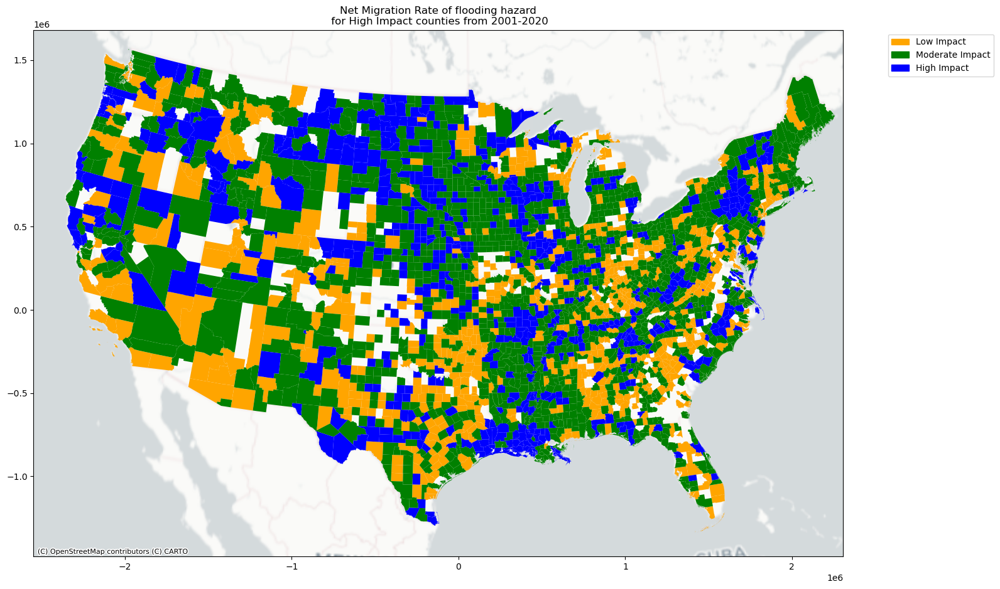

In [95]:
list_use = ["Low Impact","Moderate Impact","High Impact"]
color_list = ["orange","green","blue"]
fig, axes = plt.subplots(1, 1, figsize=(16, 20))

for i in range(3):
    gdf_NMR_flooding_use = gdf_NMR[gdf_NMR["FIPS"].isin(flooding_county_list_20[i])].reset_index(drop=True)
    gdf_NMR_flooding_use.plot(column="NetMigrationRate1",color= color_list[i],
             ax=axes)
    axes.legend(["Low Impact","Moderate Impact","High Impact"])
    axes.set_title(f"Net Migration Rate of flooding hazard\n for {list_use[i]} counties from 2001-2020")
    cx.add_basemap(ax=axes, source=cx.providers.CartoDB.Positron, crs=gdf_NMR_flooding_use.crs)

legend_patches = [mpatches.Patch(color=color, label=label) for color, label in zip(color_list, list_use)]
axes.legend(handles=legend_patches, bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

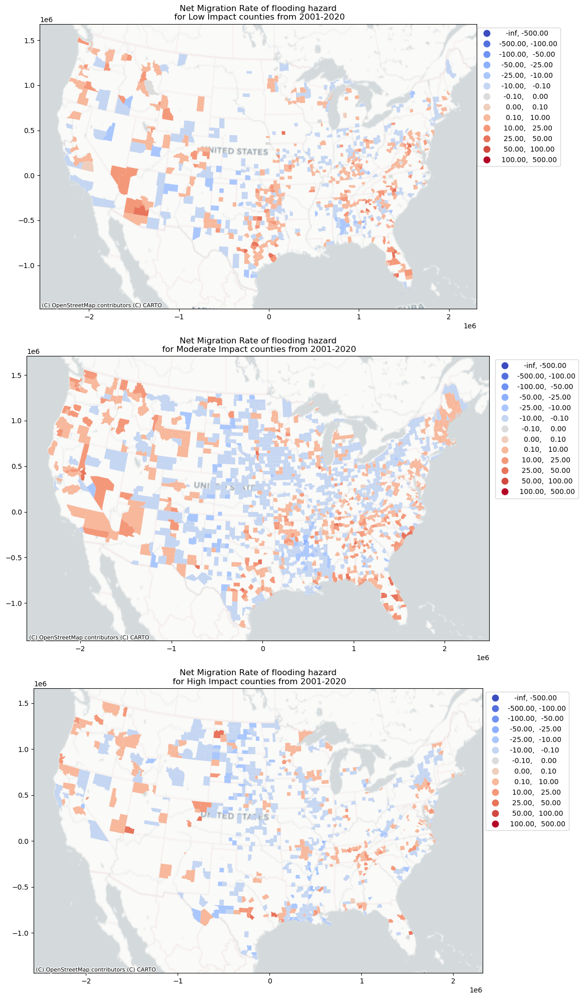

In [96]:
list_use = ["Low Impact","Moderate Impact","High Impact"]

fig, axes = plt.subplots(3, 1, figsize=(16, 20))

for i in range(3):
    gdf_NMR_flooding_use = gdf_NMR[gdf_NMR["FIPS"].isin(flooding_county_list_20[i])].reset_index(drop=True)
    gdf_NMR_flooding_use.plot(column="NetMigrationRate1",cmap="coolwarm",
             scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,ax=axes[i])
    leg = axes[i].get_legend()
    leg.set_bbox_to_anchor((1.2, 1)) 
    axes[i].set_title(f"Net Migration Rate of flooding hazard\n for {list_use[i]} counties from 2001-2020")
    cx.add_basemap(ax=axes[i], source=cx.providers.CartoDB.Positron, crs=gdf_NMR_flooding_use.crs)

plt.tight_layout()
plt.show()

C:\Users\xiang11\.conda\envs\geo\lib\site-packages\geopandas\plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
C:\Users\xiang11\.conda\envs\geo\lib\site-packages\geopandas\plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
C:\Users\xiang11\.conda\envs\geo\lib\site-packages\geopandas\plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(


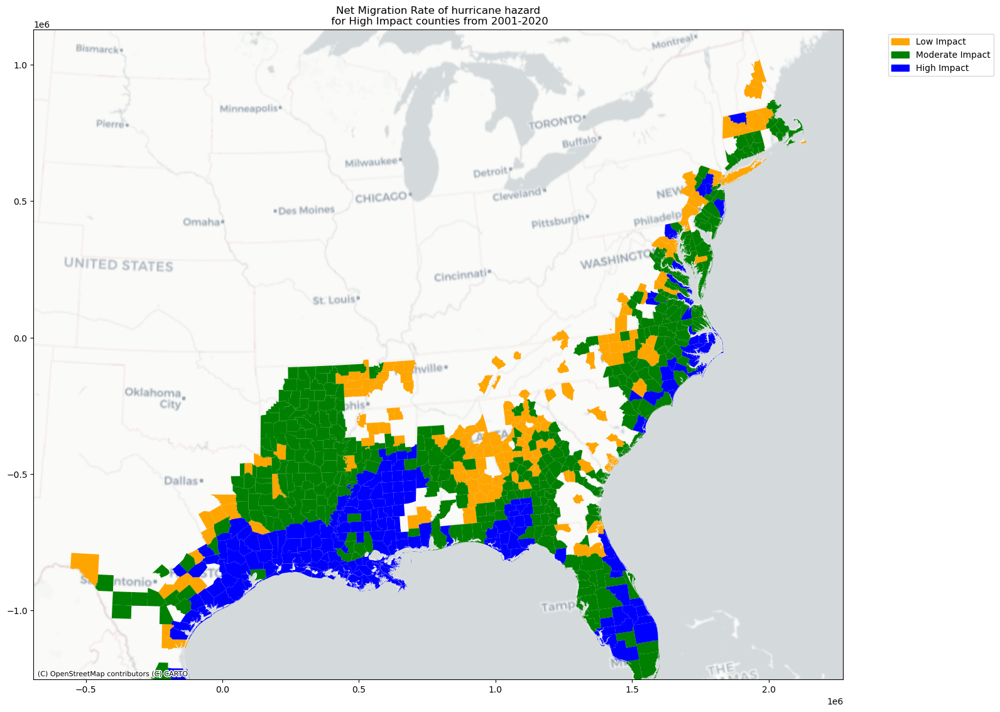

In [97]:
list_use = ["Low Impact","Moderate Impact","High Impact"]
color_list = ["orange","green","blue"]
fig, axes = plt.subplots(1, 1, figsize=(16, 20))

for i in range(3):
    gdf_NMR_hurricane_use = gdf_NMR[gdf_NMR["FIPS"].isin(hurricane_county_list_20[i])].reset_index(drop=True)
    gdf_NMR_hurricane_use.plot(column="NetMigrationRate1",color= color_list[i],
             ax=axes)
    axes.legend(["Low Impact","Moderate Impact","High Impact"])
    axes.set_title(f"Net Migration Rate of hurricane hazard\n for {list_use[i]} counties from 2001-2020")
    cx.add_basemap(ax=axes, source=cx.providers.CartoDB.Positron, crs=gdf_NMR_flooding_use.crs)

legend_patches = [mpatches.Patch(color=color, label=label) for color, label in zip(color_list, list_use)]
axes.legend(handles=legend_patches, bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

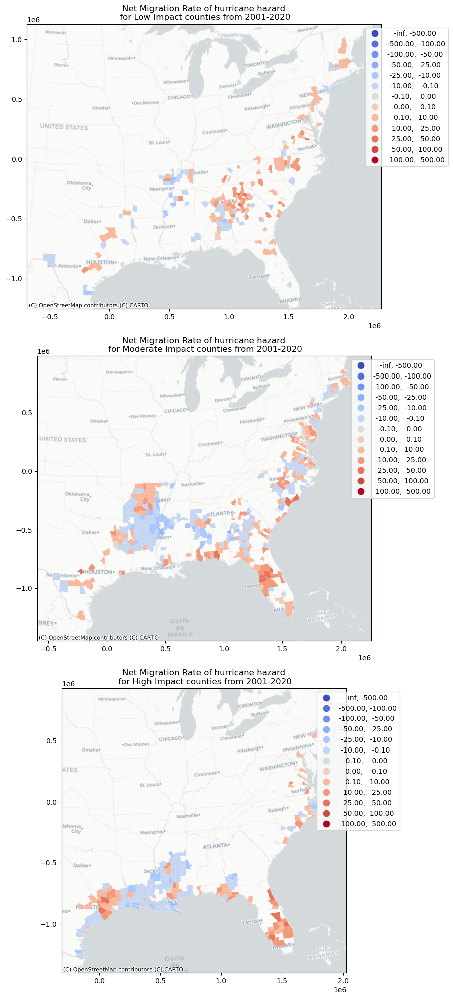

In [98]:
list_use = ["Low Impact","Moderate Impact","High Impact"]
fig, axes = plt.subplots(3, 1, figsize=(16, 20))

for i in range(3):
    gdf_NMR_hurricane_use = gdf_NMR[gdf_NMR["FIPS"].isin(hurricane_county_list_20[i])].reset_index(drop=True)
    gdf_NMR_hurricane_use.plot(column="NetMigrationRate1",cmap="coolwarm",
             scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,ax=axes[i])
    leg = axes[i].get_legend()
    leg.set_bbox_to_anchor((1.2, 1)) 
    axes[i].set_title(f"Net Migration Rate of hurricane hazard\n for {list_use[i]} counties from 2001-2020")
    cx.add_basemap(ax=axes[i], source=cx.providers.CartoDB.Positron, crs=gdf_NMR_hurricane_use.crs)

plt.tight_layout()
plt.show()

C:\Users\xiang11\.conda\envs\geo\lib\site-packages\geopandas\plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
C:\Users\xiang11\.conda\envs\geo\lib\site-packages\geopandas\plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
C:\Users\xiang11\.conda\envs\geo\lib\site-packages\geopandas\plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(


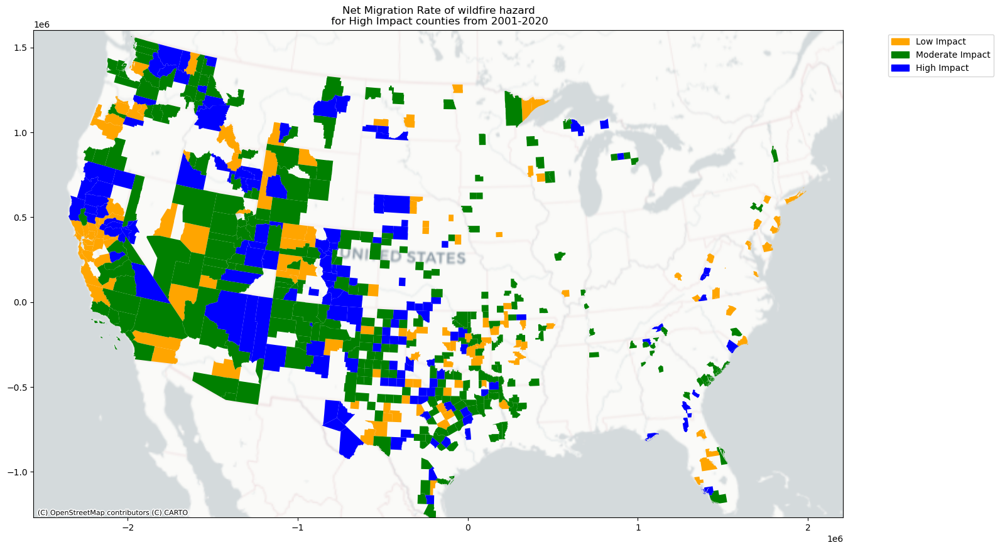

In [99]:
list_use = ["Low Impact","Moderate Impact","High Impact"]
color_list = ["orange","green","blue"]
fig, axes = plt.subplots(1, 1, figsize=(16, 20))

for i in range(3):
    gdf_NMR_wildfire_use = gdf_NMR[gdf_NMR["FIPS"].isin(wildfire_county_list_20[i])].reset_index(drop=True)
    gdf_NMR_wildfire_use.plot(column="NetMigrationRate1",color= color_list[i],
             ax=axes)
    axes.legend(["Low Impact","Moderate Impact","High Impact"])
    axes.set_title(f"Net Migration Rate of wildfire hazard\n for {list_use[i]} counties from 2001-2020")
    cx.add_basemap(ax=axes, source=cx.providers.CartoDB.Positron, crs=gdf_NMR_flooding_use.crs)

legend_patches = [mpatches.Patch(color=color, label=label) for color, label in zip(color_list, list_use)]
axes.legend(handles=legend_patches, bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

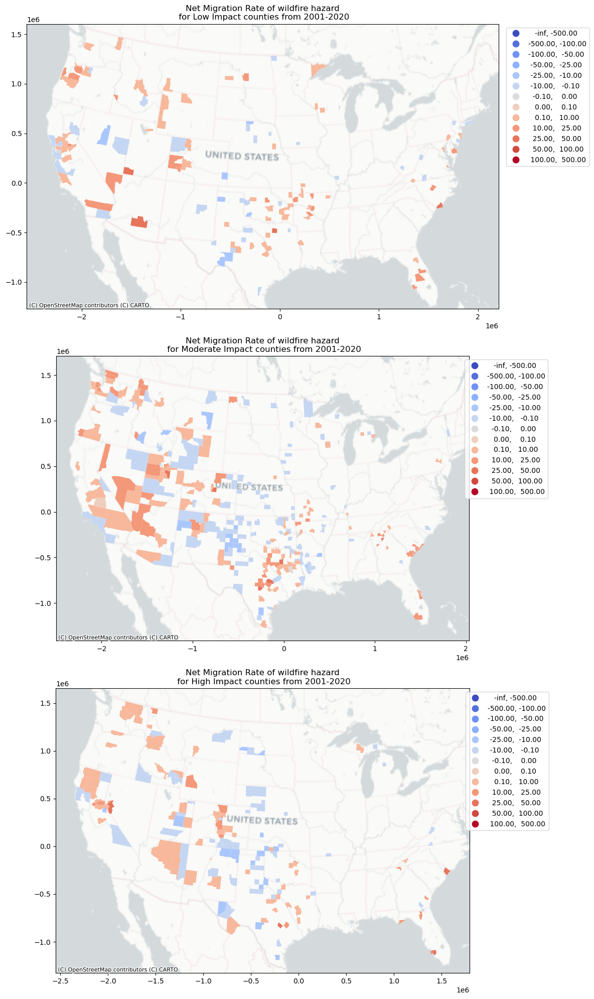

In [100]:
list_use = ["Low Impact","Moderate Impact","High Impact"]
fig, axes = plt.subplots(3, 1, figsize=(16, 20))

for i in range(3):
    gdf_NMR_wildfire_use = gdf_NMR[gdf_NMR["FIPS"].isin(wildfire_county_list_20[i])].reset_index(drop=True)
    gdf_NMR_wildfire_use.plot(column="NetMigrationRate1",cmap="coolwarm",
             scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,ax=axes[i])
    leg = axes[i].get_legend()
    leg.set_bbox_to_anchor((1.2, 1)) 
    axes[i].set_title(f"Net Migration Rate of wildfire hazard\n for {list_use[i]} counties from 2001-2020")
    cx.add_basemap(ax=axes[i], source=cx.providers.CartoDB.Positron, crs=gdf_NMR_wildfire_use.crs)

plt.tight_layout()
plt.show()

# Net Migration Rate for each year <a class="anchor" id="year"></a>

In [101]:
correct_netmig_columns = []
for year in range(2001, 2021):
    column_name_x = f'RNETMIG{year}_x'
    column_name_y = f'RNETMIG{year}_y'
    column_name = f'RNETMIG{year}'
    if column_name in df_pep_0120.columns:
        correct_netmig_columns.append(column_name)
    elif column_name_x in df_pep_0120.columns:
        correct_netmig_columns.append(column_name_x)
    elif column_name_y in df_pep_0120.columns:
        correct_netmig_columns.append(column_name_y)

In [102]:
flooding_year = SHELDUS_0020_use[SHELDUS_0020_use["Hazard"]=="Flooding"]
flooding_year = flooding_year.groupby(["Hazard","Year"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
    
}).reset_index()
flooding_year = flooding_year.rename(columns={"Month":"count"})

In [103]:
flooding_county_low = df_pep_0120[df_pep_0120["FIPS"].isin(flooding_county_list_20[0])].reset_index(drop=True)
flooding_county_low_mean = flooding_county_low[correct_netmig_columns].mean()
flooding_county_med = df_pep_0120[df_pep_0120["FIPS"].isin(flooding_county_list_20[1])].reset_index(drop=True)
flooding_county_med_mean = flooding_county_med[correct_netmig_columns].mean()
flooding_county_high = df_pep_0120[df_pep_0120["FIPS"].isin(flooding_county_list_20[2])].reset_index(drop=True)
flooding_county_high_mean = flooding_county_high[correct_netmig_columns].mean()

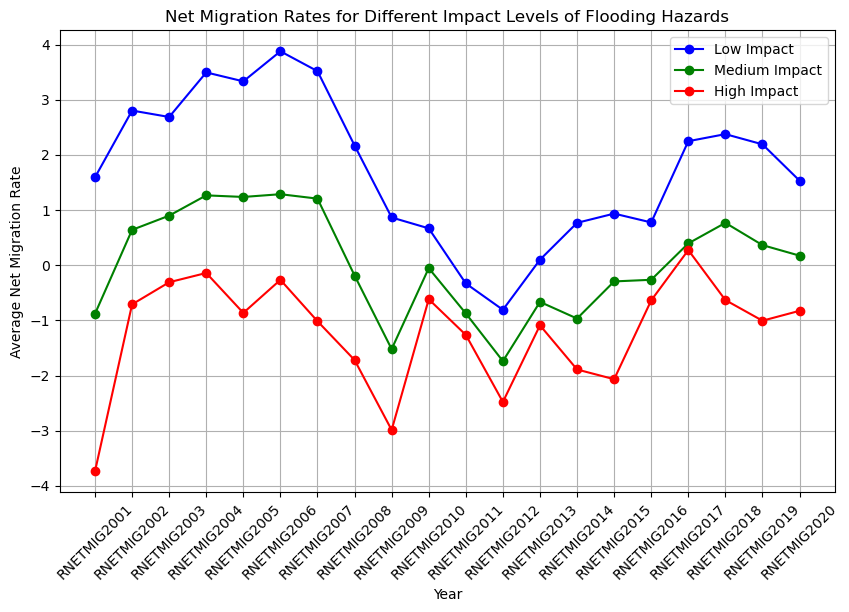

In [104]:
# Create a line chart with multiple lines
plt.figure(figsize=(10, 6))

# Plot each dataset
plt.plot(flooding_county_low_mean.index, flooding_county_low_mean.values, marker='o', linestyle='-', color='b', label='Low Impact')
plt.plot(flooding_county_med_mean.index, flooding_county_med_mean.values, marker='o', linestyle='-', color='g', label='Medium Impact')
plt.plot(flooding_county_high_mean.index, flooding_county_high_mean.values, marker='o', linestyle='-', color='r', label='High Impact')

# Add titles and labels
plt.title('Net Migration Rates for Different Impact Levels of Flooding Hazards')
plt.xlabel('Year')
plt.ylabel('Average Net Migration Rate')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

# Add a legend
plt.legend()

# Display the plot
plt.grid(True)
plt.show()

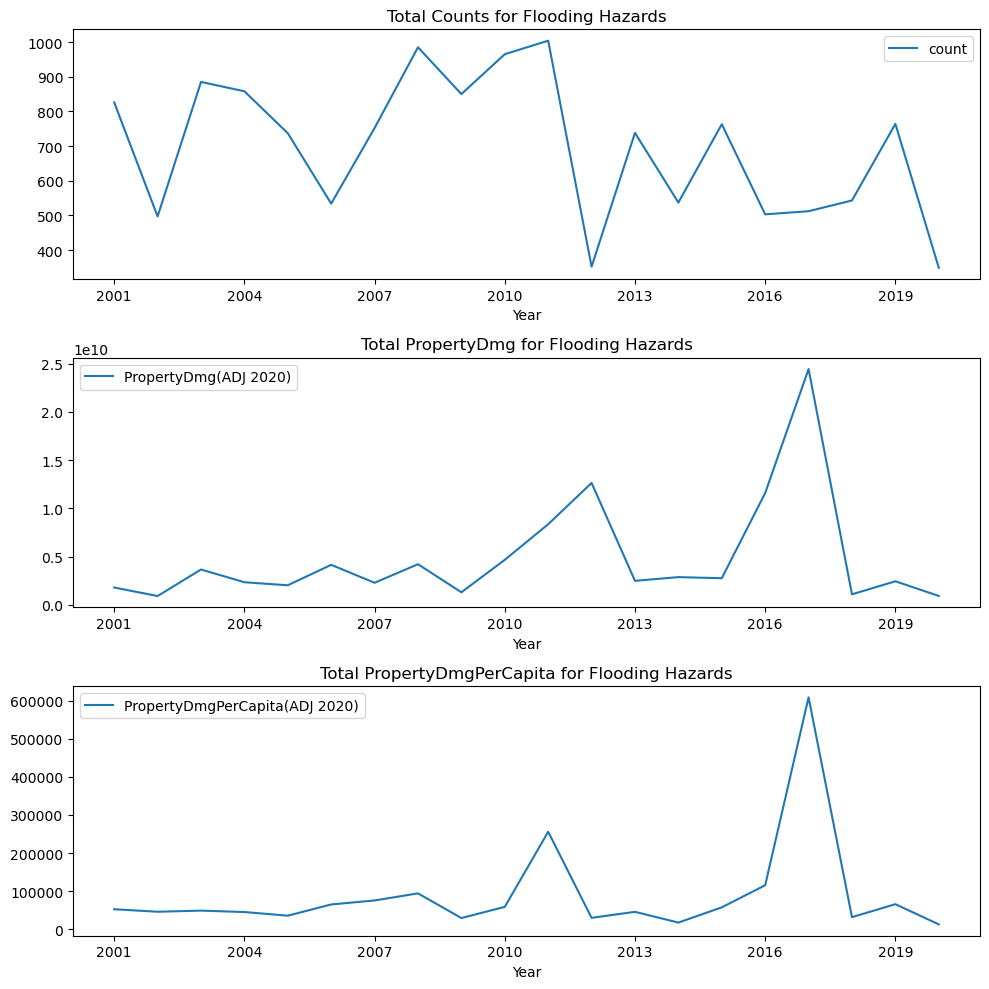

In [105]:
fig, axes = plt.subplots(3,1,figsize=(10,10))
flooding_year.plot.line("Year","count",ax=axes[0],title="Total Counts for Flooding Hazards")
flooding_year.plot.line("Year","PropertyDmg(ADJ 2020)",ax=axes[1],title="Total PropertyDmg for Flooding Hazards") 
flooding_year.plot.line("Year","PropertyDmgPerCapita(ADJ 2020)",ax=axes[2],title="Total PropertyDmgPerCapita for Flooding Hazards")
for ax in axes:
    ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
    ax.set_xlabel("Year")
plt.tight_layout()
plt.show()

In [106]:
hurricane_year = SHELDUS_0020_use[SHELDUS_0020_use["Hazard"]=="Hurricane/Tropical Storm"]
hurricane_year = hurricane_year.groupby(["Hazard","Year"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
    
}).reset_index()
hurricane_year = hurricane_year.rename(columns={"Month":"count"})

In [107]:
hurricane_county_low = df_pep_0120[df_pep_0120["FIPS"].isin(hurricane_county_list_20[0])].reset_index(drop=True)
hurricane_county_low_mean = hurricane_county_low[correct_netmig_columns].mean()
hurricane_county_med = df_pep_0120[df_pep_0120["FIPS"].isin(hurricane_county_list_20[1])].reset_index(drop=True)
hurricane_county_med_mean = hurricane_county_med[correct_netmig_columns].mean()
hurricane_county_high = df_pep_0120[df_pep_0120["FIPS"].isin(hurricane_county_list_20[2])].reset_index(drop=True)
hurricane_county_high_mean = hurricane_county_high[correct_netmig_columns].mean()

## Test why Hurricane Sandy is not showing accurately

It looks like Hurricane Sandy's damage is classified in Flooding Hazard in SHELDUS dataset.

In [108]:
SHELDUS_0020_use[SHELDUS_0020_use["Year"]==2012].sort_values("PropertyDmg",ascending=False)[0:5]

,State Name,County Name,County FIPS,Hazard,Year,Month,CropDmg,CropDmg(ADJ 2020),CropDmgPerCapita(ADJ 2020),PropertyDmg,...,Injuries,InjuriesPerCapita,Fatalities,FatalitiesPerCapita,Duration_Days,Fatalities_Duration,Injuries_Duration,Property_Damage_Duration,Crop_Damage_Duration,Records
28156,NEW JERSEY,Ocean,34029,Hurricane/Tropical Storm,2012,10,0.0,0.0,0.0,1.000000e+10,...,0.0,0.0,2.0,0.0,1.0,1.0,0.0,1.0,0.0,2
28140,NEW JERSEY,Monmouth,34025,Flooding,2012,10,0.0,0.0,0.0,1.000000e+10,...,0.0,0.0,0.0,0.0,2.0,0.0,0.0,2.0,0.0,2
28132,NEW JERSEY,Middlesex,34023,Hurricane/Tropical Storm,2012,10,0.0,0.0,0.0,5.000000e+08,...,0.0,0.0,0.0,0.0,2.0,0.0,0.0,2.0,0.0,1
1833,COLORADO,El Paso,08041,Wildfire,2012,7,0.0,0.0,0.0,4.000000e+08,...,0.0,0.0,0.0,0.0,10.0,0.0,0.0,10.0,0.0,1
18855,COLORADO,El Paso,08041,Wildfire,2012,6,0.0,0.0,0.0,4.000000e+08,...,0.0,0.0,2.0,0.0,5.0,5.0,0.0,5.0,0.0,1


In [438]:
test = SHELDUS_0020_use[SHELDUS_0020_use["Hazard"]=="Hurricane/Tropical Storm"]
test[test["Year"]==2005].sort_values("PropertyDmg",ascending=False)[0:10]

,State Name,County Name,County FIPS,Hazard,Year,Month,CropDmg,CropDmg(ADJ 2020),CropDmgPerCapita(ADJ 2020),PropertyDmg,...,Injuries,InjuriesPerCapita,Fatalities,FatalitiesPerCapita,Duration_Days,Fatalities_Duration,Injuries_Duration,Property_Damage_Duration,Crop_Damage_Duration,Records
25028,LOUISIANA,Orleans,22071,Hurricane/Tropical Storm,2005,8,0.0,0.0,0.0,1.790000e+10,...,0.0,0.0,0.0,0.00000,1.0,0.0,0.0,1.0,0.0,1
19392,FLORIDA,Palm Beach,12099,Hurricane/Tropical Storm,2005,10,0.0,0.0,0.0,1.000000e+10,...,0.0,0.0,1.0,0.00000,1.0,1.0,0.0,1.0,0.0,1
25102,LOUISIANA,St. Bernard,22087,Hurricane/Tropical Storm,2005,8,0.0,0.0,0.0,6.040000e+09,...,0.0,0.0,0.0,0.00000,1.0,0.0,0.0,1.0,0.0,2
26422,MISSISSIPPI,Harrison,28047,Hurricane/Tropical Storm,2005,8,0.0,0.0,0.0,5.630000e+09,...,0.0,0.0,0.0,0.00000,1.0,0.0,0.0,1.0,0.0,1
25050,LOUISIANA,Plaquemines,22075,Hurricane/Tropical Storm,2005,8,0.0,0.0,0.0,4.030000e+09,...,0.0,0.0,0.0,0.00000,1.0,0.0,0.0,1.0,0.0,2
8943,LOUISIANA,Orleans,22071,Hurricane/Tropical Storm,2005,8,0.0,0.0,0.0,3.560000e+09,...,0.0,0.0,638.0,0.00140,2.0,2.0,0.0,2.0,0.0,1
9003,LOUISIANA,St. Bernard,22087,Hurricane/Tropical Storm,2005,8,0.0,0.0,0.0,3.560000e+09,...,0.0,0.0,140.0,0.00216,2.0,2.0,0.0,2.0,0.0,2
26411,MISSISSIPPI,Hancock,28045,Hurricane/Tropical Storm,2005,8,0.0,0.0,0.0,3.380000e+09,...,0.0,0.0,0.0,0.00000,1.0,0.0,0.0,1.0,0.0,1
8962,LOUISIANA,Plaquemines,22075,Hurricane/Tropical Storm,2005,8,0.0,0.0,0.0,3.040000e+09,...,0.0,0.0,2.0,0.00007,2.0,2.0,0.0,2.0,0.0,2
25187,LOUISIANA,St. Tammany,22103,Hurricane/Tropical Storm,2005,8,0.0,0.0,0.0,3.030000e+09,...,0.0,0.0,0.0,0.00000,1.0,0.0,0.0,1.0,0.0,1


In [112]:
test = SHELDUS_0020_use[SHELDUS_0020_use["Hazard"]=="Hurricane/Tropical Storm"]
test[test["Year"]==2012].sort_values("PropertyDmg",ascending=False)[0:10]

,State Name,County Name,County FIPS,Hazard,Year,Month,CropDmg,CropDmg(ADJ 2020),CropDmgPerCapita(ADJ 2020),PropertyDmg,...,Injuries,InjuriesPerCapita,Fatalities,FatalitiesPerCapita,Duration_Days,Fatalities_Duration,Injuries_Duration,Property_Damage_Duration,Crop_Damage_Duration,Records
28156,NEW JERSEY,Ocean,34029,Hurricane/Tropical Storm,2012,10,0.0,0.0,0.0,1.000000e+10,...,0.0,0.0,2.0,0.00000,1.0,1.0,0.0,1.0,0.0,2
28132,NEW JERSEY,Middlesex,34023,Hurricane/Tropical Storm,2012,10,0.0,0.0,0.0,5.000000e+08,...,0.0,0.0,0.0,0.00000,2.0,0.0,0.0,2.0,0.0,1
9035,LOUISIANA,St. John the Baptist,22095,Hurricane/Tropical Storm,2012,8,0.0,0.0,0.0,1.076000e+08,...,0.0,0.0,0.0,0.00000,4.0,0.0,0.0,4.0,0.0,1
24944,LOUISIANA,Jefferson,22051,Hurricane/Tropical Storm,2012,8,0.0,0.0,0.0,1.074000e+08,...,0.0,0.0,0.0,0.00000,4.0,0.0,0.0,4.0,0.0,3
8949,LOUISIANA,Orleans,22071,Hurricane/Tropical Storm,2012,8,0.0,0.0,0.0,6.255000e+07,...,0.0,0.0,0.0,0.00000,4.0,0.0,0.0,4.0,0.0,2
8965,LOUISIANA,Plaquemines,22075,Hurricane/Tropical Storm,2012,8,0.0,0.0,0.0,4.980000e+07,...,0.0,0.0,2.0,0.00008,4.0,4.0,0.0,4.0,0.0,1
25190,LOUISIANA,St. Tammany,22103,Hurricane/Tropical Storm,2012,8,0.0,0.0,0.0,4.280000e+07,...,0.0,0.0,1.0,0.00000,4.0,4.0,0.0,4.0,0.0,1
8950,LOUISIANA,Orleans,22071,Hurricane/Tropical Storm,2012,8,0.0,0.0,0.0,2.680000e+07,...,0.0,0.0,0.0,0.00000,3.0,0.0,0.0,3.0,0.0,1
9100,LOUISIANA,Tangipahoa,22105,Hurricane/Tropical Storm,2012,8,0.0,0.0,0.0,2.680000e+07,...,0.0,0.0,0.0,0.00000,4.0,0.0,0.0,4.0,0.0,1
24997,LOUISIANA,Livingston,22063,Hurricane/Tropical Storm,2012,8,0.0,0.0,0.0,2.280000e+07,...,0.0,0.0,0.0,0.00000,4.0,0.0,0.0,4.0,0.0,1


In [439]:
test = SHELDUS_0020_use[SHELDUS_0020_use["Hazard"]=="Hurricane/Tropical Storm"]
test[test["Year"]==2017].sort_values("PropertyDmg",ascending=False)[0:10]

,State Name,County Name,County FIPS,Hazard,Year,Month,CropDmg,CropDmg(ADJ 2020),CropDmgPerCapita(ADJ 2020),PropertyDmg,...,Injuries,InjuriesPerCapita,Fatalities,FatalitiesPerCapita,Duration_Days,Fatalities_Duration,Injuries_Duration,Property_Damage_Duration,Crop_Damage_Duration,Records
30814,TEXAS,Galveston,48167,Hurricane/Tropical Storm,2017,8,10000.0,10508.62,0.03137,1.000000e+10,...,0.0,0.0,3.0,0.00001,5.0,5.0,0.0,5.0,5.0,2
15174,TEXAS,Harris,48201,Hurricane/Tropical Storm,2017,8,0.0,0.00,0.00000,1.000000e+10,...,0.0,0.0,36.0,0.00001,5.0,5.0,0.0,5.0,0.0,1
15070,TEXAS,Galveston,48167,Hurricane/Tropical Storm,2017,8,0.0,0.00,0.00000,1.000000e+10,...,0.0,0.0,3.0,0.00001,6.0,6.0,0.0,6.0,0.0,1
30928,TEXAS,Harris,48201,Hurricane/Tropical Storm,2017,8,100000.0,105086.20,0.02258,1.000000e+10,...,0.0,0.0,36.0,0.00001,4.0,4.0,0.0,4.0,4.0,1
15034,TEXAS,Fort Bend,48157,Hurricane/Tropical Storm,2017,8,50000.0,52543.10,0.06870,8.000000e+09,...,0.0,0.0,3.0,0.00000,4.0,4.0,0.0,4.0,4.0,1
15035,TEXAS,Fort Bend,48157,Hurricane/Tropical Storm,2017,8,0.0,0.00,0.00000,8.000000e+09,...,0.0,0.0,3.0,0.00000,5.0,5.0,0.0,5.0,0.0,1
31338,TEXAS,Montgomery,48339,Hurricane/Tropical Storm,2017,8,10000.0,10508.62,0.01841,7.000000e+09,...,0.0,0.0,3.0,0.00001,4.0,4.0,0.0,4.0,4.0,1
15663,TEXAS,Montgomery,48339,Hurricane/Tropical Storm,2017,8,0.0,0.00,0.00000,7.000000e+09,...,0.0,0.0,3.0,0.00001,6.0,6.0,0.0,6.0,0.0,1
30495,TEXAS,Brazoria,48039,Hurricane/Tropical Storm,2017,8,100000.0,105086.20,0.28993,2.000000e+09,...,0.0,0.0,0.0,0.00000,4.0,0.0,0.0,4.0,4.0,1
14690,TEXAS,Brazoria,48039,Hurricane/Tropical Storm,2017,8,0.0,0.00,0.00000,2.000000e+09,...,0.0,0.0,0.0,0.00000,6.0,0.0,0.0,6.0,0.0,1


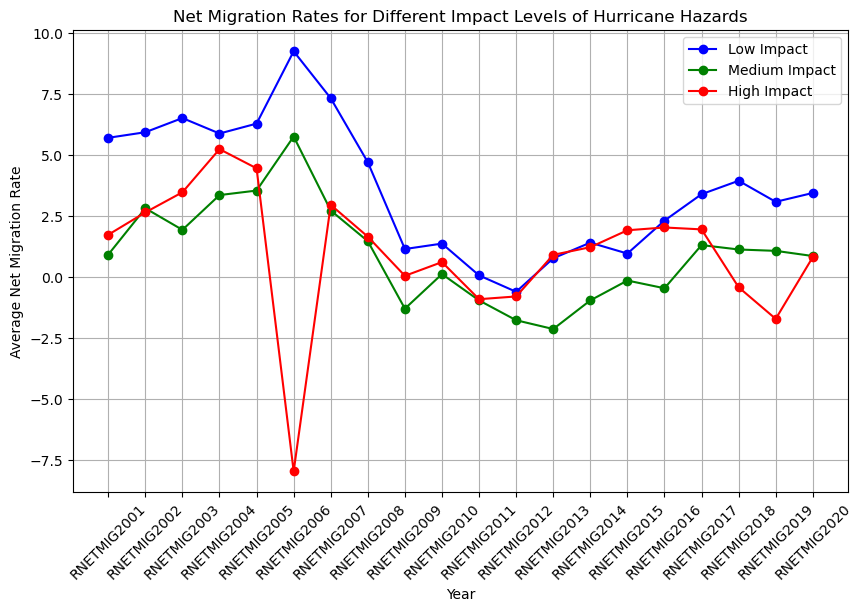

In [113]:
# Create a line chart with multiple lines
plt.figure(figsize=(10, 6))

# Plot each dataset
plt.plot(hurricane_county_low_mean.index, hurricane_county_low_mean.values, marker='o', linestyle='-', color='b', label='Low Impact')
plt.plot(hurricane_county_med_mean.index, hurricane_county_med_mean.values, marker='o', linestyle='-', color='g', label='Medium Impact')
plt.plot(hurricane_county_high_mean.index, hurricane_county_high_mean.values, marker='o', linestyle='-', color='r', label='High Impact')

# Add titles and labels
plt.title('Net Migration Rates for Different Impact Levels of Hurricane Hazards')
plt.xlabel('Year')
plt.ylabel('Average Net Migration Rate')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

# Add a legend
plt.legend()

# Display the plot
plt.grid(True)
plt.show()

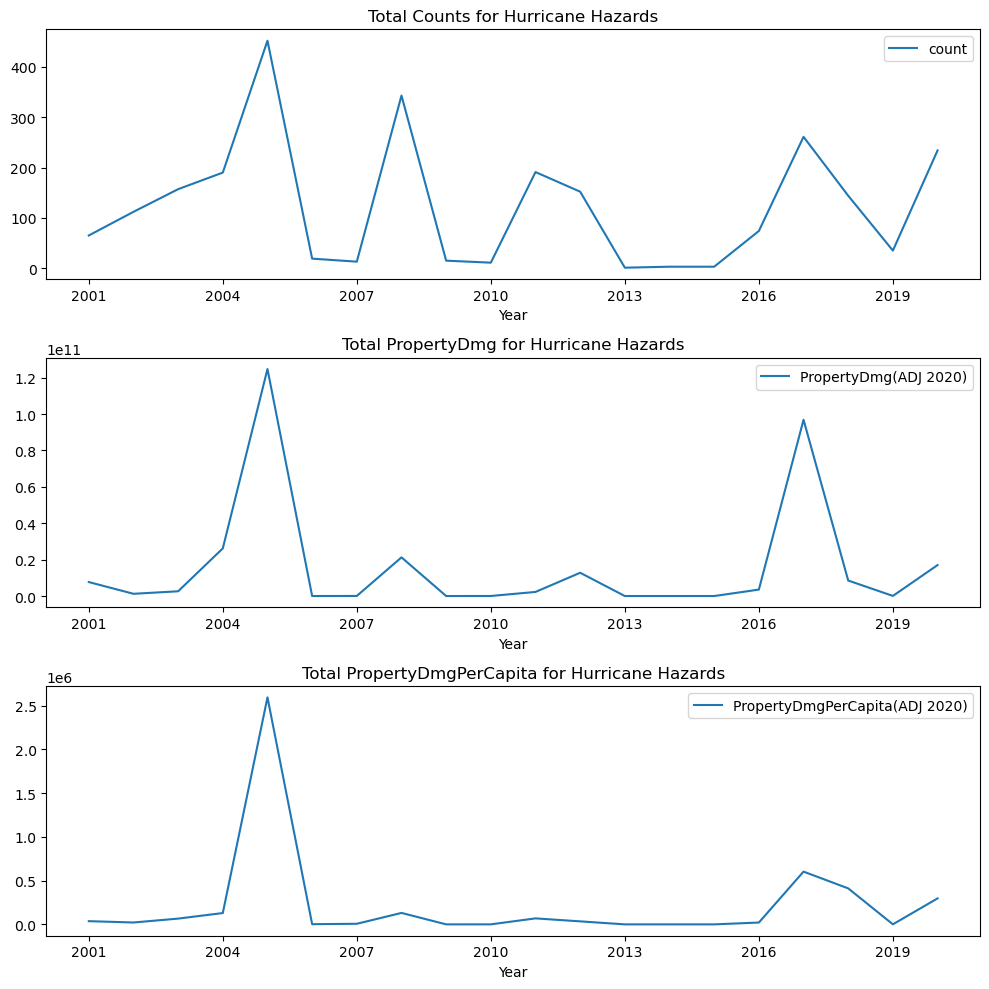

In [114]:
fig, axes = plt.subplots(3,1,figsize=(10,10))
hurricane_year.plot.line("Year","count",ax=axes[0],title="Total Counts for Hurricane Hazards")
hurricane_year.plot.line("Year","PropertyDmg(ADJ 2020)",ax=axes[1],title="Total PropertyDmg for Hurricane Hazards") 
hurricane_year.plot.line("Year","PropertyDmgPerCapita(ADJ 2020)",ax=axes[2],title="Total PropertyDmgPerCapita for Hurricane Hazards")
for ax in axes:
    ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
    ax.set_xlabel("Year")
plt.tight_layout()
plt.show()

Hurricane sandy in 2012

In [115]:
wildfire_year = SHELDUS_0020_use[SHELDUS_0020_use["Hazard"]=="Wildfire"]
wildfire_year = wildfire_year.groupby(["Hazard","Year"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
    
}).reset_index()
wildfire_year = wildfire_year.rename(columns={"Month":"count"})

In [116]:
wildfire_county_low = df_pep_0120[df_pep_0120["FIPS"].isin(wildfire_county_list_20[0])].reset_index(drop=True)
wildfire_county_low_mean = wildfire_county_low[correct_netmig_columns].mean()
wildfire_county_med = df_pep_0120[df_pep_0120["FIPS"].isin(wildfire_county_list_20[1])].reset_index(drop=True)
wildfire_county_med_mean = wildfire_county_med[correct_netmig_columns].mean()
wildfire_county_high = df_pep_0120[df_pep_0120["FIPS"].isin(wildfire_county_list_20[2])].reset_index(drop=True)
wildfire_county_high_mean = wildfire_county_high[correct_netmig_columns].mean()

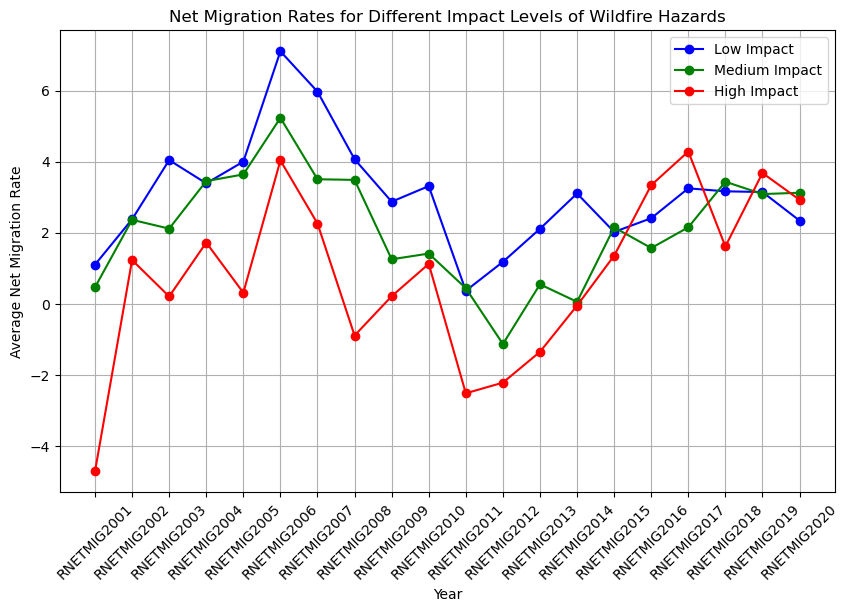

In [117]:
# Create a line chart with multiple lines
plt.figure(figsize=(10, 6))

# Plot each dataset
plt.plot(wildfire_county_low_mean.index, wildfire_county_low_mean.values, marker='o', linestyle='-', color='b', label='Low Impact')
plt.plot(wildfire_county_med_mean.index, wildfire_county_med_mean.values, marker='o', linestyle='-', color='g', label='Medium Impact')
plt.plot(wildfire_county_high_mean.index, wildfire_county_high_mean.values, marker='o', linestyle='-', color='r', label='High Impact')

# Add titles and labels
plt.title('Net Migration Rates for Different Impact Levels of Wildfire Hazards')
plt.xlabel('Year')
plt.ylabel('Average Net Migration Rate')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

# Add a legend
plt.legend()

# Display the plot
plt.grid(True)
plt.show()

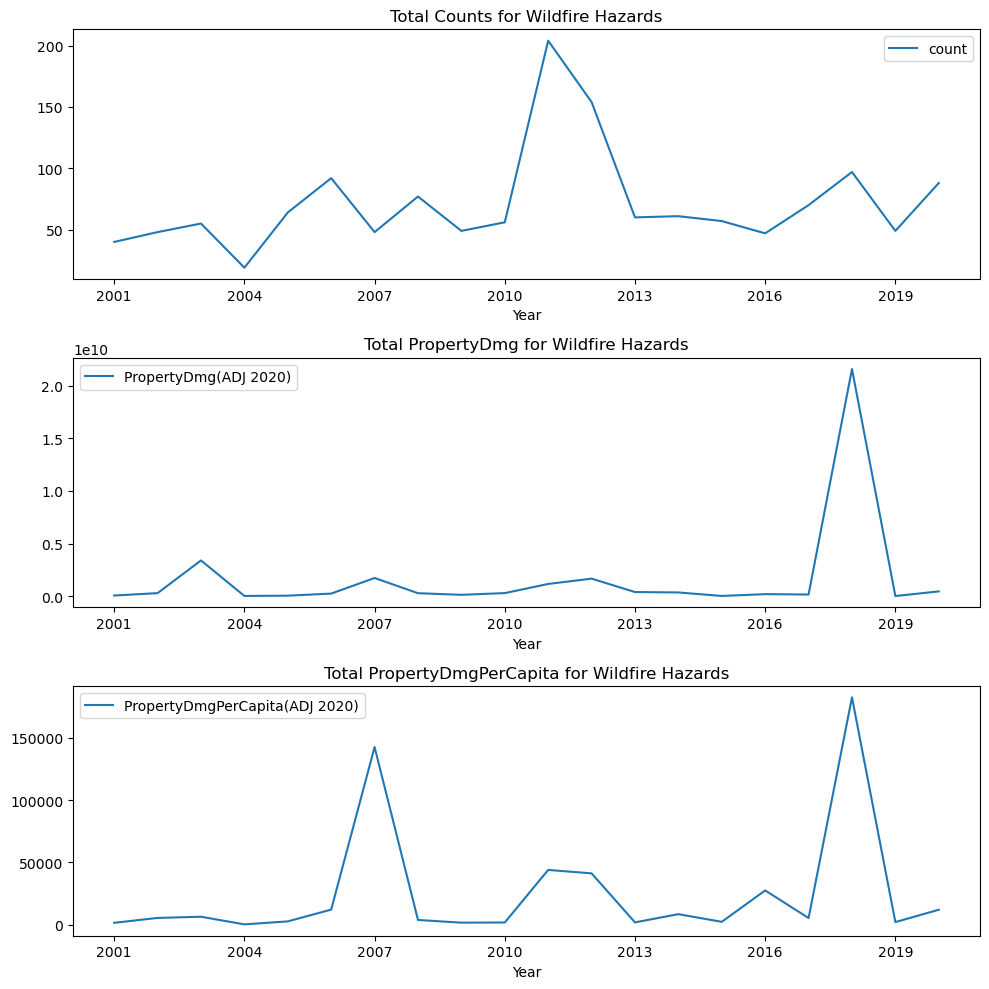

In [118]:
fig, axes = plt.subplots(3,1,figsize=(10,10))
wildfire_year.plot.line("Year","count",ax=axes[0],title="Total Counts for Wildfire Hazards")
wildfire_year.plot.line("Year","PropertyDmg(ADJ 2020)",ax=axes[1],title="Total PropertyDmg for Wildfire Hazards") 
wildfire_year.plot.line("Year","PropertyDmgPerCapita(ADJ 2020)",ax=axes[2],title="Total PropertyDmgPerCapita for Wildfire Hazards")
for ax in axes:
    ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
    ax.set_xlabel("Year")
plt.tight_layout()
plt.show()

In [119]:
# NMR= [gdf_NMR.NetMigrationRate.mean(),gdf_NMR.NetMigrationRate.min(),gdf_NMR.NetMigrationRate.max(),gdf_NMR.NetMigrationRate.std()]
# NMR_f= [gdf_NMR_flooding.NetMigrationRate1.mean(),gdf_NMR_flooding.NetMigrationRate.min(),gdf_NMR_flooding.NetMigrationRate.max(),gdf_NMR_flooding.NetMigrationRate.std()]
# NMR_h= [gdf_NMR_hurricane.NetMigrationRate.mean(),gdf_NMR_hurricane.NetMigrationRate.min(),gdf_NMR_hurricane.NetMigrationRate.max(),gdf_NMR_hurricane.NetMigrationRate.std()]
# NMR_w= [gdf_NMR_wildfire.NetMigrationRate.mean(),gdf_NMR_wildfire.NetMigrationRate.min(),gdf_NMR_wildfire.NetMigrationRate.max(),gdf_NMR_wildfire.NetMigrationRate.std()]

count_f = [gdf_SHELDUS_20_flooding_county["count"].mean(),gdf_SHELDUS_20_flooding_county["count"].min(),gdf_SHELDUS_20_flooding_county["count"].max(),gdf_SHELDUS_20_flooding_county["count"].std()]
count_h = [gdf_SHELDUS_20_hurricane_county["count"].mean(),gdf_SHELDUS_20_hurricane_county["count"].min(),gdf_SHELDUS_20_hurricane_county["count"].max(),gdf_SHELDUS_20_hurricane_county["count"].std()]
count_w = [gdf_SHELDUS_20_wildfire_county["count"].mean(),gdf_SHELDUS_20_wildfire_county["count"].min(),gdf_SHELDUS_20_wildfire_county["count"].max(),gdf_SHELDUS_20_wildfire_county["count"].std()]

# Regression Analysis<a class="anchor" id="re"></a>

### CDC SVI 2010 is used
https://www.atsdr.cdc.gov/placeandhealth/svi/documentation/pdf/SVI-2010-Documentation-H.pdf

In [389]:
def append_stars(row):
    if row['p-value'] < 0.001:
        return f"{row['Coefficient']}***"
    elif row['p-value'] < 0.01:
        return f"{row['Coefficient']}**"
    elif row['p-value'] < 0.05:
        return f"{row['Coefficient']}*"
    else:
        return row['Coefficient']

In [390]:
# used_list = ["E_TOTPOP","E_HU","E_POV","E_UNEMP","E_PCI","E_NOHSDIP","AGE65","AGE17","SNGPRNT","MINORITY","E_LIMENG","E_MUNIT","E_MOBILE","E_CROWD","E_NOVEH"]
used_list = ["E_P_POV","E_P_UNEMP","E_P_PCI","E_P_NOHSDIP","P_AGE65","P_AGE17","P_SNGPRNT","P_MINORITY","E_P_LIMENG","E_P_MUNIT","E_P_MOBILE","E_P_CROWD","E_P_NOVEH","P_GROUPQ"]
# used_list = ["E_TOTPOP","E_HU","E_HH","E_POV150","E_UNEMP","E_AGE65","E_AGE17","E_SNGPNT","E_MINRTY","E_MOBILE","E_NOVEH","EP_UNEMP"]
name_list = ["BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]

In [391]:
floodingFips = list(gdf_NMR_flooding.FIPS)
gdf_SHELDUS_20_flooding_county = gdf_SHELDUS_20_flooding_county[gdf_SHELDUS_20_flooding_county["County FIPS"].isin(floodingFips)].reset_index(drop=True)
SVI_20_use_flooding = SVI_10[SVI_10["FIPS"].isin(floodingFips)].reset_index()
gdf_SHELDUS_20_flooding_county[name_list] = SVI_20_use_flooding[used_list]

### Do the z-score normalization for each column

In [392]:
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_flooding_county[columns_to_normalize] = (gdf_SHELDUS_20_flooding_county[columns_to_normalize] - gdf_SHELDUS_20_flooding_county[columns_to_normalize].mean()) / gdf_SHELDUS_20_flooding_county[columns_to_normalize].std()

### Regression results for all flooding impact counties

In [393]:
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list
X_f =  gdf_SHELDUS_20_flooding_county[input_list]
Y_f =  gdf_NMR_flooding["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

all_flooding_cor = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues
})

# Adding R-squared to the DataFrame
all_flooding_cor['R-squared'] = model.rsquared

all_flooding_cor['Coefficient'] = all_flooding_cor['Coefficient'].astype(float).round(5)
all_flooding_cor['Std Error'] = all_flooding_cor['Std Error'].astype(float).round(5)
all_flooding_cor['p-value'] = all_flooding_cor['p-value'].astype(float).round(5)
all_flooding_cor['R-squared'] = all_flooding_cor['R-squared'].astype(float).round(5)
all_flooding_cor['Coefficient'] = all_flooding_cor.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.298
Model:                            OLS   Adj. R-squared:                  0.294
Method:                 Least Squares   F-statistic:                     65.24
Date:                Thu, 01 Aug 2024   Prob (F-statistic):          7.48e-197
Time:                        02:56:59   Log-Likelihood:                -9269.3
No. Observations:                2779   AIC:                         1.858e+04
Df Residuals:                    2760   BIC:                         1.869e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [394]:
all_flooding_cor

,Coefficient,Std Error,p-value,R-squared
const,0.1804,0.12939,0.16333,0.29847
count,-0.71405***,0.13639,0.00000,0.29847
Fatalities,0.82111***,0.14375,0.00000,0.29847
Injuries,0.20623,0.13990,0.14055,0.29847
PropertyDmgPerCapita(ADJ 2020),-0.3485**,0.13014,0.00745,0.29847
BelowPoverty,-0.9021***,0.26292,0.00061,0.29847
16+Unemployed,1.33858***,0.18855,0.00000,0.29847
PerCapitaIncome,2.249***,0.25218,0.00000,0.29847
NoHighSchoolDiploma25+,-0.09213,0.24289,0.70448,0.29847
65+,-1.1412***,0.21790,0.00000,0.29847


### Regression results for all flooding impact counties only with disaster variables

In [395]:
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
X_f =  gdf_SHELDUS_20_flooding_county[input_list]
Y_f =  gdf_NMR_flooding["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

all_flooding_cor_dis = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues
})

all_flooding_cor_dis['R-squared'] = model.rsquared

all_flooding_cor_dis['Coefficient'] = all_flooding_cor_dis['Coefficient'].astype(float).round(5)
all_flooding_cor_dis['Std Error'] = all_flooding_cor_dis['Std Error'].astype(float).round(5)
all_flooding_cor_dis['p-value'] = all_flooding_cor_dis['p-value'].astype(float).round(5)
all_flooding_cor_dis['R-squared'] = all_flooding_cor_dis['R-squared'].astype(float).round(5)
all_flooding_cor_dis['Coefficient'] = all_flooding_cor_dis.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.031
Model:                            OLS   Adj. R-squared:                  0.030
Method:                 Least Squares   F-statistic:                     22.41
Date:                Thu, 01 Aug 2024   Prob (F-statistic):           3.10e-18
Time:                        02:57:00   Log-Likelihood:                -9717.7
No. Observations:                2779   AIC:                         1.945e+04
Df Residuals:                    2774   BIC:                         1.947e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [396]:
all_flooding_cor_dis

,Coefficient,Std Error,p-value,R-squared
const,0.1804,0.15166,0.23432,0.0313
count,-1.09725***,0.15520,0.00000,0.0313
Fatalities,0.96778***,0.16447,0.00000,0.0313
Injuries,0.28455,0.16356,0.08201,0.0313
PropertyDmgPerCapita(ADJ 2020),-0.41215**,0.15182,0.00667,0.0313


In [397]:
HurricaneList = list(gdf_SHELDUS_20_hurricane_county["County FIPS"])
SVI_20_use_hurricane = SVI_10[SVI_10["FIPS"].isin(HurricaneList)].reset_index()
gdf_SHELDUS_20_hurricane_county[name_list] = SVI_20_use_hurricane[used_list]

In [398]:
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_hurricane_county[columns_to_normalize] = (gdf_SHELDUS_20_hurricane_county[columns_to_normalize] - gdf_SHELDUS_20_hurricane_county[columns_to_normalize].mean()) / gdf_SHELDUS_20_hurricane_county[columns_to_normalize].std()

### Regression results for all hurricane impact counties

In [399]:
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list
X_h =  gdf_SHELDUS_20_hurricane_county[input_list]
Y_h =  gdf_NMR_hurricane["NetMigrationRate1"]
data = pd.concat([X_h, Y_h], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_h_clean = data[input_list]
Y_h_clean = data["NetMigrationRate1"]
X_h_clean = sm.add_constant(X_h_clean)
model = sm.OLS(Y_h_clean, X_h_clean).fit()
print(model.summary())

all_hurricane_cor = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues
})

all_hurricane_cor['R-squared'] = model.rsquared

all_hurricane_cor['Coefficient'] = all_hurricane_cor['Coefficient'].astype(float).round(5)
all_hurricane_cor['Std Error'] = all_hurricane_cor['Std Error'].astype(float).round(5)
all_hurricane_cor['p-value'] = all_hurricane_cor['p-value'].astype(float).round(5)
all_hurricane_cor['R-squared'] = all_hurricane_cor['R-squared'].astype(float).round(5)
all_hurricane_cor['Coefficient'] = all_hurricane_cor.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.483
Model:                            OLS   Adj. R-squared:                  0.470
Method:                 Least Squares   F-statistic:                     37.70
Date:                Thu, 01 Aug 2024   Prob (F-statistic):           2.14e-91
Time:                        02:57:01   Log-Likelihood:                -2529.2
No. Observations:                 746   AIC:                             5096.
Df Residuals:                     727   BIC:                             5184.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [400]:
all_hurricane_cor

,Coefficient,Std Error,p-value,R-squared
const,1.62705***,0.26634,0.00000,0.48275
count,-0.52118,0.29345,0.07614,0.48275
Fatalities,-0.6545*,0.27703,0.01841,0.48275
Injuries,0.31856,0.27253,0.24283,0.48275
PropertyDmgPerCapita(ADJ 2020),-0.9608***,0.27606,0.00053,0.48275
BelowPoverty,-2.4397***,0.55562,0.00001,0.48275
16+Unemployed,0.36702,0.37617,0.32955,0.48275
PerCapitaIncome,-1.34913*,0.64444,0.03665,0.48275
NoHighSchoolDiploma25+,-2.85173***,0.52825,0.00000,0.48275
65+,1.43586**,0.46890,0.00228,0.48275


### Regression results for all hurricane impact counties only with disaster variables

In [401]:
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
X_h =  gdf_SHELDUS_20_hurricane_county[input_list]
Y_h =  gdf_NMR_hurricane["NetMigrationRate1"]
data = pd.concat([X_h, Y_h], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_h_clean = data[input_list]
Y_h_clean = data["NetMigrationRate1"]
X_h_clean = sm.add_constant(X_h_clean)
model = sm.OLS(Y_h_clean, X_h_clean).fit()
print(model.summary())

all_hurricane_cor_dis = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues
})

all_hurricane_cor_dis['R-squared'] = model.rsquared

all_hurricane_cor_dis['Coefficient'] = all_hurricane_cor_dis['Coefficient'].astype(float).round(5)
all_hurricane_cor_dis['Std Error'] = all_hurricane_cor_dis['Std Error'].astype(float).round(5)
all_hurricane_cor_dis['p-value'] = all_hurricane_cor_dis['p-value'].astype(float).round(5)
all_hurricane_cor_dis['R-squared'] = all_hurricane_cor_dis['R-squared'].astype(float).round(5)
all_hurricane_cor_dis['Coefficient'] = all_hurricane_cor_dis.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.029
Model:                            OLS   Adj. R-squared:                  0.024
Method:                 Least Squares   F-statistic:                     5.563
Date:                Thu, 01 Aug 2024   Prob (F-statistic):           0.000205
Time:                        02:57:02   Log-Likelihood:                -2764.1
No. Observations:                 746   AIC:                             5538.
Df Residuals:                     741   BIC:                             5561.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [402]:
wildfireFips = list(gdf_NMR_wildfire.FIPS)
SVI_20_use_wildfire = SVI_10[SVI_10["FIPS"].isin(wildfireFips)].reset_index()
gdf_SHELDUS_20_wildfire_county[name_list] = SVI_20_use_wildfire[used_list]

In [403]:
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_wildfire_county[columns_to_normalize] = (gdf_SHELDUS_20_wildfire_county[columns_to_normalize] - gdf_SHELDUS_20_wildfire_county[columns_to_normalize].mean()) / gdf_SHELDUS_20_wildfire_county[columns_to_normalize].std()

### Regression results for all wildfire impact counties

In [404]:
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list
X_w =  gdf_SHELDUS_20_wildfire_county[input_list]
Y_w =  gdf_NMR_wildfire["NetMigrationRate1"]
data = pd.concat([X_w, Y_w], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_w_clean = data[input_list]
Y_w_clean = data["NetMigrationRate1"]
X_w_clean = sm.add_constant(X_w_clean)
model = sm.OLS(Y_w_clean, X_w_clean).fit()
print(model.summary())

all_wildfire_cor = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues
})

all_wildfire_cor['R-squared'] = model.rsquared

all_wildfire_cor['Coefficient'] = all_wildfire_cor['Coefficient'].astype(float).round(5)
all_wildfire_cor['Std Error'] = all_wildfire_cor['Std Error'].astype(float).round(5)
all_wildfire_cor['p-value'] = all_wildfire_cor['p-value'].astype(float).round(5)
all_wildfire_cor['R-squared'] = all_wildfire_cor['R-squared'].astype(float).round(5)
all_wildfire_cor['Coefficient'] = all_wildfire_cor.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.309
Model:                            OLS   Adj. R-squared:                  0.286
Method:                 Least Squares   F-statistic:                     13.58
Date:                Thu, 01 Aug 2024   Prob (F-statistic):           1.02e-33
Time:                        02:57:03   Log-Likelihood:                -1970.2
No. Observations:                 566   AIC:                             3978.
Df Residuals:                     547   BIC:                             4061.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [405]:
all_wildfire_cor

,Coefficient,Std Error,p-value,R-squared
const,2.00709***,0.33613,0.00000,0.3089
count,0.19104,0.47914,0.69025,0.3089
Fatalities,0.68733,0.39244,0.08043,0.3089
Injuries,-0.68427,0.48329,0.15739,0.3089
PropertyDmgPerCapita(ADJ 2020),-1.33691***,0.36127,0.00024,0.3089
BelowPoverty,-1.34257*,0.61313,0.02897,0.3089
16+Unemployed,2.47809***,0.44826,0.00000,0.3089
PerCapitaIncome,1.77579**,0.64146,0.00583,0.3089
NoHighSchoolDiploma25+,-2.09493**,0.71816,0.00368,0.3089
65+,0.21189,0.59486,0.72182,0.3089


### Regression results for all wildfire impact counties only with disaster variables

In [406]:
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
X_w =  gdf_SHELDUS_20_wildfire_county[input_list]
Y_w =  gdf_NMR_wildfire["NetMigrationRate1"]
data = pd.concat([X_w, Y_w], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_w_clean = data[input_list]
Y_w_clean = data["NetMigrationRate1"]
X_w_clean = sm.add_constant(X_w_clean)
model = sm.OLS(Y_w_clean, X_w_clean).fit()
print(model.summary())

all_wildfire_cor_dis = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues
})

all_wildfire_cor_dis['R-squared'] = model.rsquared

all_wildfire_cor_dis['Coefficient'] = all_wildfire_cor_dis['Coefficient'].astype(float).round(5)
all_wildfire_cor_dis['Std Error'] = all_wildfire_cor_dis['Std Error'].astype(float).round(5)
all_wildfire_cor_dis['p-value'] = all_wildfire_cor_dis['p-value'].astype(float).round(5)
all_wildfire_cor_dis['R-squared'] = all_wildfire_cor_dis['R-squared'].astype(float).round(5)
all_wildfire_cor_dis['Coefficient'] = all_wildfire_cor_dis.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.016
Model:                            OLS   Adj. R-squared:                  0.009
Method:                 Least Squares   F-statistic:                     2.323
Date:                Thu, 01 Aug 2024   Prob (F-statistic):             0.0556
Time:                        02:57:05   Log-Likelihood:                -2070.1
No. Observations:                 566   AIC:                             4150.
Df Residuals:                     561   BIC:                             4172.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [407]:
all_wildfire_cor_dis

,Coefficient,Std Error,p-value,R-squared
const,2.00709***,0.39599,0.00000,0.01629
count,0.85264,0.53532,0.11177,0.01629
Fatalities,0.89928*,0.45655,0.04936,0.01629
Injuries,-1.0103,0.55726,0.07037,0.01629
PropertyDmgPerCapita(ADJ 2020),-0.89232*,0.41511,0.03202,0.01629


### Regression results of flooding affected counties in med&high impact and high impact levels

In [324]:
floodingFips_medhigh = list(flooding_county_med.FIPS) + list(flooding_county_high.FIPS)
gdf_SHELDUS_20_flooding_county_medhigh = gdf_SHELDUS_20_flooding_county[gdf_SHELDUS_20_flooding_county["County FIPS"].isin(floodingFips_medhigh)].reset_index(drop=True)
SVI_20_use_flooding_medhigh = SVI_10[SVI_10["FIPS"].isin(floodingFips_medhigh)].reset_index()
gdf_SHELDUS_20_flooding_county_medhigh[name_list] = SVI_20_use_flooding_medhigh[used_list]
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_flooding_county_medhigh[columns_to_normalize] = (gdf_SHELDUS_20_flooding_county_medhigh[columns_to_normalize] - gdf_SHELDUS_20_flooding_county_medhigh[columns_to_normalize].mean()) / gdf_SHELDUS_20_flooding_county_medhigh[columns_to_normalize].std()
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list
gdf_NMR_flooding_medhigh = gdf_NMR_flooding[gdf_NMR_flooding["FIPS"].isin(floodingFips_medhigh)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_flooding_county_medhigh[input_list]
Y_f =  gdf_NMR_flooding_medhigh["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

medhigh_flooding_cor = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues
})

# Adding R-squared to the DataFrame
medhigh_flooding_cor['R-squared'] = model.rsquared

medhigh_flooding_cor['Coefficient'] = medhigh_flooding_cor['Coefficient'].astype(float).round(5)
medhigh_flooding_cor['Std Error'] = medhigh_flooding_cor['Std Error'].astype(float).round(5)
medhigh_flooding_cor['p-value'] = medhigh_flooding_cor['p-value'].astype(float).round(5)
medhigh_flooding_cor['R-squared'] = medhigh_flooding_cor['R-squared'].astype(float).round(5)
medhigh_flooding_cor['Coefficient'] = medhigh_flooding_cor.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.309
Model:                            OLS   Adj. R-squared:                  0.303
Method:                 Least Squares   F-statistic:                     50.66
Date:                Thu, 01 Aug 2024   Prob (F-statistic):          4.85e-149
Time:                        02:32:53   Log-Likelihood:                -6849.4
No. Observations:                2062   AIC:                         1.374e+04
Df Residuals:                    2043   BIC:                         1.384e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [325]:
medhigh_flooding_cor

,Coefficient,Std Error,p-value,R-squared
const,-0.36229*,0.14833,0.01467,0.30861
count,-0.83636***,0.15778,0.00000,0.30861
Fatalities,0.73853***,0.15917,0.00000,0.30861
Injuries,0.37113*,0.15749,0.01854,0.30861
PropertyDmgPerCapita(ADJ 2020),-0.33383*,0.14963,0.02579,0.30861
BelowPoverty,-0.86567**,0.30640,0.00477,0.30861
16+Unemployed,1.40162***,0.21912,0.00000,0.30861
PerCapitaIncome,2.16172***,0.28073,0.00000,0.30861
NoHighSchoolDiploma25+,-0.31476,0.27761,0.25701,0.30861
65+,-0.96823***,0.25485,0.00015,0.30861


In [326]:
floodingFips_medhigh = list(flooding_county_med.FIPS) + list(flooding_county_high.FIPS)
gdf_SHELDUS_20_flooding_county_medhigh = gdf_SHELDUS_20_flooding_county[gdf_SHELDUS_20_flooding_county["County FIPS"].isin(floodingFips_medhigh)].reset_index(drop=True)
SVI_20_use_flooding_medhigh = SVI_10[SVI_10["FIPS"].isin(floodingFips_medhigh)].reset_index()
gdf_SHELDUS_20_flooding_county_medhigh[name_list] = SVI_20_use_flooding_medhigh[used_list]
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
gdf_SHELDUS_20_flooding_county_medhigh[columns_to_normalize] = (gdf_SHELDUS_20_flooding_county_medhigh[columns_to_normalize] - gdf_SHELDUS_20_flooding_county_medhigh[columns_to_normalize].mean()) / gdf_SHELDUS_20_flooding_county_medhigh[columns_to_normalize].std()
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
gdf_NMR_flooding_medhigh = gdf_NMR_flooding[gdf_NMR_flooding["FIPS"].isin(floodingFips_medhigh)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_flooding_county_medhigh[input_list]
Y_f =  gdf_NMR_flooding_medhigh["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

medhigh_flooding_cor_dis = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues
})

# Adding R-squared to the DataFrame
medhigh_flooding_cor_dis['R-squared'] = model.rsquared

medhigh_flooding_cor_dis['Coefficient'] = medhigh_flooding_cor_dis['Coefficient'].astype(float).round(5)
medhigh_flooding_cor_dis['Std Error'] = medhigh_flooding_cor_dis['Std Error'].astype(float).round(5)
medhigh_flooding_cor_dis['p-value'] = medhigh_flooding_cor_dis['p-value'].astype(float).round(5)
medhigh_flooding_cor_dis['R-squared'] = medhigh_flooding_cor_dis['R-squared'].astype(float).round(5)
medhigh_flooding_cor_dis['Coefficient'] = medhigh_flooding_cor_dis.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.039
Model:                            OLS   Adj. R-squared:                  0.037
Method:                 Least Squares   F-statistic:                     21.00
Date:                Thu, 01 Aug 2024   Prob (F-statistic):           5.45e-17
Time:                        02:34:07   Log-Likelihood:                -7188.6
No. Observations:                2062   AIC:                         1.439e+04
Df Residuals:                    2057   BIC:                         1.442e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [327]:
medhigh_flooding_cor_dis

,Coefficient,Std Error,p-value,R-squared
const,-0.36229*,0.17426,0.03774,0.03924
count,-1.28717***,0.17876,0.00000,0.03924
Fatalities,1.02963***,0.18390,0.00000,0.03924
Injuries,0.38468*,0.18407,0.03675,0.03924
PropertyDmgPerCapita(ADJ 2020),-0.40685*,0.17485,0.02007,0.03924


In [328]:
floodingFips_high = list(flooding_county_high.FIPS)
gdf_SHELDUS_20_flooding_county_high = gdf_SHELDUS_20_flooding_county_high[gdf_SHELDUS_20_flooding_county_high["County FIPS"].isin(floodingFips_high)].reset_index(drop=True)
SVI_20_use_flooding_high = SVI_10[SVI_10["FIPS"].isin(floodingFips_high)].reset_index()
gdf_SHELDUS_20_flooding_county_high[name_list] = SVI_20_use_flooding_high[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_flooding_county_high[columns_to_normalize] = (gdf_SHELDUS_20_flooding_county_high[columns_to_normalize] - gdf_SHELDUS_20_flooding_county_high[columns_to_normalize].mean()) / gdf_SHELDUS_20_flooding_county_high[columns_to_normalize].std()
gdf_NMR_flooding_high = gdf_NMR_flooding[gdf_NMR_flooding["FIPS"].isin(floodingFips_high)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_flooding_county_high[input_list]
Y_f =  gdf_NMR_flooding_high["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

high_flooding_cor = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues
})

# Adding R-squared to the DataFrame
high_flooding_cor['R-squared'] = model.rsquared

high_flooding_cor['Coefficient'] = high_flooding_cor['Coefficient'].astype(float).round(5)
high_flooding_cor['Std Error'] = high_flooding_cor['Std Error'].astype(float).round(5)
high_flooding_cor['p-value'] = high_flooding_cor['p-value'].astype(float).round(5)
high_flooding_cor['R-squared'] = high_flooding_cor['R-squared'].astype(float).round(5)
high_flooding_cor['Coefficient'] = high_flooding_cor.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.316
Model:                            OLS   Adj. R-squared:                  0.297
Method:                 Least Squares   F-statistic:                     16.71
Date:                Thu, 01 Aug 2024   Prob (F-statistic):           7.33e-43
Time:                        02:35:17   Log-Likelihood:                -2216.0
No. Observations:                 671   AIC:                             4470.
Df Residuals:                     652   BIC:                             4556.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [329]:
high_flooding_cor

,Coefficient,Std Error,p-value,R-squared
const,-1.19785***,0.25756,0.00000,0.31565
count,-0.8587**,0.27889,0.00216,0.31565
Fatalities,1.22496***,0.30261,0.00006,0.31565
Injuries,0.36773,0.29293,0.20980,0.31565
PropertyDmgPerCapita(ADJ 2020),-0.32822,0.26399,0.21421,0.31565
BelowPoverty,-0.3724,0.53707,0.48831,0.31565
16+Unemployed,1.45474***,0.40104,0.00031,0.31565
PerCapitaIncome,2.06115***,0.48058,0.00002,0.31565
NoHighSchoolDiploma25+,-0.17433,0.49458,0.72459,0.31565
65+,-1.40578**,0.47235,0.00303,0.31565


In [330]:
floodingFips_high = list(flooding_county_high.FIPS)
gdf_SHELDUS_20_flooding_county_high = gdf_SHELDUS_20_flooding_county_high[gdf_SHELDUS_20_flooding_county_high["County FIPS"].isin(floodingFips_high)].reset_index(drop=True)
SVI_20_use_flooding_high = SVI_10[SVI_10["FIPS"].isin(floodingFips_high)].reset_index()
gdf_SHELDUS_20_flooding_county_high[name_list] = SVI_20_use_flooding_high[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_flooding_county_high[columns_to_normalize] = (gdf_SHELDUS_20_flooding_county_high[columns_to_normalize] - gdf_SHELDUS_20_flooding_county_high[columns_to_normalize].mean()) / gdf_SHELDUS_20_flooding_county_high[columns_to_normalize].std()
gdf_NMR_flooding_high = gdf_NMR_flooding[gdf_NMR_flooding["FIPS"].isin(floodingFips_high)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_flooding_county_high[input_list]
Y_f =  gdf_NMR_flooding_high["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

high_flooding_cor_dis = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues
})

# Adding R-squared to the DataFrame
high_flooding_cor_dis['R-squared'] = model.rsquared

high_flooding_cor_dis['Coefficient'] = high_flooding_cor_dis['Coefficient'].astype(float).round(5)
high_flooding_cor_dis['Std Error'] = high_flooding_cor_dis['Std Error'].astype(float).round(5)
high_flooding_cor_dis['p-value'] = high_flooding_cor_dis['p-value'].astype(float).round(5)
high_flooding_cor_dis['R-squared'] = high_flooding_cor_dis['R-squared'].astype(float).round(5)
high_flooding_cor_dis['Coefficient'] = high_flooding_cor_dis.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.056
Model:                            OLS   Adj. R-squared:                  0.050
Method:                 Least Squares   F-statistic:                     9.856
Date:                Thu, 01 Aug 2024   Prob (F-statistic):           9.44e-08
Time:                        02:35:56   Log-Likelihood:                -2323.9
No. Observations:                 671   AIC:                             4658.
Df Residuals:                     666   BIC:                             4680.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [331]:
high_flooding_cor_dis

,Coefficient,Std Error,p-value,R-squared
const,-1.19785***,0.29933,0.00007,0.05589
count,-1.21714***,0.30794,0.00009,0.05589
Fatalities,1.44982***,0.34644,0.00003,0.05589
Injuries,0.46854,0.33878,0.16712,0.05589
PropertyDmgPerCapita(ADJ 2020),-0.33717,0.30072,0.26261,0.05589


### Regression results of hurricane affected counties in med&high impact and high impact levels

In [332]:
hurricaneFips_medhigh = list(hurricane_county_med.FIPS) + list(hurricane_county_high.FIPS)
gdf_SHELDUS_20_hurricane_county_medhigh = gdf_SHELDUS_20_hurricane_county[gdf_SHELDUS_20_hurricane_county["County FIPS"].isin(hurricaneFips_medhigh)].reset_index(drop=True)
SVI_20_use_hurricane_medhigh = SVI_10[SVI_10["FIPS"].isin(hurricaneFips_medhigh)].reset_index()
gdf_SHELDUS_20_hurricane_county_medhigh[name_list] = SVI_20_use_hurricane_medhigh[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_hurricane_county_medhigh[columns_to_normalize] = (gdf_SHELDUS_20_hurricane_county_medhigh[columns_to_normalize] - gdf_SHELDUS_20_hurricane_county_medhigh[columns_to_normalize].mean()) / gdf_SHELDUS_20_hurricane_county_medhigh[columns_to_normalize].std()
gdf_NMR_hurricane_medhigh = gdf_NMR_hurricane[gdf_NMR_hurricane["FIPS"].isin(hurricaneFips_medhigh)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_hurricane_county_medhigh[input_list]
Y_f =  gdf_NMR_hurricane_medhigh["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

medhigh_hurricane_cor = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues
})

# Adding R-squared to the DataFrame
medhigh_hurricane_cor['R-squared'] = model.rsquared

medhigh_hurricane_cor['Coefficient'] = medhigh_hurricane_cor['Coefficient'].astype(float).round(5)
medhigh_hurricane_cor['Std Error'] = medhigh_hurricane_cor['Std Error'].astype(float).round(5)
medhigh_hurricane_cor['p-value'] = medhigh_hurricane_cor['p-value'].astype(float).round(5)
medhigh_hurricane_cor['R-squared'] = medhigh_hurricane_cor['R-squared'].astype(float).round(5)
medhigh_hurricane_cor['Coefficient'] = medhigh_hurricane_cor.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.503
Model:                            OLS   Adj. R-squared:                  0.486
Method:                 Least Squares   F-statistic:                     30.70
Date:                Thu, 01 Aug 2024   Prob (F-statistic):           4.26e-71
Time:                        02:46:13   Log-Likelihood:                -1917.5
No. Observations:                 566   AIC:                             3873.
Df Residuals:                     547   BIC:                             3955.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [333]:
medhigh_hurricane_cor

,Coefficient,Std Error,p-value,R-squared
const,0.98335**,0.30626,0.00140,0.50255
count,-0.31649,0.34270,0.35614,0.50255
Fatalities,-0.76567*,0.32076,0.01732,0.50255
Injuries,0.25597,0.31417,0.41557,0.50255
PropertyDmgPerCapita(ADJ 2020),-1.06659***,0.31714,0.00082,0.50255
BelowPoverty,-2.21393**,0.67942,0.00119,0.50255
16+Unemployed,-0.01642,0.43416,0.96984,0.50255
PerCapitaIncome,-0.10616,0.75911,0.88883,0.50255
NoHighSchoolDiploma25+,-2.91684***,0.60518,0.00000,0.50255
65+,2.36711***,0.58301,0.00006,0.50255


In [334]:
hurricaneFips_medhigh = list(hurricane_county_med.FIPS) + list(hurricane_county_high.FIPS)
gdf_SHELDUS_20_hurricane_county_medhigh = gdf_SHELDUS_20_hurricane_county[gdf_SHELDUS_20_hurricane_county["County FIPS"].isin(hurricaneFips_medhigh)].reset_index(drop=True)
SVI_20_use_hurricane_medhigh = SVI_10[SVI_10["FIPS"].isin(hurricaneFips_medhigh)].reset_index()
gdf_SHELDUS_20_hurricane_county_medhigh[name_list] = SVI_20_use_hurricane_medhigh[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
gdf_SHELDUS_20_hurricane_county_medhigh[columns_to_normalize] = (gdf_SHELDUS_20_hurricane_county_medhigh[columns_to_normalize] - gdf_SHELDUS_20_hurricane_county_medhigh[columns_to_normalize].mean()) / gdf_SHELDUS_20_hurricane_county_medhigh[columns_to_normalize].std()
gdf_NMR_hurricane_medhigh = gdf_NMR_hurricane[gdf_NMR_hurricane["FIPS"].isin(hurricaneFips_medhigh)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_hurricane_county_medhigh[input_list]
Y_f =  gdf_NMR_hurricane_medhigh["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

medhigh_hurricane_cor_dis = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues
})

# Adding R-squared to the DataFrame
medhigh_hurricane_cor_dis['R-squared'] = model.rsquared

medhigh_hurricane_cor_dis['Coefficient'] = medhigh_hurricane_cor_dis['Coefficient'].astype(float).round(5)
medhigh_hurricane_cor_dis['Std Error'] = medhigh_hurricane_cor_dis['Std Error'].astype(float).round(5)
medhigh_hurricane_cor_dis['p-value'] = medhigh_hurricane_cor_dis['p-value'].astype(float).round(5)
medhigh_hurricane_cor_dis['R-squared'] = medhigh_hurricane_cor_dis['R-squared'].astype(float).round(5)
medhigh_hurricane_cor_dis['Coefficient'] = medhigh_hurricane_cor_dis.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.031
Model:                            OLS   Adj. R-squared:                  0.025
Method:                 Least Squares   F-statistic:                     4.551
Date:                Thu, 01 Aug 2024   Prob (F-statistic):            0.00126
Time:                        02:47:06   Log-Likelihood:                -2106.1
No. Observations:                 566   AIC:                             4222.
Df Residuals:                     561   BIC:                             4244.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [335]:
medhigh_hurricane_cor_dis

,Coefficient,Std Error,p-value,R-squared
const,0.98335*,0.42199,0.02015,0.03143
count,-0.29677,0.44044,0.50071,0.03143
Fatalities,-1.16493**,0.43342,0.00741,0.03143
Injuries,1.07885*,0.42302,0.01103,0.03143
PropertyDmgPerCapita(ADJ 2020),-0.64382,0.42913,0.13410,0.03143


In [336]:
hurricaneFips_high = list(hurricane_county_high.FIPS)
gdf_SHELDUS_20_hurricane_county_high = gdf_SHELDUS_20_hurricane_county_high[gdf_SHELDUS_20_hurricane_county_high["County FIPS"].isin(hurricaneFips_high)].reset_index(drop=True)
SVI_20_use_hurricane_high = SVI_10[SVI_10["FIPS"].isin(hurricaneFips_high)].reset_index()
gdf_SHELDUS_20_hurricane_county_high[name_list] = SVI_20_use_hurricane_high[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_hurricane_county_high[columns_to_normalize] = (gdf_SHELDUS_20_hurricane_county_high[columns_to_normalize] - gdf_SHELDUS_20_hurricane_county_high[columns_to_normalize].mean()) / gdf_SHELDUS_20_hurricane_county_high[columns_to_normalize].std()
gdf_NMR_hurricane_high = gdf_NMR_hurricane[gdf_NMR_hurricane["FIPS"].isin(hurricaneFips_high)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_hurricane_county_high[input_list]
Y_f =  gdf_NMR_hurricane_high["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

high_hurricane_cor = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues
})

# Adding R-squared to the DataFrame
high_hurricane_cor['R-squared'] = model.rsquared

high_hurricane_cor['Coefficient'] = high_hurricane_cor['Coefficient'].astype(float).round(5)
high_hurricane_cor['Std Error'] = high_hurricane_cor['Std Error'].astype(float).round(5)
high_hurricane_cor['p-value'] = high_hurricane_cor['p-value'].astype(float).round(5)
high_hurricane_cor['R-squared'] = high_hurricane_cor['R-squared'].astype(float).round(5)
high_hurricane_cor['Coefficient'] = high_hurricane_cor.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.554
Model:                            OLS   Adj. R-squared:                  0.507
Method:                 Least Squares   F-statistic:                     11.62
Date:                Thu, 01 Aug 2024   Prob (F-statistic):           2.87e-21
Time:                        02:47:40   Log-Likelihood:                -636.79
No. Observations:                 187   AIC:                             1312.
Df Residuals:                     168   BIC:                             1373.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [337]:
hurricaneFips_high = list(hurricane_county_high.FIPS)
gdf_SHELDUS_20_hurricane_county_high = gdf_SHELDUS_20_hurricane_county_high[gdf_SHELDUS_20_hurricane_county_high["County FIPS"].isin(hurricaneFips_high)].reset_index(drop=True)
SVI_20_use_hurricane_high = SVI_10[SVI_10["FIPS"].isin(hurricaneFips_high)].reset_index()
gdf_SHELDUS_20_hurricane_county_high[name_list] = SVI_20_use_hurricane_high[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_hurricane_county_high[columns_to_normalize] = (gdf_SHELDUS_20_hurricane_county_high[columns_to_normalize] - gdf_SHELDUS_20_hurricane_county_high[columns_to_normalize].mean()) / gdf_SHELDUS_20_hurricane_county_high[columns_to_normalize].std()
gdf_NMR_hurricane_high = gdf_NMR_hurricane[gdf_NMR_hurricane["FIPS"].isin(hurricaneFips_high)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_hurricane_county_high[input_list]
Y_f =  gdf_NMR_hurricane_high["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

high_hurricane_cor_dis = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues
})

# Adding R-squared to the DataFrame
high_hurricane_cor_dis['R-squared'] = model.rsquared

high_hurricane_cor_dis['Coefficient'] = high_hurricane_cor_dis['Coefficient'].astype(float).round(5)
high_hurricane_cor_dis['Std Error'] = high_hurricane_cor_dis['Std Error'].astype(float).round(5)
high_hurricane_cor_dis['p-value'] = high_hurricane_cor_dis['p-value'].astype(float).round(5)
high_hurricane_cor_dis['R-squared'] = high_hurricane_cor_dis['R-squared'].astype(float).round(5)
high_hurricane_cor_dis['Coefficient'] = high_hurricane_cor_dis.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.109
Model:                            OLS   Adj. R-squared:                  0.090
Method:                 Least Squares   F-statistic:                     5.575
Date:                Thu, 01 Aug 2024   Prob (F-statistic):           0.000296
Time:                        02:48:09   Log-Likelihood:                -701.58
No. Observations:                 187   AIC:                             1413.
Df Residuals:                     182   BIC:                             1429.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [338]:
high_hurricane_cor_dis

,Coefficient,Std Error,p-value,R-squared
const,1.00244,0.76402,0.19115,0.10914
count,-1.84837*,0.79085,0.02052,0.10914
Fatalities,-1.75573*,0.78989,0.02746,0.10914
Injuries,1.78444*,0.76614,0.02095,0.10914
PropertyDmgPerCapita(ADJ 2020),-1.22136,0.76712,0.11309,0.10914


### Regression results of wildfire affected counties in med&high impact and high impact levels¶

In [339]:
wildfireFips_medhigh = list(wildfire_county_med.FIPS) + list(wildfire_county_high.FIPS)
gdf_SHELDUS_20_wildfire_county_medhigh = gdf_SHELDUS_20_wildfire_county[gdf_SHELDUS_20_wildfire_county["County FIPS"].isin(wildfireFips_medhigh)].reset_index(drop=True)
SVI_20_use_wildfire_medhigh = SVI_10[SVI_10["FIPS"].isin(wildfireFips_medhigh)].reset_index()
gdf_SHELDUS_20_wildfire_county_medhigh[name_list] = SVI_20_use_wildfire_medhigh[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_wildfire_county_medhigh[columns_to_normalize] = (gdf_SHELDUS_20_wildfire_county_medhigh[columns_to_normalize] - gdf_SHELDUS_20_wildfire_county_medhigh[columns_to_normalize].mean()) / gdf_SHELDUS_20_wildfire_county_medhigh[columns_to_normalize].std()
gdf_NMR_wildfire_medhigh = gdf_NMR_wildfire[gdf_NMR_wildfire["FIPS"].isin(wildfireFips_medhigh)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_wildfire_county_medhigh[input_list]
Y_f =  gdf_NMR_wildfire_medhigh["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

medhigh_wildfire_cor = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues
})

# Adding R-squared to the DataFrame
medhigh_wildfire_cor['R-squared'] = model.rsquared

medhigh_wildfire_cor['Coefficient'] = medhigh_wildfire_cor['Coefficient'].astype(float).round(5)
medhigh_wildfire_cor['Std Error'] = medhigh_wildfire_cor['Std Error'].astype(float).round(5)
medhigh_wildfire_cor['p-value'] = medhigh_wildfire_cor['p-value'].astype(float).round(5)
medhigh_wildfire_cor['R-squared'] = medhigh_wildfire_cor['R-squared'].astype(float).round(5)
medhigh_wildfire_cor['Coefficient'] = medhigh_wildfire_cor.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.335
Model:                            OLS   Adj. R-squared:                  0.306
Method:                 Least Squares   F-statistic:                     11.54
Date:                Thu, 01 Aug 2024   Prob (F-statistic):           5.01e-27
Time:                        02:50:05   Log-Likelihood:                -1493.3
No. Observations:                 431   AIC:                             3025.
Df Residuals:                     412   BIC:                             3102.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [340]:
medhigh_wildfire_cor

,Coefficient,Std Error,p-value,R-squared
const,1.67416***,0.38110,0.00001,0.33513
count,-0.20041,0.56652,0.72370,0.33513
Fatalities,0.76164,0.44385,0.08692,0.33513
Injuries,-0.55046,0.56242,0.32829,0.33513
PropertyDmgPerCapita(ADJ 2020),-1.38293***,0.41251,0.00087,0.33513
BelowPoverty,-0.97701,0.71762,0.17411,0.33513
16+Unemployed,2.63897***,0.51545,0.00000,0.33513
PerCapitaIncome,2.90852***,0.69728,0.00004,0.33513
NoHighSchoolDiploma25+,-1.75741*,0.83456,0.03583,0.33513
65+,-0.17086,0.68334,0.80269,0.33513


In [341]:
wildfireFips_medhigh = list(wildfire_county_med.FIPS) + list(wildfire_county_high.FIPS)
gdf_SHELDUS_20_wildfire_county_medhigh = gdf_SHELDUS_20_wildfire_county[gdf_SHELDUS_20_wildfire_county["County FIPS"].isin(wildfireFips_medhigh)].reset_index(drop=True)
SVI_20_use_wildfire_medhigh = SVI_10[SVI_10["FIPS"].isin(wildfireFips_medhigh)].reset_index()
gdf_SHELDUS_20_wildfire_county_medhigh[name_list] = SVI_20_use_wildfire_medhigh[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
gdf_SHELDUS_20_wildfire_county_medhigh[columns_to_normalize] = (gdf_SHELDUS_20_wildfire_county_medhigh[columns_to_normalize] - gdf_SHELDUS_20_wildfire_county_medhigh[columns_to_normalize].mean()) / gdf_SHELDUS_20_wildfire_county_medhigh[columns_to_normalize].std()
gdf_NMR_wildfire_medhigh = gdf_NMR_wildfire[gdf_NMR_wildfire["FIPS"].isin(wildfireFips_medhigh)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_wildfire_county_medhigh[input_list]
Y_f =  gdf_NMR_wildfire_medhigh["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

medhigh_wildfire_cor_dis = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues
})

# Adding R-squared to the DataFrame
medhigh_wildfire_cor_dis['R-squared'] = model.rsquared

medhigh_wildfire_cor_dis['Coefficient'] = medhigh_wildfire_cor_dis['Coefficient'].astype(float).round(5)
medhigh_wildfire_cor_dis['Std Error'] = medhigh_wildfire_cor_dis['Std Error'].astype(float).round(5)
medhigh_wildfire_cor_dis['p-value'] = medhigh_wildfire_cor_dis['p-value'].astype(float).round(5)
medhigh_wildfire_cor_dis['R-squared'] = medhigh_wildfire_cor_dis['R-squared'].astype(float).round(5)
medhigh_wildfire_cor_dis['Coefficient'] = medhigh_wildfire_cor_dis.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.016
Model:                            OLS   Adj. R-squared:                  0.007
Method:                 Least Squares   F-statistic:                     1.724
Date:                Thu, 01 Aug 2024   Prob (F-statistic):              0.144
Time:                        02:50:53   Log-Likelihood:                -1577.8
No. Observations:                 431   AIC:                             3166.
Df Residuals:                     426   BIC:                             3186.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [342]:
medhigh_wildfire_cor_dis

,Coefficient,Std Error,p-value,R-squared
const,1.67416***,0.45596,0.00027,0.01593
count,0.62616,0.63361,0.32360,0.01593
Fatalities,0.98671,0.52290,0.05984,0.01593
Injuries,-1.01114,0.65612,0.12403,0.01593
PropertyDmgPerCapita(ADJ 2020),-0.92881,0.47795,0.05264,0.01593


In [343]:
wildfireFips_high = list(wildfire_county_high.FIPS)
gdf_SHELDUS_20_wildfire_county_high = gdf_SHELDUS_20_wildfire_county_high[gdf_SHELDUS_20_wildfire_county_high["County FIPS"].isin(wildfireFips_high)].reset_index(drop=True)
SVI_20_use_wildfire_high = SVI_10[SVI_10["FIPS"].isin(wildfireFips_high)].reset_index()
gdf_SHELDUS_20_wildfire_county_high[name_list] = SVI_20_use_wildfire_high[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_wildfire_county_high[columns_to_normalize] = (gdf_SHELDUS_20_wildfire_county_high[columns_to_normalize] - gdf_SHELDUS_20_wildfire_county_high[columns_to_normalize].mean()) / gdf_SHELDUS_20_wildfire_county_high[columns_to_normalize].std()
gdf_NMR_wildfire_high = gdf_NMR_wildfire[gdf_NMR_wildfire["FIPS"].isin(wildfireFips_high)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_wildfire_county_high[input_list]
Y_f =  gdf_NMR_wildfire_high["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

high_wildfire_cor = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues
})

# Adding R-squared to the DataFrame
high_wildfire_cor['R-squared'] = model.rsquared

high_wildfire_cor['Coefficient'] = high_wildfire_cor['Coefficient'].astype(float).round(5)
high_wildfire_cor['Std Error'] = high_wildfire_cor['Std Error'].astype(float).round(5)
high_wildfire_cor['p-value'] = high_wildfire_cor['p-value'].astype(float).round(5)
high_wildfire_cor['R-squared'] = high_wildfire_cor['R-squared'].astype(float).round(5)
high_wildfire_cor['Coefficient'] = high_wildfire_cor.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.318
Model:                            OLS   Adj. R-squared:                  0.224
Method:                 Least Squares   F-statistic:                     3.394
Date:                Thu, 01 Aug 2024   Prob (F-statistic):           2.56e-05
Time:                        02:51:22   Log-Likelihood:                -512.09
No. Observations:                 150   AIC:                             1062.
Df Residuals:                     131   BIC:                             1119.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [344]:
high_wildfire_cor

,Coefficient,Std Error,p-value,R-squared
const,0.83449,0.64236,0.19619,0.31803
count,1.24098,0.81729,0.13132,0.31803
Fatalities,0.79383,0.77066,0.30488,0.31803
Injuries,-1.49429,0.85054,0.08128,0.31803
PropertyDmgPerCapita(ADJ 2020),-1.5191*,0.75019,0.04490,0.31803
BelowPoverty,0.35648,1.52268,0.81526,0.31803
16+Unemployed,1.17625,1.05202,0.26558,0.31803
PerCapitaIncome,1.83678,1.28643,0.15573,0.31803
NoHighSchoolDiploma25+,-1.56477,1.47775,0.29160,0.31803
65+,-1.32147,1.08818,0.22679,0.31803


In [345]:
wildfireFips_high = list(wildfire_county_high.FIPS)
gdf_SHELDUS_20_wildfire_county_high = gdf_SHELDUS_20_wildfire_county_high[gdf_SHELDUS_20_wildfire_county_high["County FIPS"].isin(wildfireFips_high)].reset_index(drop=True)
SVI_20_use_wildfire_high = SVI_10[SVI_10["FIPS"].isin(wildfireFips_high)].reset_index()
gdf_SHELDUS_20_wildfire_county_high[name_list] = SVI_20_use_wildfire_high[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_wildfire_county_high[columns_to_normalize] = (gdf_SHELDUS_20_wildfire_county_high[columns_to_normalize] - gdf_SHELDUS_20_wildfire_county_high[columns_to_normalize].mean()) / gdf_SHELDUS_20_wildfire_county_high[columns_to_normalize].std()
gdf_NMR_wildfire_high = gdf_NMR_wildfire[gdf_NMR_wildfire["FIPS"].isin(wildfireFips_high)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_wildfire_county_high[input_list]
Y_f =  gdf_NMR_wildfire_high["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

high_wildfire_cor_dis = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues
})

# Adding R-squared to the DataFrame
high_wildfire_cor_dis['R-squared'] = model.rsquared

high_wildfire_cor_dis['Coefficient'] = high_wildfire_cor_dis['Coefficient'].astype(float).round(5)
high_wildfire_cor_dis['Std Error'] = high_wildfire_cor_dis['Std Error'].astype(float).round(5)
high_wildfire_cor_dis['p-value'] = high_wildfire_cor_dis['p-value'].astype(float).round(5)
high_wildfire_cor_dis['R-squared'] = high_wildfire_cor_dis['R-squared'].astype(float).round(5)
high_wildfire_cor_dis['Coefficient'] = high_wildfire_cor_dis.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.038
Model:                            OLS   Adj. R-squared:                  0.012
Method:                 Least Squares   F-statistic:                     1.434
Date:                Thu, 01 Aug 2024   Prob (F-statistic):              0.226
Time:                        02:51:52   Log-Likelihood:                -537.89
No. Observations:                 150   AIC:                             1086.
Df Residuals:                     145   BIC:                             1101.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [346]:
high_wildfire_cor_dis

,Coefficient,Std Error,p-value,R-squared
const,0.83449,0.72515,0.25172,0.03805
count,1.59382,0.87888,0.07183,0.03805
Fatalities,0.97558,0.83185,0.24281,0.03805
Injuries,-1.30990,0.93560,0.16363,0.03805
PropertyDmgPerCapita(ADJ 2020),-1.12153,0.77071,0.14778,0.03805


In [143]:
correct_netmig_columns = []
for year in range(2001, 2021):
    column_name_x = f'RNETMIG{year}_x'
    column_name_y = f'RNETMIG{year}_y'
    column_name = f'RNETMIG{year}'
    if column_name in df_pep_0120.columns:
        correct_netmig_columns.append(column_name)
    elif column_name_x in df_pep_0120.columns:
        correct_netmig_columns.append(column_name_x)
    elif column_name_y in df_pep_0120.columns:
        correct_netmig_columns.append(column_name_y)

In [144]:
columns_needed = ['FIPS','STNAME_x', 'CTYNAME_x', 'CENSUS2000POP', 'CENSUS2010POP'] + correct_netmig_columns
relevant_data = df_pep_0120[columns_needed]

In [145]:
relevant_data['CENSUS2010POP'] = relevant_data['CENSUS2010POP'].astype('float')

C:\Users\xiang11\AppData\Local\Temp\ipykernel_3800\3865312276.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  relevant_data['CENSUS2010POP'] = relevant_data['CENSUS2010POP'].astype('float')


In [164]:
flooding_list_all  = sum(flooding_county_list_20, [])
hurricane_list_all = sum(hurricane_county_list_20,[])
wildfire_list_all  = sum(wildfire_county_list_20, [])

In [165]:
flooding_yearly = relevant_data[relevant_data["FIPS"].isin(flooding_list_all)]
hurricane_yearly = relevant_data[relevant_data["FIPS"].isin(hurricane_list_all)]
wildfire_yearly = relevant_data[relevant_data["FIPS"].isin(wildfire_list_all)]

In [166]:
flooding_yearly_mean  = flooding_yearly[correct_netmig_columns].mean()
hurricane_yearly_mean = hurricane_yearly[correct_netmig_columns].mean()
wildfire_yearly_mean  = hurricane_yearly[correct_netmig_columns].mean()

# Results<a class="result" id="result"></a>

### All Affected Counties

In [227]:
columns = [
    'Net migration rate flooding',
    'Net migration rate Year+1 flooding',
    'Total count of flooding',
    'Total property damage of flooding',
    'Property Damage per capita of flooding',
    'Net migration rate hurricane',
    'Net migration rate Year+1 hurricane',
    'Total count of hurricane',
    'Total property damage of hurricane',
    'Property Damage per capita of hurricane',   
    'Net migration rate wildfire',
    'Net migration rate Year+1 wildfire',
    'Total count of wildfire',
    'Total property damage of wildfire',
    'Property Damage per capita of wildfire',
]

years = range(2001, 2021)
all_cor = pd.DataFrame(columns=columns,index=years)
all_cor = all_cor.reset_index(drop=False)
all_cor = all_cor.rename(columns={"index":"Year"})

In [229]:
all_cor['Net migration rate flooding'] = list(flooding_yearly_mean)
all_cor['Net migration rate Year+1 flooding'][0:-1] = list(flooding_yearly_mean)[1:]
all_cor["Total count of flooding"]=flooding_year["count"]
all_cor["Total property damage of flooding"] = flooding_year["PropertyDmg(ADJ 2020)"]
all_cor["Property Damage per capita of flooding"] = flooding_year["PropertyDmgPerCapita(ADJ 2020)"]
all_cor['Net migration rate hurricane'] = list(hurricane_yearly_mean)
all_cor['Net migration rate Year+1 hurricane'][0:-1] = list(hurricane_yearly_mean)[1:]
all_cor["Total count of hurricane"]=hurricane_year["count"]
all_cor["Total property damage of hurricane"] = hurricane_year["PropertyDmg(ADJ 2020)"]
all_cor["Property Damage per capita of hurricane"] = hurricane_year["PropertyDmgPerCapita(ADJ 2020)"]
all_cor['Net migration rate wildfire'] = list(wildfire_yearly_mean)
all_cor['Net migration rate Year+1 wildfire'][0:-1] = list(wildfire_yearly_mean)[1:]
all_cor["Total count of wildfire"]=wildfire_year["count"]
all_cor["Total property damage of wildfire"] = wildfire_year["PropertyDmg(ADJ 2020)"]
all_cor["Property Damage per capita of wildfire"] = wildfire_year["PropertyDmgPerCapita(ADJ 2020)"]

C:\Users\xiang11\AppData\Local\Temp\ipykernel_3800\1603887441.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_cor['Net migration rate Year+1 flooding'][0:-1] = list(flooding_yearly_mean)[1:]
C:\Users\xiang11\AppData\Local\Temp\ipykernel_3800\1603887441.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_cor['Net migration rate Year+1 hurricane'][0:-1] = list(hurricane_yearly_mean)[1:]
C:\Users\xiang11\AppData\Local\Temp\ipykernel_3800\1603887441.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/p

In [230]:
all_cor

,Year,Net migration rate flooding,Net migration rate Year+1 flooding,Total count of flooding,Total property damage of flooding,Property Damage per capita of flooding,Net migration rate hurricane,Net migration rate Year+1 hurricane,Total count of hurricane,Total property damage of hurricane,Property Damage per capita of hurricane,Net migration rate wildfire,Net migration rate Year+1 wildfire,Total count of wildfire,Total property damage of wildfire,Property Damage per capita of wildfire
0,2001,-0.930752,0.873865,826,1.807409e+09,52959.28698,2.285923,3.533341,65,7.679066e+09,3.665224e+04,2.285923,3.533341,40,6.587151e+07,1514.78426
1,2002,0.873865,1.069648,497,9.243583e+08,46352.13583,3.533341,3.431308,112,1.234572e+09,2.139144e+04,3.533341,3.431308,48,2.899984e+08,5431.86513
2,2003,1.069648,1.502667,885,3.671372e+09,49306.08187,3.431308,4.444284,157,2.609778e+09,6.585262e+04,3.431308,4.444284,55,3.395800e+09,6380.13972
3,2004,1.502667,1.271711,858,2.353764e+09,45613.02420,4.444284,4.439401,190,2.617753e+10,1.293533e+05,4.444284,4.439401,19,2.300385e+07,252.44338
4,2005,1.271711,1.581952,737,2.038470e+09,36002.93807,4.439401,3.16825,452,1.247469e+11,2.593157e+06,4.439401,3.16825,64,5.051937e+07,2654.82527
5,2006,1.581952,1.267735,534,4.157501e+09,65471.74452,3.168250,3.89999,19,2.071213e+06,2.067091e+03,3.168250,3.89999,92,2.455504e+08,12119.86473
6,2007,1.267735,0.052507,752,2.297129e+09,75940.25686,3.899990,2.302892,13,4.895575e+07,6.667004e+03,3.899990,2.302892,48,1.728437e+09,142697.29666
7,2008,0.052507,-1.258191,985,4.220106e+09,94529.75857,2.302892,-0.358697,343,2.124965e+10,1.307902e+05,2.302892,-0.358697,77,2.841970e+08,3785.06840
8,2009,-1.258191,-0.002111,850,1.311967e+09,29815.31593,-0.358697,0.554406,15,1.209574e+06,4.955865e+01,-0.358697,0.554406,49,1.311323e+08,1625.08629
9,2010,-0.002111,-0.82679,965,4.675259e+09,59176.73213,0.554406,-0.687588,11,2.831031e+07,2.189881e+02,0.554406,-0.687588,56,2.934337e+08,1774.21398


In [233]:
variables = [
    'Total count of ',
    'Total property damage of ',
    'Property Damage per capita of '
]
hazards = ["flooding","hurricane","wildfire"]

results = []

for hazard in hazards:
    for var in variables:
        print(var,hazard)
        corr_coeff, p_value = pearsonr(all_cor[f'Net migration rate {hazard}'], all_cor[var+hazard])
        corr_coeff_next_year, p_value_next_year = pearsonr(all_cor[f'Net migration rate Year+1 {hazard}'][0:-1], all_cor[var+hazard][0:-1])
        results.append([corr_coeff, p_value, corr_coeff_next_year, p_value_next_year])

# result_df = pd.DataFrame(results, columns=['Correlation with Net migration rate', 'P-value',
#                                            'Correlation with Net migration rate in Year +1', 'P-value next year'],
#                          index=variables)


Total count of  flooding
Total property damage of  flooding
Property Damage per capita of  flooding
Total count of  hurricane
Total property damage of  hurricane
Property Damage per capita of  hurricane
Total count of  wildfire
Total property damage of  wildfire
Property Damage per capita of  wildfire


In [239]:
result_df = pd.DataFrame(results, columns=['Correlation with Net migration rate', 'P-value',
                                           'Correlation with Net migration rate in Year +1', 'P-value next year'],
                         index=["Total count of flooding","Total property damage of flooding","Property Damage per capita of flooding",
                               "Total count of hurricane/tropical storm","Total property damage of hurricane/tropical storm","Property Damage per capita of flooding/tropical storm",
                               "Total count of wildfire","Total property damage of wildfire","Property Damage per capita of wildfire"])

In [240]:
result_df

,Correlation with Net migration rate,P-value,Correlation with Net migration rate in Year +1,P-value next year
Total count of flooding,-0.029506,0.901722,-0.328298,0.169983
Total property damage of flooding,-0.104418,0.661309,-0.052142,0.832112
Property Damage per capita of flooding,0.099682,0.675850,-0.029037,0.906067
Total count of hurricane/tropical storm,0.388903,0.090131,0.088189,0.719587
Total property damage of hurricane/tropical storm,0.386850,0.091991,0.176429,0.469972
Property Damage per capita of flooding/tropical storm,0.397407,0.082721,0.197827,0.416884
Total count of wildfire,-0.483511,0.030785,-0.561059,0.012446
Total property damage of wildfire,-0.015632,0.947847,-0.079052,0.747687
Property Damage per capita of wildfire,0.044568,0.851995,-0.121787,0.619419


### Low Impact Counties

In [241]:
flooding_yearly_low = relevant_data[relevant_data["FIPS"].isin(flooding_county_list_20[0])]
hurricane_yearly_low = relevant_data[relevant_data["FIPS"].isin(hurricane_county_list_20[0])]
wildfire_yearly_low = relevant_data[relevant_data["FIPS"].isin(wildfire_county_list_20[0])]

In [243]:
flooding_yearly_low_mean  = flooding_yearly_low[correct_netmig_columns].mean()
hurricane_yearly_low_mean = hurricane_yearly_low[correct_netmig_columns].mean()
wildfire_yearly_low_mean  = wildfire_yearly_low[correct_netmig_columns].mean()

In [244]:
columns = [
    'Net migration rate flooding',
    'Net migration rate Year+1 flooding',
    'Total count of flooding',
    'Total property damage of flooding',
    'Property Damage per capita of flooding',
    'Net migration rate hurricane',
    'Net migration rate Year+1 hurricane',
    'Total count of hurricane',
    'Total property damage of hurricane',
    'Property Damage per capita of hurricane',   
    'Net migration rate wildfire',
    'Net migration rate Year+1 wildfire',
    'Total count of wildfire',
    'Total property damage of wildfire',
    'Property Damage per capita of wildfire',
]

years = range(2001, 2021)
low_cor = pd.DataFrame(columns=columns,index=years)
low_cor = low_cor.reset_index(drop=False)
low_cor = low_cor.rename(columns={"index":"Year"})

In [261]:
SHELDUS_flooding_low = SHELDUS_0020_use[SHELDUS_0020_use["County FIPS"].isin(flooding_county_list_20[0])]
SHELDUS_flooding_low = SHELDUS_flooding_low[SHELDUS_flooding_low["Hazard"]=="Flooding"]
SHELDUS_flooding_low_group = SHELDUS_flooding_low.groupby(["Hazard","Year"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
}).reset_index()
SHELDUS_flooding_low_group = SHELDUS_flooding_low_group.rename(columns={"Month":"count"})

SHELDUS_hurricane_low = SHELDUS_0020_use[SHELDUS_0020_use["County FIPS"].isin(hurricane_county_list_20[0])]
SHELDUS_hurricane_low = SHELDUS_hurricane_low[SHELDUS_hurricane_low["Hazard"]=="Hurricane/Tropical Storm"]
SHELDUS_hurricane_low_group = SHELDUS_hurricane_low.groupby(["Hazard","Year"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
}).reset_index()
SHELDUS_hurricane_low_group = SHELDUS_hurricane_low_group.rename(columns={"Month":"count"})

SHELDUS_wildfire_low = SHELDUS_0020_use[SHELDUS_0020_use["County FIPS"].isin(wildfire_county_list_20[0])]
SHELDUS_wildfire_low = SHELDUS_wildfire_low[SHELDUS_wildfire_low["Hazard"]=="Wildfire"]
SHELDUS_wildfire_low_group = SHELDUS_wildfire_low.groupby(["Hazard","Year"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
}).reset_index()
SHELDUS_wildfire_low_group = SHELDUS_wildfire_low_group.rename(columns={"Month":"count"})

In [262]:
low_cor['Net migration rate flooding'] = list(flooding_yearly_low_mean)
low_cor['Net migration rate Year+1 flooding'][0:-1] = list(flooding_yearly_low_mean)[1:]
low_cor["Total count of flooding"]=SHELDUS_flooding_low_group["count"]
low_cor["Total property damage of flooding"] = SHELDUS_flooding_low_group["PropertyDmg(ADJ 2020)"]
low_cor["Property Damage per capita of flooding"] = SHELDUS_flooding_low_group["PropertyDmgPerCapita(ADJ 2020)"]

low_cor['Net migration rate hurricane'] = list(hurricane_yearly_low_mean)
low_cor['Net migration rate Year+1 hurricane'][0:-1] = list(hurricane_yearly_low_mean)[1:]
low_cor["Total count of hurricane"]=SHELDUS_hurricane_low_group["count"]
low_cor["Total property damage of hurricane"] = SHELDUS_hurricane_low_group["PropertyDmg(ADJ 2020)"]
low_cor["Property Damage per capita of hurricane"] = SHELDUS_hurricane_low_group["PropertyDmgPerCapita(ADJ 2020)"]

low_cor['Net migration rate wildfire'] = list(wildfire_yearly_low_mean)
low_cor['Net migration rate Year+1 wildfire'][0:-1] = list(wildfire_yearly_low_mean)[1:]
low_cor["Total count of wildfire"]=SHELDUS_wildfire_low_group["count"]
low_cor["Total property damage of wildfire"] = SHELDUS_wildfire_low_group["PropertyDmg(ADJ 2020)"]
low_cor["Property Damage per capita of wildfire"] = SHELDUS_wildfire_low_group["PropertyDmgPerCapita(ADJ 2020)"]

C:\Users\xiang11\AppData\Local\Temp\ipykernel_3800\3799832343.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  low_cor['Net migration rate Year+1 flooding'][0:-1] = list(flooding_yearly_low_mean)[1:]
C:\Users\xiang11\AppData\Local\Temp\ipykernel_3800\3799832343.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  low_cor['Net migration rate Year+1 hurricane'][0:-1] = list(hurricane_yearly_low_mean)[1:]
C:\Users\xiang11\AppData\Local\Temp\ipykernel_3800\3799832343.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pyda

In [263]:
low_cor

,Year,Net migration rate flooding,Net migration rate Year+1 flooding,Total count of flooding,Total property damage of flooding,Property Damage per capita of flooding,Net migration rate hurricane,Net migration rate Year+1 hurricane,Total count of hurricane,Total property damage of hurricane,Property Damage per capita of hurricane,Net migration rate wildfire,Net migration rate Year+1 wildfire,Total count of wildfire,Total property damage of wildfire,Property Damage per capita of wildfire
0,2001,1.594311,2.804877,108,3.643626e+07,377.35405,5.709901,5.937958,1.0,104075.63,1.72428,1.108400,2.382718,7,666029.58,0.76544
1,2002,2.804877,2.688308,110,1.799140e+07,296.01160,5.937958,6.518061,20.0,12731321.87,65.09386,2.382718,4.045649,10,2782926.70,6.18988
2,2003,2.688308,3.496218,150,4.589658e+07,573.98139,6.518061,5.884894,9.0,192877.88,14.55814,4.045649,3.39217,9,18868340.43,10.69776
3,2004,3.496218,3.334337,153,1.201241e+08,693.72250,5.884894,6.290263,46.0,5674561.42,133.27549,3.392170,4.001918,3,8394003.36,4.54804
4,2005,3.334337,3.879242,119,8.259866e+07,503.54706,6.290263,9.251357,23.0,4340192.75,72.63936,4.001918,7.102195,7,503301.92,5.21969
5,2006,3.879242,3.518937,90,6.728236e+07,333.96125,9.251357,7.327863,3.0,324560.22,10.52380,7.102195,5.968251,18,13606557.73,11.74204
6,2007,3.518937,2.170984,141,1.343644e+08,540.24489,7.327863,4.707883,32.0,34393596.42,94.90483,5.968251,4.07002,10,1180963.97,18.01485
7,2008,2.170984,0.866412,137,6.862917e+07,589.34371,4.707883,1.156421,2.0,0.00,0.00000,4.070020,2.876293,10,121744.54,1.65740
8,2009,0.866412,0.669307,148,4.434962e+07,483.93213,1.156421,1.3785,6.0,311059.84,5.33049,2.876293,3.314724,4,405024.13,4.22859
9,2010,0.669307,-0.329856,159,1.020562e+08,666.31208,1.378500,0.076599,48.0,10009460.21,151.72170,3.314724,0.374874,11,1555585.07,7.56852


In [267]:
variables = [
    'Total count of ',
    'Total property damage of ',
    'Property Damage per capita of '
]
hazards = ["flooding","hurricane","wildfire"]

results = []

for hazard in hazards:
    for var in variables:
        if hazard == "hurricane":
            print(var,hazard)
            corr_coeff, p_value = pearsonr(low_cor[f'Net migration rate {hazard}'][0:12], low_cor[var+hazard][0:12])
            corr_coeff_next_year, p_value_next_year = pearsonr(low_cor[f'Net migration rate Year+1 {hazard}'][0:12], low_cor[var+hazard][0:12])
            results.append([corr_coeff, p_value, corr_coeff_next_year, p_value_next_year])
        else:
            print(1)
            corr_coeff, p_value = pearsonr(low_cor[f'Net migration rate {hazard}'], low_cor[var+hazard])
            corr_coeff_next_year, p_value_next_year = pearsonr(low_cor[f'Net migration rate Year+1 {hazard}'][0:-1], low_cor[var+hazard][0:-1])
            results.append([corr_coeff, p_value, corr_coeff_next_year, p_value_next_year])

result_df1 = pd.DataFrame(results, columns=['Correlation with Net migration rate', 'P-value',
                                           'Correlation with Net migration rate in Year +1', 'P-value next year'],
                         index=["Total count of flooding","Total property damage of flooding","Property Damage per capita of flooding",
                               "Total count of hurricane/tropical storm","Total property damage of hurricane/tropical storm","Property Damage per capita of flooding/tropical storm",
                               "Total count of wildfire","Total property damage of wildfire","Property Damage per capita of wildfire"])

1
1
1
Total count of  hurricane
Total property damage of  hurricane
Property Damage per capita of  hurricane
1
1
1


In [268]:
result_df1

,Correlation with Net migration rate,P-value,Correlation with Net migration rate in Year +1,P-value next year
Total count of flooding,0.083194,0.727312,-0.156765,0.521579
Total property damage of flooding,-0.088962,0.709168,-0.205397,0.398910
Property Damage per capita of flooding,0.142791,0.548138,-0.031844,0.897030
Total count of hurricane/tropical storm,0.030319,0.925478,0.049754,0.877962
Total property damage of hurricane/tropical storm,-0.012590,0.969023,-0.116785,0.717762
Property Damage per capita of flooding/tropical storm,-0.014044,0.965448,0.021588,0.946906
Total count of wildfire,-0.185048,0.434769,-0.293360,0.222860
Total property damage of wildfire,0.392478,0.086958,0.276727,0.251420
Property Damage per capita of wildfire,0.213605,0.365857,0.038739,0.874887


### Moderate

In [269]:
flooding_yearly_med = relevant_data[relevant_data["FIPS"].isin(flooding_county_list_20[1])]
hurricane_yearly_med = relevant_data[relevant_data["FIPS"].isin(hurricane_county_list_20[1])]
wildfire_yearly_med = relevant_data[relevant_data["FIPS"].isin(wildfire_county_list_20[1])]

In [270]:
flooding_yearly_med_mean  = flooding_yearly_med[correct_netmig_columns].mean()
hurricane_yearly_med_mean = hurricane_yearly_med[correct_netmig_columns].mean()
wildfire_yearly_med_mean  = wildfire_yearly_med[correct_netmig_columns].mean()

In [271]:
columns = [
    'Net migration rate flooding',
    'Net migration rate Year+1 flooding',
    'Total count of flooding',
    'Total property damage of flooding',
    'Property Damage per capita of flooding',
    'Net migration rate hurricane',
    'Net migration rate Year+1 hurricane',
    'Total count of hurricane',
    'Total property damage of hurricane',
    'Property Damage per capita of hurricane',   
    'Net migration rate wildfire',
    'Net migration rate Year+1 wildfire',
    'Total count of wildfire',
    'Total property damage of wildfire',
    'Property Damage per capita of wildfire',
]

years = range(2001, 2021)
med_cor = pd.DataFrame(columns=columns,index=years)
med_cor = med_cor.reset_index(drop=False)
med_cor = med_cor.rename(columns={"index":"Year"})

In [272]:
SHELDUS_flooding_med = SHELDUS_0020_use[SHELDUS_0020_use["County FIPS"].isin(flooding_county_list_20[1])]
SHELDUS_flooding_med = SHELDUS_flooding_med[SHELDUS_flooding_med["Hazard"]=="Flooding"]
SHELDUS_flooding_med_group = SHELDUS_flooding_med.groupby(["Hazard","Year"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
}).reset_index()
SHELDUS_flooding_med_group = SHELDUS_flooding_med_group.rename(columns={"Month":"count"})

SHELDUS_hurricane_med = SHELDUS_0020_use[SHELDUS_0020_use["County FIPS"].isin(hurricane_county_list_20[1])]
SHELDUS_hurricane_med = SHELDUS_hurricane_med[SHELDUS_hurricane_med["Hazard"]=="Hurricane/Tropical Storm"]
SHELDUS_hurricane_med_group = SHELDUS_hurricane_med.groupby(["Hazard","Year"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
}).reset_index()
SHELDUS_hurricane_med_group = SHELDUS_hurricane_med_group.rename(columns={"Month":"count"})

SHELDUS_wildfire_med = SHELDUS_0020_use[SHELDUS_0020_use["County FIPS"].isin(wildfire_county_list_20[1])]
SHELDUS_wildfire_med = SHELDUS_wildfire_med[SHELDUS_wildfire_med["Hazard"]=="Wildfire"]
SHELDUS_wildfire_med_group = SHELDUS_wildfire_med.groupby(["Hazard","Year"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
}).reset_index()
SHELDUS_wildfire_med_group = SHELDUS_wildfire_med_group.rename(columns={"Month":"count"})

In [273]:
med_cor['Net migration rate flooding'] = list(flooding_yearly_med_mean)
med_cor['Net migration rate Year+1 flooding'][0:-1] = list(flooding_yearly_med_mean)[1:]
med_cor["Total count of flooding"]=SHELDUS_flooding_med_group["count"]
med_cor["Total property damage of flooding"] = SHELDUS_flooding_med_group["PropertyDmg(ADJ 2020)"]
med_cor["Property Damage per capita of flooding"] = SHELDUS_flooding_med_group["PropertyDmgPerCapita(ADJ 2020)"]

med_cor['Net migration rate hurricane'] = list(hurricane_yearly_med_mean)
med_cor['Net migration rate Year+1 hurricane'][0:-1] = list(hurricane_yearly_med_mean)[1:]
med_cor["Total count of hurricane"]=SHELDUS_hurricane_med_group["count"]
med_cor["Total property damage of hurricane"] = SHELDUS_hurricane_med_group["PropertyDmg(ADJ 2020)"]
med_cor["Property Damage per capita of hurricane"] = SHELDUS_hurricane_med_group["PropertyDmgPerCapita(ADJ 2020)"]

med_cor['Net migration rate wildfire'] = list(wildfire_yearly_med_mean)
med_cor['Net migration rate Year+1 wildfire'][0:-1] = list(wildfire_yearly_med_mean)[1:]
med_cor["Total count of wildfire"]=SHELDUS_wildfire_med_group["count"]
med_cor["Total property damage of wildfire"] = SHELDUS_wildfire_med_group["PropertyDmg(ADJ 2020)"]
med_cor["Property Damage per capita of wildfire"] = SHELDUS_wildfire_med_group["PropertyDmgPerCapita(ADJ 2020)"]

C:\Users\xiang11\AppData\Local\Temp\ipykernel_3800\1720052967.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  med_cor['Net migration rate Year+1 flooding'][0:-1] = list(flooding_yearly_med_mean)[1:]
C:\Users\xiang11\AppData\Local\Temp\ipykernel_3800\1720052967.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  med_cor['Net migration rate Year+1 hurricane'][0:-1] = list(hurricane_yearly_med_mean)[1:]
C:\Users\xiang11\AppData\Local\Temp\ipykernel_3800\1720052967.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pyda

In [274]:
med_cor

,Year,Net migration rate flooding,Net migration rate Year+1 flooding,Total count of flooding,Total property damage of flooding,Property Damage per capita of flooding,Net migration rate hurricane,Net migration rate Year+1 hurricane,Total count of hurricane,Total property damage of hurricane,Property Damage per capita of hurricane,Net migration rate wildfire,Net migration rate Year+1 wildfire,Total count of wildfire,Total property damage of wildfire,Property Damage per capita of wildfire
0,2001,-0.879656,0.641938,438,4.307013e+08,6926.85718,0.928843,2.824264,14.0,2.930086e+07,524.91320,0.473163,2.367673,15,4.209455e+07,107.23046
1,2002,0.641938,0.899672,248,1.122908e+08,3449.23563,2.824264,1.941358,20.0,1.030782e+08,1687.79251,2.367673,2.119772,24,1.990069e+08,522.61788
2,2003,0.899672,1.26732,424,1.224751e+09,13889.73739,1.941358,3.364651,73.0,5.421299e+08,5228.92482,2.119772,3.45489,23,3.356309e+09,1793.14750
3,2004,1.267320,1.238511,502,8.688520e+08,13571.89940,3.364651,3.550115,66.0,1.491955e+09,4658.40403,3.454890,3.642645,9,1.241252e+07,85.23401
4,2005,1.238511,1.288287,440,6.847328e+08,9189.40208,3.550115,5.761348,150.0,6.529678e+08,10537.42450,3.642645,5.232297,22,2.546931e+07,467.12898
5,2006,1.288287,1.208129,271,7.350185e+08,6503.52741,5.761348,2.733485,6.0,9.946504e+05,19.72298,5.232297,3.507161,53,4.339450e+07,728.08825
6,2007,1.208129,-0.185553,421,5.312702e+08,10298.38279,2.733485,1.477313,2.0,6.826625e+05,21.97877,3.507161,3.488873,26,1.052655e+09,466.79440
7,2008,-0.185553,-1.519861,587,9.129535e+08,20040.04819,1.477313,-1.284504,173.0,6.817974e+08,11568.59050,3.488873,1.258902,37,2.529774e+08,655.46490
8,2009,-1.519861,-0.052286,481,7.511965e+08,9673.64457,-1.284504,0.130082,3.0,2.626853e+05,5.92526,1.258902,1.419013,32,6.501132e+07,346.54308
9,2010,-0.052286,-0.872847,571,1.305236e+09,12848.39376,0.130082,-0.946964,1.0,1.202075e+05,10.41208,1.419013,0.445112,31,1.483891e+07,232.33609


In [278]:
variables = [
    'Total count of ',
    'Total property damage of ',
    'Property Damage per capita of '
]
hazards = ["flooding","hurricane","wildfire"]

results = []

for hazard in hazards:
    for var in variables:
        if hazard == "hurricane":
            corr_coeff, p_value = pearsonr(med_cor[f'Net migration rate {hazard}'][0:-2], med_cor[var+hazard][0:-2])
            corr_coeff_next_year, p_value_next_year = pearsonr(med_cor[f'Net migration rate Year+1 {hazard}'][0:-2], med_cor[var+hazard][0:-2])
            results.append([corr_coeff, p_value, corr_coeff_next_year, p_value_next_year])
        elif hazard == "flooding":
            corr_coeff, p_value = pearsonr(med_cor[f'Net migration rate {hazard}'], med_cor[var+hazard])
            corr_coeff_next_year, p_value_next_year = pearsonr(med_cor[f'Net migration rate Year+1 {hazard}'][0:-1], med_cor[var+hazard][0:-1])
            results.append([corr_coeff, p_value, corr_coeff_next_year, p_value_next_year])
        elif hazard == "wildfire":
            corr_coeff, p_value = pearsonr(med_cor[f'Net migration rate {hazard}'], med_cor[var+hazard])
            corr_coeff_next_year, p_value_next_year = pearsonr(med_cor[f'Net migration rate Year+1 {hazard}'][0:-1], med_cor[var+hazard][0:-1])
            results.append([corr_coeff, p_value, corr_coeff_next_year, p_value_next_year])

result_df2 = pd.DataFrame(results, columns=['Correlation with Net migration rate', 'P-value',
                                           'Correlation with Net migration rate in Year +1', 'P-value next year'],
                         index=["Total count of flooding","Total property damage of flooding","Property Damage per capita of flooding",
                               "Total count of hurricane/tropical storm","Total property damage of hurricane/tropical storm","Property Damage per capita of flooding/tropical storm",
                               "Total count of wildfire","Total property damage of wildfire","Property Damage per capita of wildfire"])

In [279]:
result_df2

,Correlation with Net migration rate,P-value,Correlation with Net migration rate in Year +1,P-value next year
Total count of flooding,-0.009444,0.968479,-0.406551,0.084108
Total property damage of flooding,0.198562,0.401344,-0.059594,0.808513
Property Damage per capita of flooding,0.088028,0.712097,-0.393942,0.095146
Total count of hurricane/tropical storm,0.028951,0.909211,0.021941,0.931137
Total property damage of hurricane/tropical storm,0.011597,0.963571,0.024411,0.923404
Property Damage per capita of flooding/tropical storm,0.113033,0.655189,0.122114,0.629304
Total count of wildfire,-0.282482,0.227539,-0.546663,0.015438
Total property damage of wildfire,0.155723,0.512088,0.268776,0.265853
Property Damage per capita of wildfire,-0.102560,0.667001,-0.214321,0.378272


### High

In [280]:
flooding_yearly_high = relevant_data[relevant_data["FIPS"].isin(flooding_county_list_20[2])]
hurricane_yearly_high = relevant_data[relevant_data["FIPS"].isin(hurricane_county_list_20[2])]
wildfire_yearly_high = relevant_data[relevant_data["FIPS"].isin(wildfire_county_list_20[2])]

In [285]:
flooding_yearly_high_mean  = flooding_yearly_high[correct_netmig_columns].mean()
hurricane_yearly_high_mean = hurricane_yearly_high[correct_netmig_columns].mean()
wildfire_yearly_high_mean  = wildfire_yearly_high[correct_netmig_columns].mean()

In [286]:
columns = [
    'Net migration rate flooding',
    'Net migration rate Year+1 flooding',
    'Total count of flooding',
    'Total property damage of flooding',
    'Property Damage per capita of flooding',
    'Net migration rate hurricane',
    'Net migration rate Year+1 hurricane',
    'Total count of hurricane',
    'Total property damage of hurricane',
    'Property Damage per capita of hurricane',   
    'Net migration rate wildfire',
    'Net migration rate Year+1 wildfire',
    'Total count of wildfire',
    'Total property damage of wildfire',
    'Property Damage per capita of wildfire',
]

years = range(2001, 2021)
high_cor = pd.DataFrame(columns=columns,index=years)
high_cor = high_cor.reset_index(drop=False)
high_cor = high_cor.rename(columns={"index":"Year"})

In [287]:
SHELDUS_flooding_high = SHELDUS_0020_use[SHELDUS_0020_use["County FIPS"].isin(flooding_county_list_20[2])]
SHELDUS_flooding_high = SHELDUS_flooding_high[SHELDUS_flooding_high["Hazard"]=="Flooding"]
SHELDUS_flooding_high_group = SHELDUS_flooding_high.groupby(["Hazard","Year"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
}).reset_index()
SHELDUS_flooding_high_group = SHELDUS_flooding_high_group.rename(columns={"Month":"count"})

SHELDUS_hurricane_high = SHELDUS_0020_use[SHELDUS_0020_use["County FIPS"].isin(hurricane_county_list_20[2])]
SHELDUS_hurricane_high = SHELDUS_hurricane_high[SHELDUS_hurricane_high["Hazard"]=="Hurricane/Tropical Storm"]
SHELDUS_hurricane_high_group = SHELDUS_hurricane_high.groupby(["Hazard","Year"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
}).reset_index()
SHELDUS_hurricane_high_group = SHELDUS_hurricane_high_group.rename(columns={"Month":"count"})

SHELDUS_wildfire_high = SHELDUS_0020_use[SHELDUS_0020_use["County FIPS"].isin(wildfire_county_list_20[2])]
SHELDUS_wildfire_high = SHELDUS_wildfire_high[SHELDUS_wildfire_high["Hazard"]=="Wildfire"]
SHELDUS_wildfire_high_group = SHELDUS_wildfire_high.groupby(["Hazard","Year"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
}).reset_index()
SHELDUS_wildfire_high_group = SHELDUS_wildfire_high_group.rename(columns={"Month":"count"})

In [288]:
high_cor['Net migration rate flooding'] = list(flooding_yearly_high_mean)
high_cor['Net migration rate Year+1 flooding'][0:-1] = list(flooding_yearly_high_mean)[1:]
high_cor["Total count of flooding"]=SHELDUS_flooding_high_group["count"]
high_cor["Total property damage of flooding"] = SHELDUS_flooding_high_group["PropertyDmg(ADJ 2020)"]
high_cor["Property Damage per capita of flooding"] = SHELDUS_flooding_high_group["PropertyDmgPerCapita(ADJ 2020)"]

high_cor['Net migration rate hurricane'] = list(hurricane_yearly_high_mean)
high_cor['Net migration rate Year+1 hurricane'][0:-1] = list(hurricane_yearly_high_mean)[1:]
high_cor["Total count of hurricane"]=SHELDUS_hurricane_high_group["count"]
high_cor["Total property damage of hurricane"] = SHELDUS_hurricane_high_group["PropertyDmg(ADJ 2020)"]
high_cor["Property Damage per capita of hurricane"] = SHELDUS_hurricane_high_group["PropertyDmgPerCapita(ADJ 2020)"]

high_cor['Net migration rate wildfire'] = list(wildfire_yearly_high_mean)
high_cor['Net migration rate Year+1 wildfire'][0:-1] = list(wildfire_yearly_high_mean)[1:]
high_cor["Total count of wildfire"]=SHELDUS_wildfire_high_group["count"]
high_cor["Total property damage of wildfire"] = SHELDUS_wildfire_high_group["PropertyDmg(ADJ 2020)"]
high_cor["Property Damage per capita of wildfire"] = SHELDUS_wildfire_high_group["PropertyDmgPerCapita(ADJ 2020)"]

C:\Users\xiang11\AppData\Local\Temp\ipykernel_3800\1022522643.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_cor['Net migration rate Year+1 flooding'][0:-1] = list(flooding_yearly_high_mean)[1:]
C:\Users\xiang11\AppData\Local\Temp\ipykernel_3800\1022522643.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_cor['Net migration rate Year+1 hurricane'][0:-1] = list(hurricane_yearly_high_mean)[1:]
C:\Users\xiang11\AppData\Local\Temp\ipykernel_3800\1022522643.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.

In [289]:
high_cor

,Year,Net migration rate flooding,Net migration rate Year+1 flooding,Total count of flooding,Total property damage of flooding,Property Damage per capita of flooding,Net migration rate hurricane,Net migration rate Year+1 hurricane,Total count of hurricane,Total property damage of hurricane,Property Damage per capita of hurricane,Net migration rate wildfire,Net migration rate Year+1 wildfire,Total count of wildfire,Total property damage of wildfire,Property Damage per capita of wildfire
0,2001,-3.734844,-0.708737,137,1.034787e+09,34916.21395,1.740561,2.655849,20.0,7.639642e+09,5.576911e+03,-4.697442,1.236926,6,2.068806e+07,1250.95967
1,2002,-0.708737,-0.307615,119,7.480645e+08,39299.99035,2.655849,3.479841,90.0,9.492609e+08,1.853230e+04,1.236926,0.214145,14,8.820858e+07,4903.05737
2,2003,-0.307615,-0.139671,194,2.265440e+09,30308.12995,3.479841,5.245737,60.0,2.027458e+09,5.157350e+04,0.214145,1.728178,7,1.497216e+07,4206.91157
3,2004,-0.139671,-0.863494,176,1.215935e+09,26722.08591,5.245737,4.460173,88.0,2.459099e+10,1.210540e+05,1.728178,0.319457,2,9.482006e+05,47.19797
4,2005,-0.863494,-0.26405,142,1.238659e+09,24059.92634,4.460173,-7.94268,252.0,1.240723e+11,1.731033e+06,0.319457,4.035813,8,2.227279e+07,2061.16865
5,2006,-0.264050,-1.014232,147,3.270806e+09,49651.90358,-7.942680,2.964631,11.0,9.426426e+05,5.111314e+01,4.035813,2.264027,18,1.881268e+08,11277.39641
6,2007,-1.014232,-1.717698,183,1.626491e+09,64952.82292,2.964631,1.66116,10.0,4.826045e+07,3.240756e+02,2.264027,-0.883483,12,6.746012e+08,142212.48741
7,2008,-1.717698,-2.985995,239,3.206486e+09,71194.54050,1.661160,0.05927,147.0,2.056352e+10,1.191490e+05,-0.883483,0.220468,30,3.109782e+07,3127.94610
8,2009,-2.985995,-0.615542,213,5.133817e+08,17348.54264,0.059270,0.621154,12.0,9.468890e+05,4.363339e+01,0.220468,1.129287,11,6.541048e+07,1245.62535
9,2010,-0.615542,-1.262314,232,3.267054e+09,45506.05382,0.621154,-0.897485,7.0,2.786554e+07,1.980522e+02,1.129287,-2.506198,10,2.752361e+08,1091.99848


In [291]:
variables = [
    'Total count of ',
    'Total property damage of ',
    'Property Damage per capita of '
]
hazards = ["flooding","hurricane","wildfire"]

results = []

for hazard in hazards:
    for var in variables:
        if hazard == "hurricane":
            corr_coeff, p_value = pearsonr(high_cor[f'Net migration rate {hazard}'][0:-2], high_cor[var+hazard][0:-2])
            corr_coeff_next_year, p_value_next_year = pearsonr(high_cor[f'Net migration rate Year+1 {hazard}'][0:-2], high_cor[var+hazard][0:-2])
            results.append([corr_coeff, p_value, corr_coeff_next_year, p_value_next_year])
        elif hazard == "flooding":
            corr_coeff, p_value = pearsonr(high_cor[f'Net migration rate {hazard}'], high_cor[var+hazard])
            corr_coeff_next_year, p_value_next_year = pearsonr(high_cor[f'Net migration rate Year+1 {hazard}'][0:-1], high_cor[var+hazard][0:-1])
            results.append([corr_coeff, p_value, corr_coeff_next_year, p_value_next_year])
        elif hazard == "wildfire":
            corr_coeff, p_value = pearsonr(high_cor[f'Net migration rate {hazard}'], high_cor[var+hazard])
            corr_coeff_next_year, p_value_next_year = pearsonr(high_cor[f'Net migration rate Year+1 {hazard}'][0:-1], high_cor[var+hazard][0:-1])
            results.append([corr_coeff, p_value, corr_coeff_next_year, p_value_next_year])

result_df3 = pd.DataFrame(results, columns=['Correlation with Net migration rate', 'P-value',
                                           'Correlation with Net migration rate in Year +1', 'P-value next year'],
                         index=["Total count of flooding","Total property damage of flooding","Property Damage per capita of flooding",
                               "Total count of hurricane/tropical storm","Total property damage of hurricane/tropical storm","Property Damage per capita of flooding/tropical storm",
                               "Total count of wildfire","Total property damage of wildfire","Property Damage per capita of wildfire"])

In [292]:
result_df3

,Correlation with Net migration rate,P-value,Correlation with Net migration rate in Year +1,P-value next year
Total count of flooding,-0.000957,0.996804,-0.498020,0.030007
Total property damage of flooding,0.025245,0.915865,0.016236,0.947403
Property Damage per capita of flooding,0.122663,0.606414,-0.321965,0.178864
Total count of hurricane/tropical storm,0.371862,0.128632,-0.584817,0.010797
Total property damage of hurricane/tropical storm,0.336959,0.171516,-0.564686,0.014624
Property Damage per capita of flooding/tropical storm,0.325562,0.187389,-0.734418,0.000519
Total count of wildfire,-0.329829,0.155558,-0.343547,0.149842
Total property damage of wildfire,0.046740,0.844864,0.252361,0.297258
Property Damage per capita of wildfire,0.096329,0.686213,0.024155,0.921808


## Regression|

In [412]:
# all counties

r_all_flooding = []
r_all_flooding.append(float(all_flooding_cor["R-squared"].unique()))
r_all_flooding.append(float(all_flooding_cor_dis["R-squared"].unique()))

r_all_hurricane = []
r_all_hurricane.append(float(all_hurricane_cor["R-squared"].unique()))
r_all_hurricane.append(float(all_hurricane_cor_dis["R-squared"].unique()))

r_all_wildfire = []
r_all_wildfire.append(float(all_wildfire_cor["R-squared"].unique()))
r_all_wildfire.append(float(all_wildfire_cor_dis["R-squared"].unique()))

# counties in med&high

r_medhigh_flooding = []
r_medhigh_flooding.append(float(medhigh_flooding_cor["R-squared"].unique()))
r_medhigh_flooding.append(float(medhigh_flooding_cor_dis["R-squared"].unique()))

r_medhigh_hurricane = []
r_medhigh_hurricane.append(float(medhigh_hurricane_cor["R-squared"].unique()))
r_medhigh_hurricane.append(float(medhigh_hurricane_cor_dis["R-squared"].unique()))

r_medhigh_wildfire = []
r_medhigh_wildfire.append(float(medhigh_wildfire_cor["R-squared"].unique()))
r_medhigh_wildfire.append(float(medhigh_wildfire_cor_dis["R-squared"].unique()))

# counties in high

r_high_flooding = []
r_high_flooding.append(float(high_flooding_cor["R-squared"].unique()))
r_high_flooding.append(float(high_flooding_cor_dis["R-squared"].unique()))

r_high_hurricane = []
r_high_hurricane.append(float(high_hurricane_cor["R-squared"].unique()))
r_high_hurricane.append(float(high_hurricane_cor_dis["R-squared"].unique()))

r_high_wildfire = []
r_high_wildfire.append(float(high_wildfire_cor["R-squared"].unique()))
r_high_wildfire.append(float(high_wildfire_cor_dis["R-squared"].unique()))

C:\Users\xiang11\AppData\Local\Temp\ipykernel_3800\121880.py:4: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  r_all_flooding.append(float(all_flooding_cor["R-squared"].unique()))
C:\Users\xiang11\AppData\Local\Temp\ipykernel_3800\121880.py:5: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  r_all_flooding.append(float(all_flooding_cor_dis["R-squared"].unique()))
C:\Users\xiang11\AppData\Local\Temp\ipykernel_3800\121880.py:8: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

In [410]:
r_table = pd.DataFrame(index=["all variables","hazard variables"])

In [414]:
r_table["All Counties of Flooding"] = r_all_flooding
r_table["All Counties of Hurricane"] = r_all_hurricane
r_table["All Counties of Wildfire"] = r_all_wildfire

r_table["Med&High Counties of Flooding"] = r_medhigh_flooding
r_table["Med&High Counties of Hurricane"] = r_medhigh_hurricane
r_table["Med&High Counties of Wildfire"] = r_medhigh_wildfire

r_table["High Counties of Flooding"] = r_high_flooding
r_table["High Counties of Hurricane"] = r_high_hurricane
r_table["High Counties of Wildfire"] = r_high_wildfire

In [415]:
r_table

,All Counties of Flooding,All Counties of Hurricane,All Counties of Wildfire,Med&High Counties of Flooding,Med&High Counties of Hurricane,Med&High Counties of Wildfire,High Counties of Flooding,High Counties of Hurricane,High Counties of Wildfire
all variables,0.29847,0.48275,0.30890,0.30861,0.50255,0.33513,0.31565,0.55449,0.31803
hazard variables,0.03130,0.02916,0.01629,0.03924,0.03143,0.01593,0.05589,0.10914,0.03805


In [417]:
all_flooding_cor_use = all_flooding_cor[["Coefficient","p-value"]]
all_flooding_cor_use = all_flooding_cor_use.rename(columns={"Coefficient":"Coefficient of all flooding counties",
                                                     "p-value":"p-value of all flooding counties"})

all_hurricane_cor_use = all_hurricane_cor[["Coefficient","p-value"]]
all_hurricane_cor_use = all_hurricane_cor_use.rename(columns={"Coefficient":"Coefficient of all hurricane counties",
                                                     "p-value":"p-value of all hurricane counties"})

all_wildfire_cor_use = all_wildfire_cor[["Coefficient","p-value"]]
all_wildfire_cor_use = all_wildfire_cor_use.rename(columns={"Coefficient":"Coefficient of all wildfire counties",
                                                     "p-value":"p-value of all wildfire counties"})

In [420]:
all_cor_table = all_flooding_cor_use
all_cor_table["Coefficient of all hurricane counties"] = all_hurricane_cor_use["Coefficient of all hurricane counties"]
all_cor_table["p-value of all hurricane counties"] = all_hurricane_cor_use["p-value of all hurricane counties"]
all_cor_table["Coefficient of all wildfire counties"] = all_wildfire_cor_use["Coefficient of all wildfire counties"]
all_cor_table["p-value of all wildfire counties"] = all_wildfire_cor_use["p-value of all wildfire counties"]
all_cor_table

,Coefficient of all flooding counties,p-value of all flooding counties,Coefficient of all hurricane counties,p-value of all hurricane counties,Coefficient of all wildfire counties,p-value of all wildfire counties
const,0.1804,0.16333,1.62705***,0.00000,2.00709***,0.00000
count,-0.71405***,0.00000,-0.52118,0.07614,0.19104,0.69025
Fatalities,0.82111***,0.00000,-0.6545*,0.01841,0.68733,0.08043
Injuries,0.20623,0.14055,0.31856,0.24283,-0.68427,0.15739
PropertyDmgPerCapita(ADJ 2020),-0.3485**,0.00745,-0.9608***,0.00053,-1.33691***,0.00024
BelowPoverty,-0.9021***,0.00061,-2.4397***,0.00001,-1.34257*,0.02897
16+Unemployed,1.33858***,0.00000,0.36702,0.32955,2.47809***,0.00000
PerCapitaIncome,2.249***,0.00000,-1.34913*,0.03665,1.77579**,0.00583
NoHighSchoolDiploma25+,-0.09213,0.70448,-2.85173***,0.00000,-2.09493**,0.00368
65+,-1.1412***,0.00000,1.43586**,0.00228,0.21189,0.72182


In [425]:
medhigh_flooding_cor_use = medhigh_flooding_cor[["Coefficient","p-value"]]
medhigh_flooding_cor_use = medhigh_flooding_cor_use.rename(columns={"Coefficient":"Coefficient of medhigh flooding counties",
                                                     "p-value":"p-value of medhigh flooding counties"})

medhigh_hurricane_cor_use = medhigh_hurricane_cor[["Coefficient","p-value"]]
medhigh_hurricane_cor_use = medhigh_hurricane_cor_use.rename(columns={"Coefficient":"Coefficient of medhigh hurricane counties",
                                                     "p-value":"p-value of medhigh hurricane counties"})

medhigh_wildfire_cor_use = medhigh_wildfire_cor[["Coefficient","p-value"]]
medhigh_wildfire_cor_use = medhigh_wildfire_cor_use.rename(columns={"Coefficient":"Coefficient of medhigh wildfire counties",
                                                     "p-value":"p-value of medhigh wildfire counties"})

In [426]:
medhigh_cor_table = medhigh_flooding_cor_use
medhigh_cor_table["Coefficient of medhigh hurricane counties"] = medhigh_hurricane_cor_use["Coefficient of medhigh hurricane counties"]
medhigh_cor_table["p-value of medhigh hurricane counties"] = medhigh_hurricane_cor_use["p-value of medhigh hurricane counties"]
medhigh_cor_table["Coefficient of medhigh wildfire counties"] = medhigh_wildfire_cor_use["Coefficient of medhigh wildfire counties"]
medhigh_cor_table["p-value of medhigh wildfire counties"] = medhigh_wildfire_cor_use["p-value of medhigh wildfire counties"]
medhigh_cor_table

,Coefficient of medhigh flooding counties,p-value of medhigh flooding counties,Coefficient of medhigh hurricane counties,p-value of medhigh hurricane counties,Coefficient of medhigh wildfire counties,p-value of medhigh wildfire counties
const,-0.36229*,0.01467,0.98335**,0.00140,1.67416***,0.00001
count,-0.83636***,0.00000,-0.31649,0.35614,-0.20041,0.72370
Fatalities,0.73853***,0.00000,-0.76567*,0.01732,0.76164,0.08692
Injuries,0.37113*,0.01854,0.25597,0.41557,-0.55046,0.32829
PropertyDmgPerCapita(ADJ 2020),-0.33383*,0.02579,-1.06659***,0.00082,-1.38293***,0.00087
BelowPoverty,-0.86567**,0.00477,-2.21393**,0.00119,-0.97701,0.17411
16+Unemployed,1.40162***,0.00000,-0.01642,0.96984,2.63897***,0.00000
PerCapitaIncome,2.16172***,0.00000,-0.10616,0.88883,2.90852***,0.00004
NoHighSchoolDiploma25+,-0.31476,0.25701,-2.91684***,0.00000,-1.75741*,0.03583
65+,-0.96823***,0.00015,2.36711***,0.00006,-0.17086,0.80269


In [428]:
high_flooding_cor_use = high_flooding_cor[["Coefficient","p-value"]]
high_flooding_cor_use = high_flooding_cor_use.rename(columns={"Coefficient":"Coefficient of high flooding counties",
                                                     "p-value":"p-value of high flooding counties"})

high_hurricane_cor_use = high_hurricane_cor[["Coefficient","p-value"]]
high_hurricane_cor_use = high_hurricane_cor_use.rename(columns={"Coefficient":"Coefficient of high hurricane counties",
                                                     "p-value":"p-value of high hurricane counties"})

high_wildfire_cor_use = high_wildfire_cor[["Coefficient","p-value"]]
high_wildfire_cor_use = high_wildfire_cor_use.rename(columns={"Coefficient":"Coefficient of high wildfire counties",
                                                     "p-value":"p-value of high wildfire counties"})

In [429]:
high_cor_table = high_flooding_cor_use
high_cor_table["Coefficient of high hurricane counties"] = high_hurricane_cor_use["Coefficient of high hurricane counties"]
high_cor_table["p-value of high hurricane counties"] = high_hurricane_cor_use["p-value of high hurricane counties"]
high_cor_table["Coefficient of high wildfire counties"] = high_wildfire_cor_use["Coefficient of high wildfire counties"]
high_cor_table["p-value of high wildfire counties"] = high_wildfire_cor_use["p-value of high wildfire counties"]
high_cor_table

,Coefficient of high flooding counties,p-value of high flooding counties,Coefficient of high hurricane counties,p-value of high hurricane counties,Coefficient of high wildfire counties,p-value of high wildfire counties
const,-1.19785***,0.00000,1.00244,0.07646,0.83449,0.19619
count,-0.8587**,0.00216,-1.04952,0.13331,1.24098,0.13132
Fatalities,1.22496***,0.00006,-1.18199,0.06179,0.79383,0.30488
Injuries,0.36773,0.20980,0.45599,0.45051,-1.49429,0.08128
PropertyDmgPerCapita(ADJ 2020),-0.32822,0.21421,-1.80232**,0.00268,-1.5191*,0.04490
BelowPoverty,-0.3724,0.48831,-1.32667,0.27002,0.35648,0.81526
16+Unemployed,1.45474***,0.00031,0.77745,0.32429,1.17625,0.26558
PerCapitaIncome,2.06115***,0.00002,-0.24139,0.86212,1.83678,0.15573
NoHighSchoolDiploma25+,-0.17433,0.72459,-2.91365*,0.02167,-1.56477,0.29160
65+,-1.40578**,0.00303,2.38873*,0.03431,-1.32147,0.22679


In [436]:
all_flooding_cor_dis_use = all_flooding_cor_dis[["Coefficient","p-value"]]
all_flooding_cor_dis_use = all_flooding_cor_dis_use.rename(columns={"Coefficient":"Coefficient of all flooding counties",
                                                     "p-value":"p-value of all flooding counties"})

all_hurricane_cor_dis_use = all_hurricane_cor_dis[["Coefficient","p-value"]]
all_hurricane_cor_dis_use = all_hurricane_cor_dis_use.rename(columns={"Coefficient":"Coefficient of all hurricane counties",
                                                     "p-value":"p-value of all hurricane counties"})

all_wildfire_cor_dis_use = all_wildfire_cor_dis[["Coefficient","p-value"]]
all_wildfire_cor_dis_use = all_wildfire_cor_dis_use.rename(columns={"Coefficient":"Coefficient of all wildfire counties",
                                                     "p-value":"p-value of all wildfire counties"})

In [437]:
all_cor_dis_table = all_flooding_cor_dis_use
all_cor_dis_table["Coefficient of all hurricane counties"] = all_hurricane_cor_dis_use["Coefficient of all hurricane counties"]
all_cor_dis_table["p-value of all hurricane counties"] = all_hurricane_cor_dis_use["p-value of all hurricane counties"]
all_cor_dis_table["Coefficient of all wildfire counties"] = all_wildfire_cor_dis_use["Coefficient of all wildfire counties"]
all_cor_dis_table["p-value of all wildfire counties"] = all_wildfire_cor_dis_use["p-value of all wildfire counties"]
all_cor_dis_table

,Coefficient of all flooding counties,p-value of all flooding counties,Coefficient of all hurricane counties,p-value of all hurricane counties,Coefficient of all wildfire counties,p-value of all wildfire counties
const,0.1804,0.23432,1.62705***,0.00001,2.00709***,0.00000
count,-1.09725***,0.00000,-0.61336,0.10591,0.85264,0.11177
Fatalities,0.96778***,0.00000,-0.96904**,0.00918,0.89928*,0.04936
Injuries,0.28455,0.08201,0.92556*,0.01085,-1.0103,0.07037
PropertyDmgPerCapita(ADJ 2020),-0.41215**,0.00667,-0.60728,0.10048,-0.89232*,0.03202


In [434]:
medhigh_flooding_cor_dis_use = medhigh_flooding_cor_dis[["Coefficient","p-value"]]
medhigh_flooding_cor_dis_use = medhigh_flooding_cor_dis_use.rename(columns={"Coefficient":"Coefficient of medhigh flooding counties",
                                                     "p-value":"p-value of medhigh flooding counties"})

medhigh_hurricane_cor_dis_use = medhigh_hurricane_cor_dis[["Coefficient","p-value"]]
medhigh_hurricane_cor_dis_use = medhigh_hurricane_cor_dis_use.rename(columns={"Coefficient":"Coefficient of medhigh hurricane counties",
                                                     "p-value":"p-value of medhigh hurricane counties"})

medhigh_wildfire_cor_dis_use = medhigh_wildfire_cor_dis[["Coefficient","p-value"]]
medhigh_wildfire_cor_dis_use = medhigh_wildfire_cor_dis_use.rename(columns={"Coefficient":"Coefficient of medhigh wildfire counties",
                                                     "p-value":"p-value of medhigh wildfire counties"})

In [435]:
medhigh_cor_dis_table = medhigh_flooding_cor_dis_use
medhigh_cor_dis_table["Coefficient of medhigh hurricane counties"] = medhigh_hurricane_cor_dis_use["Coefficient of medhigh hurricane counties"]
medhigh_cor_dis_table["p-value of medhigh hurricane counties"] = medhigh_hurricane_cor_dis_use["p-value of medhigh hurricane counties"]
medhigh_cor_dis_table["Coefficient of medhigh wildfire counties"] = medhigh_wildfire_cor_dis_use["Coefficient of medhigh wildfire counties"]
medhigh_cor_dis_table["p-value of medhigh wildfire counties"] = medhigh_wildfire_cor_dis_use["p-value of medhigh wildfire counties"]
medhigh_cor_dis_table

,Coefficient of medhigh flooding counties,p-value of medhigh flooding counties,Coefficient of medhigh hurricane counties,p-value of medhigh hurricane counties,Coefficient of medhigh wildfire counties,p-value of medhigh wildfire counties
const,-0.36229*,0.03774,0.98335*,0.02015,1.67416***,0.00027
count,-1.28717***,0.00000,-0.29677,0.50071,0.62616,0.32360
Fatalities,1.02963***,0.00000,-1.16493**,0.00741,0.98671,0.05984
Injuries,0.38468*,0.03675,1.07885*,0.01103,-1.01114,0.12403
PropertyDmgPerCapita(ADJ 2020),-0.40685*,0.02007,-0.64382,0.13410,-0.92881,0.05264


In [432]:
high_flooding_cor_dis_use = high_flooding_cor_dis[["Coefficient","p-value"]]
high_flooding_cor_dis_use = high_flooding_cor_dis_use.rename(columns={"Coefficient":"Coefficient of high flooding counties",
                                                     "p-value":"p-value of high flooding counties"})

high_hurricane_cor_dis_use = high_hurricane_cor_dis[["Coefficient","p-value"]]
high_hurricane_cor_dis_use = high_hurricane_cor_dis_use.rename(columns={"Coefficient":"Coefficient of high hurricane counties",
                                                     "p-value":"p-value of high hurricane counties"})

high_wildfire_cor_dis_use = high_wildfire_cor_dis[["Coefficient","p-value"]]
high_wildfire_cor_dis_use = high_wildfire_cor_dis_use.rename(columns={"Coefficient":"Coefficient of high wildfire counties",
                                                     "p-value":"p-value of high wildfire counties"})

In [433]:
high_cor_dis_table = high_flooding_cor_dis_use
high_cor_dis_table["Coefficient of high hurricane counties"] = high_hurricane_cor_dis_use["Coefficient of high hurricane counties"]
high_cor_dis_table["p-value of high hurricane counties"] = high_hurricane_cor_dis_use["p-value of high hurricane counties"]
high_cor_dis_table["Coefficient of high wildfire counties"] = high_wildfire_cor_dis_use["Coefficient of high wildfire counties"]
high_cor_dis_table["p-value of high wildfire counties"] = high_wildfire_cor_dis_use["p-value of high wildfire counties"]
high_cor_dis_table

,Coefficient of high flooding counties,p-value of high flooding counties,Coefficient of high hurricane counties,p-value of high hurricane counties,Coefficient of high wildfire counties,p-value of high wildfire counties
const,-1.19785***,0.00007,1.00244,0.19115,0.83449,0.25172
count,-1.21714***,0.00009,-1.84837*,0.02052,1.59382,0.07183
Fatalities,1.44982***,0.00003,-1.75573*,0.02746,0.97558,0.24281
Injuries,0.46854,0.16712,1.78444*,0.02095,-1.30990,0.16363
PropertyDmgPerCapita(ADJ 2020),-0.33717,0.26261,-1.22136,0.11309,-1.12153,0.14778


In [214]:
# years = range(2001, 2021)

# hurricane_fips_by_year = {year: [] for year in years}
# flood_fips_by_year = {year: [] for year in years}
# wildfire_fips_by_year = {year: [] for year in years}

# def process_hazard(hazard_name, result_dict):
#     hazard_data = SHELDUS_0020_use[SHELDUS_0020_use['Hazard'] == hazard_name]
    
#     for year in years:
#         yearly_data = hazard_data[hazard_data['Year'] == year]
#         unique_fips = yearly_data['County FIPS'].unique().tolist()
#         result_dict[year] = unique_fips

# process_hazard('Hurricane/Tropical Storm', hurricane_fips_by_year)
# process_hazard('Flooding', flood_fips_by_year)
# process_hazard('Wildfire', wildfire_fips_by_year)

# hurricane_fips_list = [hurricane_fips_by_year[year] for year in years]
# flood_fips_list = [flood_fips_by_year[year] for year in years]
# wildfire_fips_list = [wildfire_fips_by_year[year] for year in years]

# print(hurricane_fips_list)
# print(flood_fips_list)
# print(wildfire_fips_list)

In [215]:
# years = range(2001, 2021)
# for i in range(20):
#     all_county = SHELDUS_0020_use[SHELDUS_0020_use["Year"]==years[0]]
#     all_fips = list(all_county["County FIPS"].unique())
#     net_mig = relevant_data[relevant_data["FIPS"].isin(all_fips)]
#     flooding_use = net_mig[net_mig["FIPS"].isin(flood_fips_list[i])]
#     hurricane_use= net_mig[net_mig["FIPS"].isin(hurricane_fips_list[i])]
#     wildfire_use = net_mig[net_mig["FIPS"].isin(wildfire_fips_list[i])]
    

In [ ]:
relevant_data['AveragePopulation'] = (relevant_data['CENSUS2000POP'] + relevant_data['CENSUS2010POP']) / 2
relevant_data['TotalNetMigration'] = relevant_data[correct_netmig_columns].sum(axis=1)
relevant_data['NetMigrationRate1'] = relevant_data[correct_netmig_columns].mean(axis=1)
relevant_data['NetMigrationRate2'] = (relevant_data['TotalNetMigration'] / relevant_data['AveragePopulation']) * 1000
final_data = relevant_data[['FIPS','STNAME_x', 'CTYNAME_x', 'TotalNetMigration', 'AveragePopulation', 'NetMigrationRate1', 'NetMigrationRate2']]

### Previous note

Social vulnerability
1) index
2) social vulnerability,hazards,net migration
3) Find coastal counties for hurricane

hierarchical regression

ACS in notion

climate gentrification

### Link different disaster (hard)
### Easier way, relation between population netflow and frequency disaster
move in or move out

dynamic time line
breakdown net population migration in high middle low level

different disaster level,